In [1]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LassoCV
from sklearn.model_selection import RepeatedKFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.linear_model import Lasso
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform
from sklearn.impute import SimpleImputer

In [2]:
Clinical_Contineous_data = ['Baseline FVC Volume L', 'Age','FEV1 Volume L'
        ]

Clinical_Categorical_data = [
       'Primary Diagnosis_CHP', 'Primary Diagnosis_CTD-ILD',
       'Primary Diagnosis_Emphysema', 'Primary Diagnosis_Exposure-related',
       'Primary Diagnosis_Fibrotic HP (FHP)', 'Primary Diagnosis_INSIP',
       'Primary Diagnosis_IPF', 'Primary Diagnosis_Idiopathic OP',
       'Primary Diagnosis_Idiopathic pleuroparenchymal fibroelastosis (IPPFE)',
       'Primary Diagnosis_Miscellaneous', 'Primary Diagnosis_NSIP',
       'Primary Diagnosis_No information',
       'Primary Diagnosis_Occupational-related ILD',
       'Primary Diagnosis_Sarcoidosis',
       'Primary Diagnosis_Smoking Related ILD (DIP / RB / RB-ILD)',
       'Primary Diagnosis_UILD', 'Sex_Female', 'Sex_Male',
       'Smoking History_Active Smoker', 'Smoking History_Ex Smoker',
       'Smoking History_Never Smoker', 'Smoking History_No Knowledge']

#Clinical_Categorical_data = ['Sex_Male', 'Primary Diagnosis_CTD-ILD', 'Primary Diagnosis_Exposure-related', 'Primary Diagnosis_Fibrotic HP (FHP)', 'Primary Diagnosis_INSIP', 'Primary Diagnosis_IPF', 'Primary Diagnosis_Idiopathic OP', 'Primary Diagnosis_Miscellaneous', 'Primary Diagnosis_No information', 'Primary Diagnosis_Occupational-related ILD', 'Primary Diagnosis_Other', 'Primary Diagnosis_Sarcoidosis', 'Primary Diagnosis_Smoking Related ILD (DIP / RB / RB-ILD)', 'Primary Diagnosis_UILD', 'Smoking History_Ex Smoker', 'Smoking History_Never Smoker', 'Smoking History_No Knowledge']


In [42]:
def train_and_evaluate_rf(X_train, X_test, y_train, y_test,
                          feature_list, numeric_features, onehot_features,
                          model_name="rf_regression_pipeline.pkl"):
    
    print("Numeric features:", numeric_features)
    print("One-hot features:", onehot_features)
    print("number of features given as input:", len(numeric_features) + len(onehot_features))

    # ------------------------------
    # Preprocessor
    # ------------------------------
    preprocessor = ColumnTransformer(
        transformers=[
            ("num", "passthrough", numeric_features),
            ("onehot", "passthrough", onehot_features)
        ]
    )

    # ------------------------------
    # Base Random Forest model
    # ------------------------------
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.model_selection import RandomizedSearchCV, RepeatedKFold

    rf = RandomForestRegressor(random_state=42, n_jobs=-1)

    pipeline = Pipeline([
        ("scaler", preprocessor),
        ("rf", rf)
    ])

    # ------------------------------
    # Hyperparameter ranges (your version)
    # ------------------------------
    param_dist = {
        "rf__n_estimators": np.arange(100, 301, 25), #(100, 301, 25)
        "rf__max_depth": [None] + list(np.arange(10, 31, 2)), #(20, 51, 2)
        "rf__min_samples_split": np.arange(2, 6),      # [2, 3, ..., 10]
        "rf__min_samples_leaf": np.arange(1, 6) ,      # [1, 2, ..., 10]

        "rf__max_features": np.round(np.arange(0.3, 1, 0.05), 2) #(0.3,0.7)


        # "rf__n_estimators": np.arange(200, 401, 25),
        # "rf__max_depth": [None] + list(np.arange(30, 91, 2)),
        # "rf__min_samples_split": np.arange(2, 6),   # FIXED
        # "rf__min_samples_leaf": np.arange(1, 6),
        # "rf__max_features": np.round(np.arange(0.3, 1.0, 0.05), 2)



    # "rf__n_estimators": [100, 150, 200, 250, 300, 350, 400],  # Wider range, center around 250
    # "rf__max_depth": [None] + list(np.arange(20, 61, 10)),    # Center around 40, avoids shallow bias
    # "rf__min_samples_split": [2, 4, 6, 8, 10, 12, 14],         # Wider range, center around 8
    # "rf__min_samples_leaf": [1, 2, 4, 6, 8, 10],               # Wider range, center around 4–6
    # "rf__max_features": np.round(np.arange(0.3, 1.05, 0.05), 2)  # Keep as is, already well centered







    }

    rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)

    # ------------------------------
    # RandomizedSearchCV
    # ------------------------------
    random_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_dist,
        n_iter=50,                     # number of random samples
        cv=rkf,
        scoring="neg_mean_squared_error",
        n_jobs=-1,
        verbose=1,
        random_state=42
    )

    random_search.fit(X_train, y_train)

    print("\nBest hyperparameters found:")
    print(random_search.best_params_)

    best_pipeline = random_search.best_estimator_

    # ============================================================
    # ⭐ CLEAN MSE vs HYPERPARAMETER PLOTS
    # ============================================================
    cv_results = pd.DataFrame(random_search.cv_results_)

    def plot_hyperparam(param_name, title):
        col = "param_" + param_name

        if col not in cv_results.columns:
            print(f"Skipping {param_name}: not in cv_results_")
            return

        df = cv_results[[col, "mean_test_score"]].copy()
        df = df.dropna(subset=[col])
        df["mean_test_score"] = -df["mean_test_score"]

        grouped = df.groupby(col).agg(
            mean_mse=("mean_test_score", "mean"),
            std_mse=("mean_test_score", "std")
        ).reset_index()

        x_vals = grouped[col]
        y = grouped["mean_mse"]
        yerr = grouped["std_mse"]

        # Detect numeric vs categorical robustly
        def is_number(x):
            return isinstance(x, (int, float, np.integer, np.floating))

        all_numeric = all(is_number(v) for v in x_vals)

        plt.figure(figsize=(8, 6))

        if all_numeric:
            # Numeric hyperparameter
            x_numeric = x_vals.astype(float)
            plt.errorbar(
                x_numeric, y, yerr=yerr,
                fmt='o-', color='blue', ecolor='lightgray', capsize=4,
                label="MSE ± std"
            )
            best_value = random_search.best_params_[param_name]
            plt.axvline(float(best_value), color="red", linestyle="--",
                        label=f"Best = {best_value}")
            plt.xlabel(param_name)

        else:
            # Categorical hyperparameter
            x_str = x_vals.astype(str)
            plt.errorbar(
                range(len(x_str)), y, yerr=yerr,
                fmt='o-', color='blue', ecolor='lightgray', capsize=4,
                label="MSE ± std"
            )
            best_value = str(random_search.best_params_[param_name])
            if best_value in list(x_str):
                best_idx = list(x_str).index(best_value)
                plt.scatter(best_idx, y.iloc[best_idx], color="red", s=80,
                            label=f"Best = {best_value}")
            plt.xticks(range(len(x_str)), x_str)
            plt.xlabel(param_name + " (categorical)")

        plt.ylabel("Mean Squared Error")
        plt.title(title)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()


    # ---- Create graphs for each hyperparameter ----
    plot_hyperparam("rf__n_estimators", "RF: MSE vs n_estimators")
    plot_hyperparam("rf__max_depth", "RF: MSE vs max_depth")
    plot_hyperparam("rf__min_samples_split", "RF: MSE vs min_samples_split")
    plot_hyperparam("rf__min_samples_leaf", "RF: MSE vs min_samples_leaf")
    plot_hyperparam("rf__max_features", "RF: MSE vs max_features")

    # ============================================================
    # CROSS‑VALIDATION AVERAGE METRICS
    # ============================================================
    cv_mae_list, cv_mse_list, cv_rmse_list, cv_r2_list = [], [], [], []

    for train_idx, val_idx in rkf.split(X_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        fold_model = best_pipeline
        fold_model.fit(X_tr, y_tr)
        y_val_pred = fold_model.predict(X_val)

        cv_mae_list.append(mean_absolute_error(y_val, y_val_pred))
        cv_mse_list.append(mean_squared_error(y_val, y_val_pred))
        cv_rmse_list.append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
        cv_r2_list.append(r2_score(y_val, y_val_pred))

    cv_results1 = pd.DataFrame({
        "MAE": cv_mae_list,
        "MSE": cv_mse_list,
        "RMSE": cv_rmse_list,
        "R2": cv_r2_list
    })

    print(f"MAE: {cv_mae_list}")
    print(f"MSE: {cv_mse_list}")
    # Convert each np.float64 to a normal float
    rmse = [float(x) for x in cv_rmse_list]
    print(f"RMSE: {rmse}")
    print(f"R2: {cv_r2_list}")
    print(cv_results1)

    print("\nCross‑Validation Average Performance:")
    print(f"CV MAE:  {np.mean(cv_mae_list):.4f}")
    print(f"CV MSE:  {np.mean(cv_mse_list):.4f}")
    print(f"CV RMSE: {np.mean(cv_rmse_list):.4f}")
    print(f"CV R²:   {np.mean(cv_r2_list):.4f}")

    # ------------------------------
    # Fit final model
    # ------------------------------
    y_test_pred = best_pipeline.predict(X_test)

    # ------------------------------
    # Test performance
    # ------------------------------
    test_mae = mean_absolute_error(y_test, y_test_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r2 = r2_score(y_test, y_test_pred)

    print("\nTest set performance (RF):")
    print(f"- MAE:  {test_mae:.2f} L")
    print(f"- MSE:  {test_mse:.2f} L²")
    print(f"- RMSE: {test_rmse:.2f} L")
    print(f"- R²:   {test_r2:.3f}")


    # ------------------------------
    # Training set performance
    # ------------------------------
    y_train_pred = best_pipeline.predict(X_train)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    train_mse = mean_squared_error(y_train, y_train_pred)
    train_rmse = np.sqrt(train_mse)
    train_r2 = r2_score(y_train, y_train_pred)

    print("\nTraining set performance (RF):")
    print(f"- MAE:  {train_mae:.2f} L")
    print(f"- MSE:  {train_mse:.2f} L²")
    print(f"- RMSE: {train_rmse:.2f} L")
    print(f"- R²:   {train_r2:.3f}")

    # ------------------------------
    # Feature importance
    # ------------------------------
    importances = best_pipeline.named_steps["rf"].feature_importances_
    feature_names = best_pipeline.named_steps["scaler"].get_feature_names_out()
    clean_feature_names = [name.split("__")[-1] for name in feature_names]

    importance_df = pd.DataFrame({
        "Feature": clean_feature_names,
        "Importance": importances
    }).sort_values(by="Importance", ascending=False)

    print("\nRandom Forest feature importances:")
    print(importance_df.head(20))

    plt.figure(figsize=(8, 6))
    sns.barplot(
        data=importance_df.head(20),
        x="Importance", y="Feature", palette="viridis"
    )
    plt.title("Random Forest Top 20 Feature Importances")
    plt.tight_layout()
    plt.show()

    # ------------------------------
    # Save model
    # ------------------------------
    joblib.dump(best_pipeline, model_name)

    # ------------------------------
    # Predicted vs Actual Plot
    # ------------------------------
    plt.figure(figsize=(7, 6))
    sns.scatterplot(x=y_test, y=y_test_pred, alpha=0.7)
    plt.plot([y_test.min(), y_test.max()],
             [y_test.min(), y_test.max()],
             color="red", linestyle="--", label="Perfect Prediction")
    plt.xlabel("Actual Values (L)")
    plt.ylabel("Predicted Values (L)")
    plt.title("Random Forest: Predicted vs Actual (Test Set)")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # ------------------------------
    # Residual Plot
    # ------------------------------
    residuals = y_test - y_test_pred
    plt.figure(figsize=(7, 6))
    sns.scatterplot(x=y_test_pred, y=residuals, alpha=0.7)
    plt.axhline(0, color="red", linestyle="--")
    plt.xlabel("Predicted Values (L)")
    plt.ylabel("Residuals (L)")
    plt.title("Residual Plot (Test Set)")
    plt.tight_layout()
    plt.show()

    # ------------------------------
    # Worst 5 patients (largest errors)
    # ------------------------------
    errors = np.abs(y_test - y_test_pred)
    error_df = pd.DataFrame({
        "Baseline_FVC": X_test["Baseline FVC Volume L"].values if "Baseline FVC Volume L" in X_test.columns else np.nan,
        "Target_FVC": y_test.values,
        "Predicted_FVC": y_test_pred,
        "Abs_Error": errors,
        "Baseline_FVC_Week": X_test["Baseline FVC Week"].values if "Baseline FVC Week" in X_test.columns else np.nan,
        "Followup_FVC_Week": X_test["Followup FVC Week"].values if "Followup FVC Week" in X_test.columns else np.nan,
    })

    worst5 = error_df.sort_values(by="Abs_Error", ascending=False).head(5)
    print("\nTop 5 patients with largest errors:")
    print(worst5)

    for idx, row in worst5.iterrows():
        patient_df = pd.DataFrame({
            "Week": [row["Baseline_FVC_Week"], row["Followup_FVC_Week"]],
            "Actual_FVC": [row["Baseline_FVC"], row["Target_FVC"]],
            "Predicted_FVC": [row["Baseline_FVC"], row["Predicted_FVC"]]
        })
        plot_df = patient_df.melt(id_vars="Week",
                                  value_vars=["Actual_FVC", "Predicted_FVC"],
                                  var_name="Type", value_name="FVC")
        plt.figure(figsize=(7, 5))
        sns.lineplot(data=plot_df, x="Week", y="FVC", hue="Type", marker="o")
        plt.title(f"Patient {idx}: Actual vs Predicted FVC (Worst Error)")
        plt.xlabel("Week")
        plt.ylabel("FVC (Liters)")
        plt.tight_layout()
        plt.show()

    # ------------------------------
    # Best 5 patients (increasing FVC + lowest error)
    # ------------------------------
    increasing = error_df["Target_FVC"] > error_df["Baseline_FVC"]
    best_patients = error_df[increasing].sort_values(by="Abs_Error", ascending=True).head(5)

    print("\nTop 5 patients with increasing FVC and lowest error:")
    print(best_patients)

    for idx, row in best_patients.iterrows():
        patient_df = pd.DataFrame({
            "Week": [row["Baseline_FVC_Week"], row["Followup_FVC_Week"]],
            "Actual_FVC": [row["Baseline_FVC"], row["Target_FVC"]],
            "Predicted_FVC": [row["Baseline_FVC"], row["Predicted_FVC"]]
        })

        plot_df = patient_df.melt(id_vars="Week",
                                value_vars=["Actual_FVC", "Predicted_FVC"],
                                var_name="Type", value_name="FVC")

        plt.figure(figsize=(7, 5))
        sns.lineplot(data=plot_df, x="Week", y="FVC", hue="Type", marker="o")
        plt.title(f"Patient {idx}: Actual vs Predicted FVC (Low Error, Increasing FVC)")
        plt.xlabel("Week")
        plt.ylabel("FVC (Liters)")
        plt.legend(title="Measurement")
        plt.tight_layout()
        plt.show()

    # ------------------------------
    # SHAP Interpretability
    # ------------------------------
    import shap
    rf_model = best_pipeline.named_steps["rf"]
    rf_model = best_pipeline.named_steps["rf"]

    # Use the fitted preprocessor from the pipeline
    fitted_preprocessor = best_pipeline.named_steps["scaler"]
    X_train_scaled = fitted_preprocessor.transform(X_train)
    X_test_scaled = fitted_preprocessor.transform(X_test)


    explainer = shap.TreeExplainer(rf_model)
    shap_values = explainer.shap_values(X_test_scaled)

    shap.summary_plot(shap_values, X_test_scaled, feature_names=feature_names, max_display=20)
    shap.plots.bar(shap.Explanation(values=shap_values,
                                    base_values=explainer.expected_value,
                                    data=X_test_scaled,
                                    feature_names=feature_names))

    patient_index = 0
    shap.plots.waterfall(shap.Explanation(values=shap_values[patient_index],
                                          base_values=explainer.expected_value,
                                          data=X_test_scaled[patient_index],
                                          feature_names=feature_names))

    return {
        "cv_results": cv_results,
        "test_results": {
            "MAE": test_mae,
            "MSE": test_mse,
            "RMSE": test_rmse,
            "R2": test_r2
        },
        "importance_df": importance_df,
        "best_params": random_search.best_params_
    }


Numeric features: ['Baseline FVC Volume L', 'Age', 'FEV1 Volume L', 'original_shape_Elongation_right_lung', 'original_shape_Flatness_right_lung', 'original_shape_LeastAxisLength_right_lung', 'original_shape_MajorAxisLength_right_lung', 'original_shape_Maximum2DDiameterColumn_right_lung', 'original_shape_Maximum2DDiameterRow_right_lung', 'original_shape_Maximum2DDiameterSlice_right_lung', 'original_shape_Maximum3DDiameter_right_lung', 'original_shape_MeshVolume_right_lung', 'original_shape_MinorAxisLength_right_lung', 'original_shape_Sphericity_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_shape_SurfaceVolumeRatio_right_lung', 'original_shape_VoxelVolume_right_lung', 'original_firstorder_10Percentile_right_lung', 'original_firstorder_90Percentile_right_lung', 'original_firstorder_Energy_right_lung', 'original_firstorder_Entropy_right_lung', 'original_firstorder_InterquartileRange_right_lung', 'original_firstorder_Kurtosis_right_lung', 'original_firstorder_Maximum_right

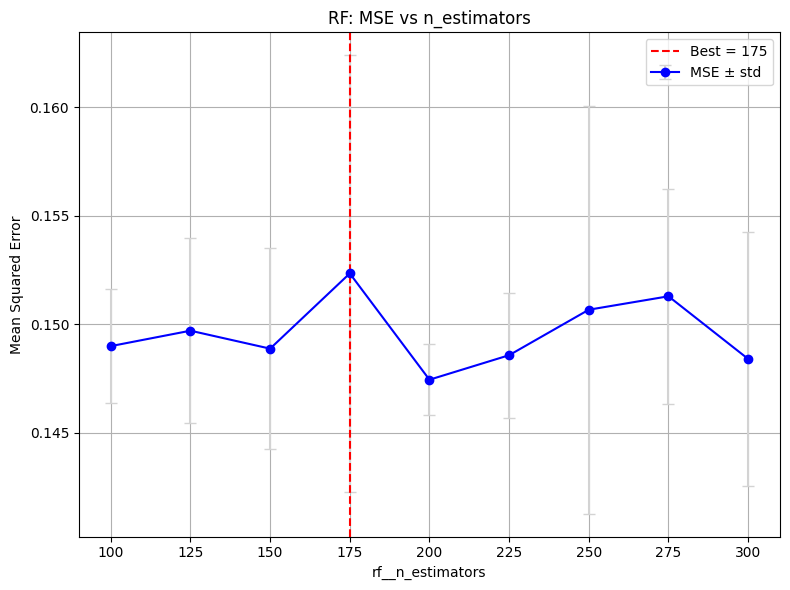

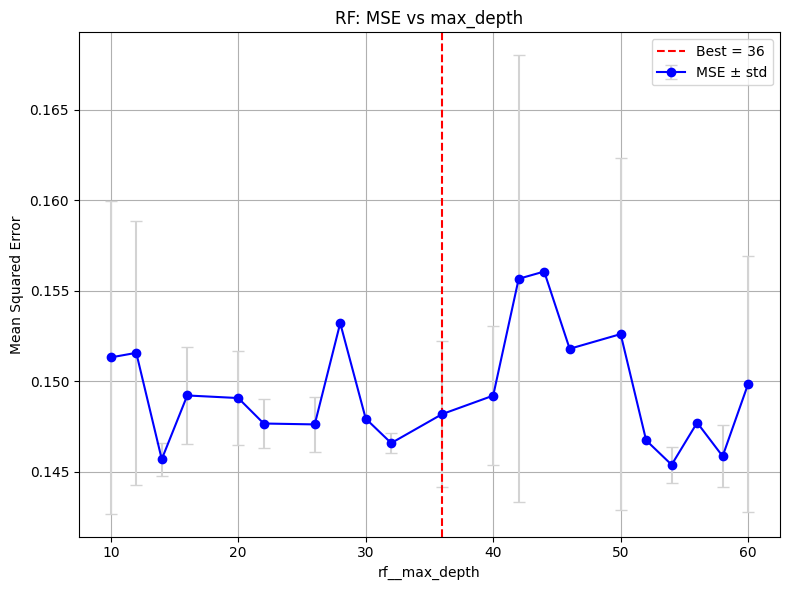

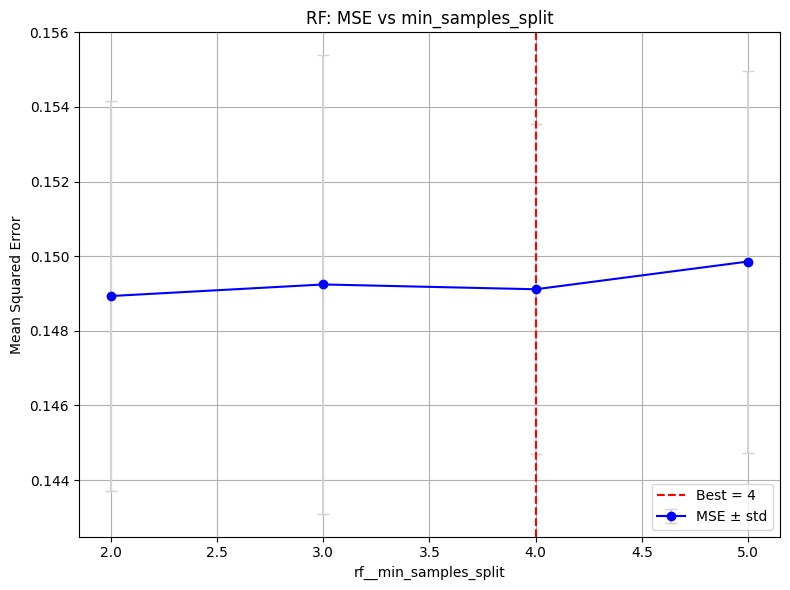

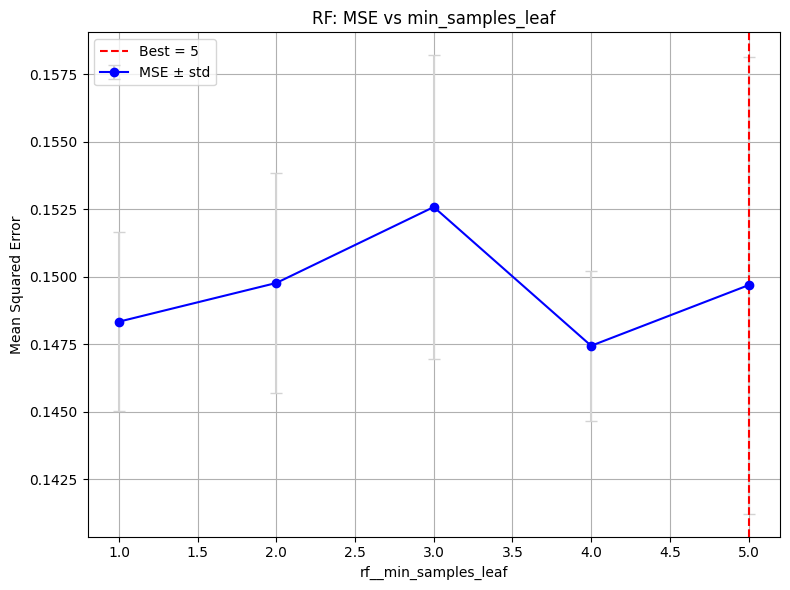

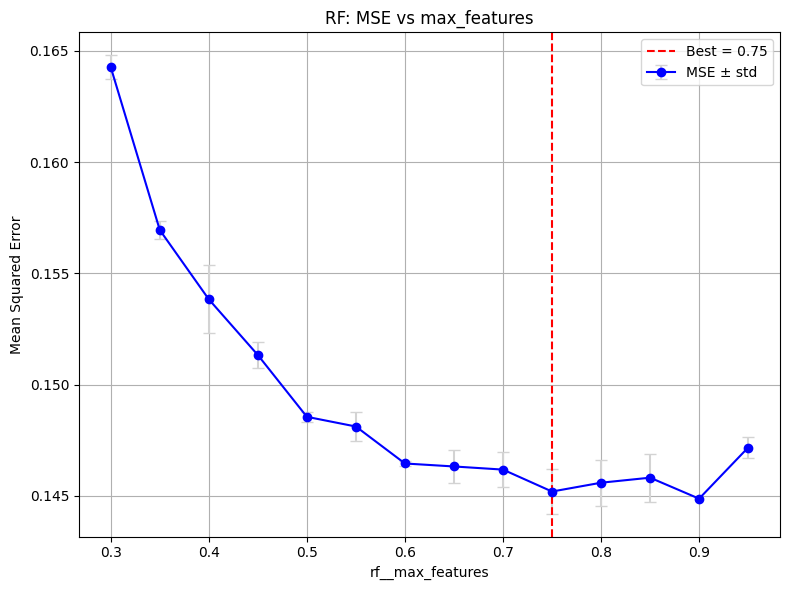

MAE: [0.24415474399132367, 0.25674807276233813, 0.29042496034354126, 0.26744898342657736, 0.2510739118447772, 0.23588940334046074, 0.2679785935279725, 0.277885739803476, 0.278133746513334, 0.2622249275256948, 0.2749464165963195, 0.21373884537088353, 0.3011205694512787, 0.2760421887706551, 0.23973902422079138]
MSE: [0.10268904900574727, 0.1596204879759315, 0.20032026884327256, 0.15592668492737854, 0.11178012721201683, 0.1115502348916934, 0.14928812771806765, 0.13582120596036235, 0.1466588345440717, 0.1782860419709876, 0.1624375144014407, 0.08834829311134638, 0.17658720932509134, 0.17775033945288915, 0.11057785283216104]
RMSE: [0.32045132080512206, 0.39952532832841964, 0.4475715237180227, 0.39487553093016353, 0.3343353514243099, 0.3339913694868378, 0.38637821848296217, 0.36853928686147197, 0.3829606174844506, 0.42223931836221457, 0.4030353761165894, 0.29723440768414816, 0.4202228091442578, 0.42160448224952396, 0.3325324838751262]
R2: [0.8618135363176068, 0.8111366104034156, 0.79215813315

/tmp/ipykernel_1122409/1100372905.py:234: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


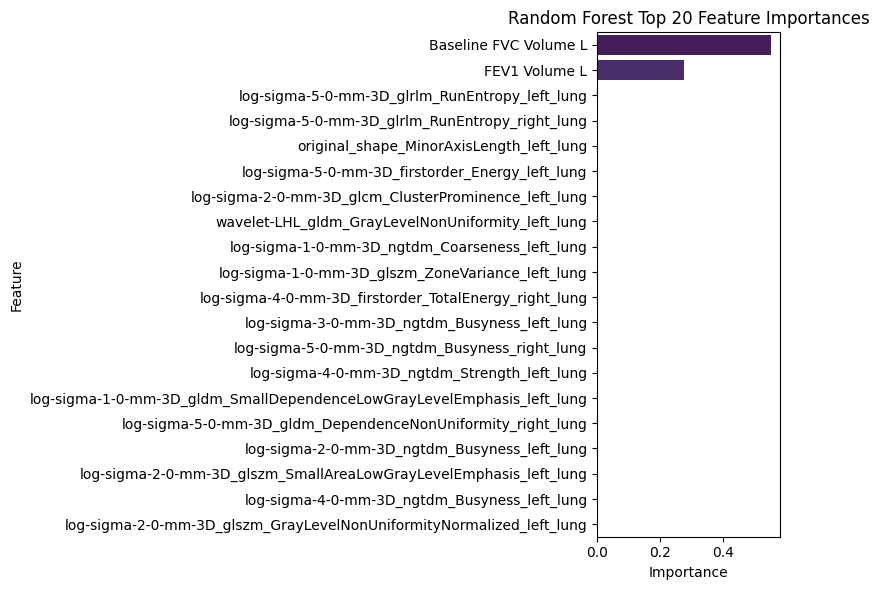

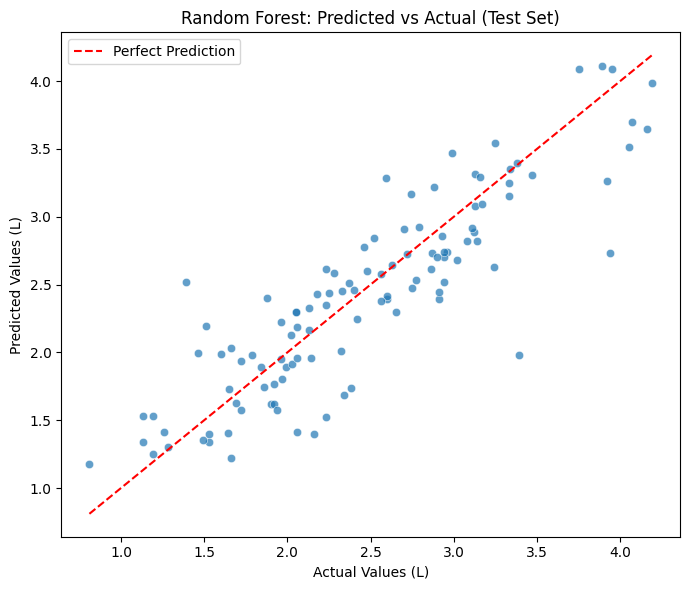

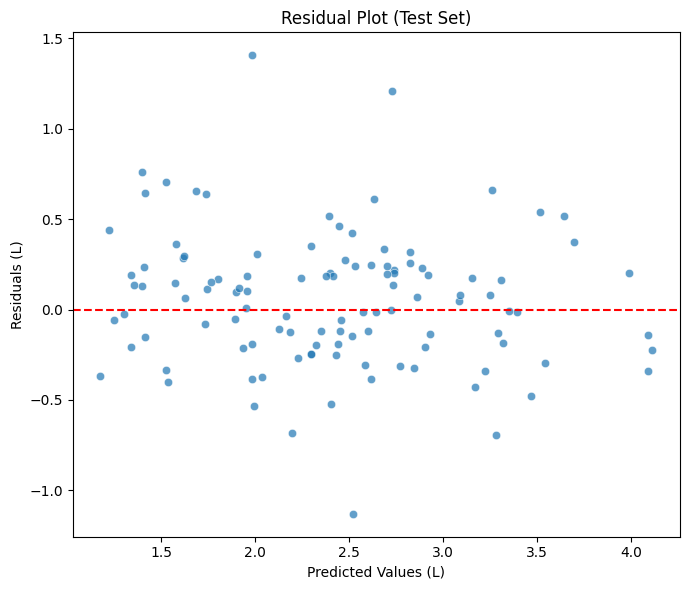


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
141          2.09        3.39       1.982768   1.407232                0.0   
118          2.50        3.94       2.729731   1.210269                0.0   
252          2.62        1.39       2.520411   1.130411                0.0   
166          1.44        2.16       1.399572   0.760428                0.0   
43           1.59        2.23       1.524076   0.705924                0.0   

     Followup_FVC_Week  
141               50.0  
118               48.0  
252               56.0  
166               56.0  
43                52.0  


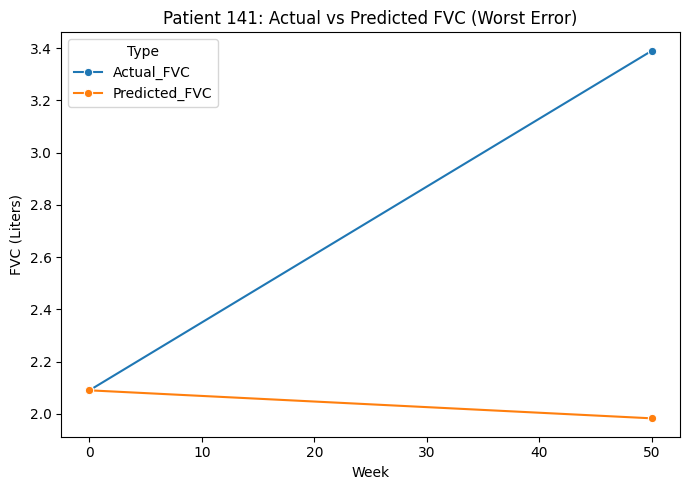

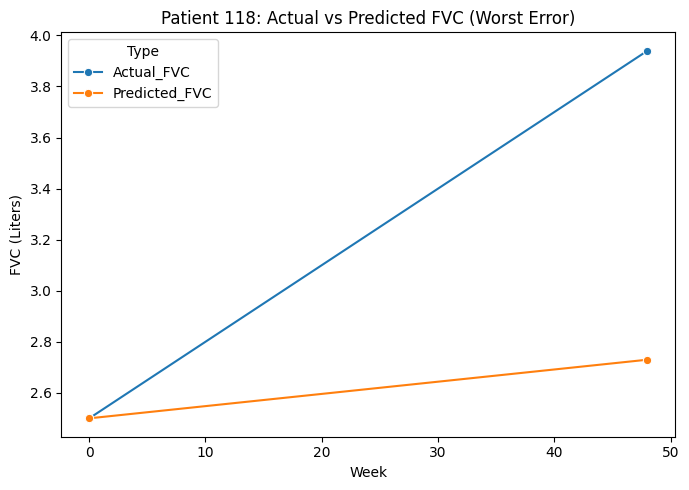

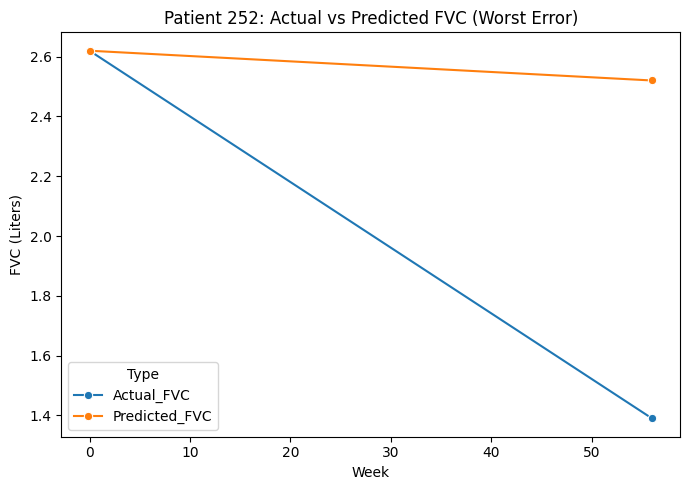

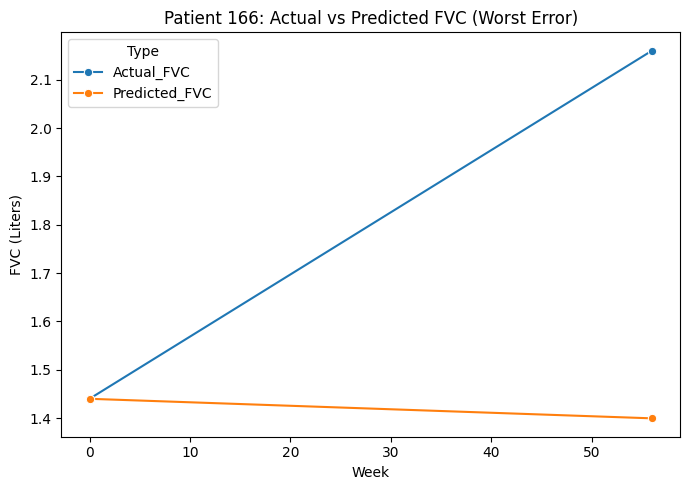

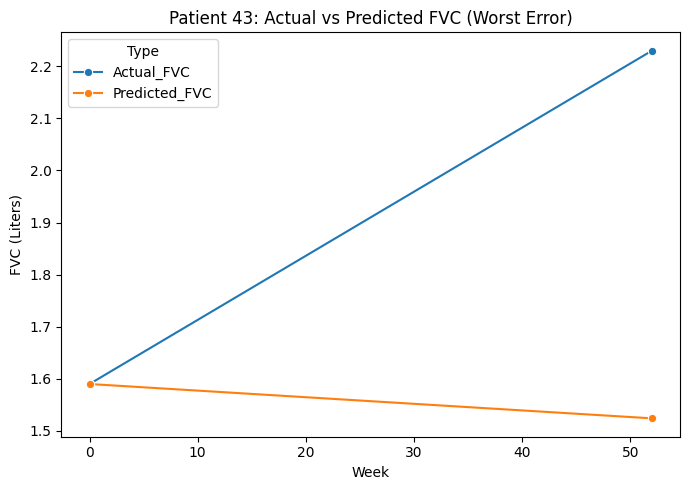


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
446          1.91        1.96       1.949427   0.010573                0.0   
245          2.53        2.63       2.641161   0.011161                0.0   
396          0.97        1.28       1.303283   0.023283                0.0   
244          3.07        3.13       3.081913   0.048087                0.0   
511          1.43        1.49       1.352642   0.137358                0.0   

     Followup_FVC_Week  
446               52.0  
245               48.0  
396               55.0  
244               51.0  
511               54.0  


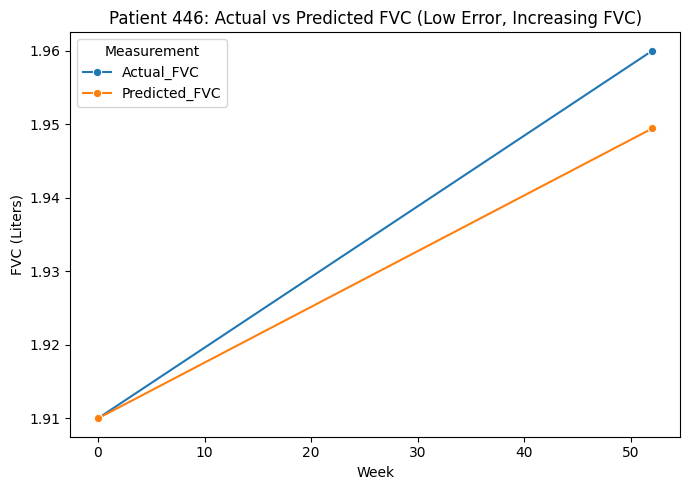

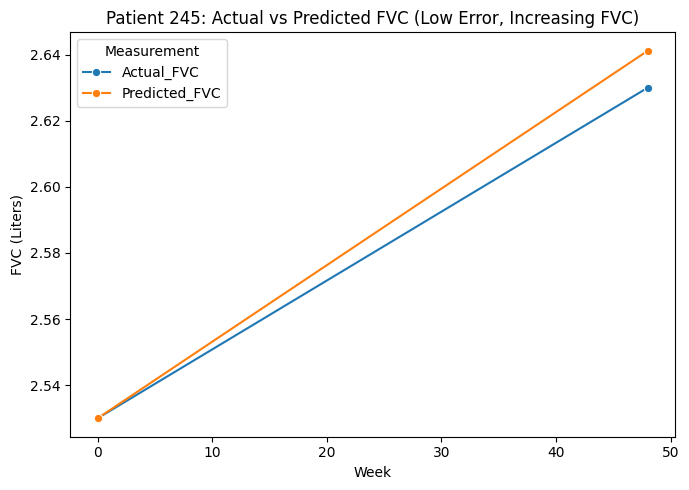

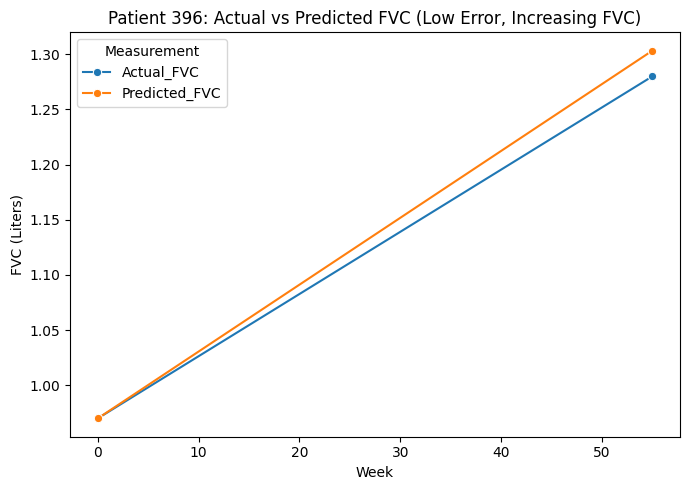

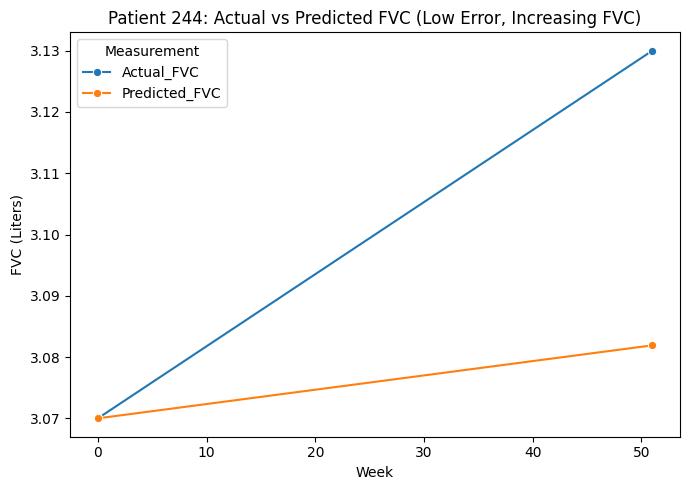

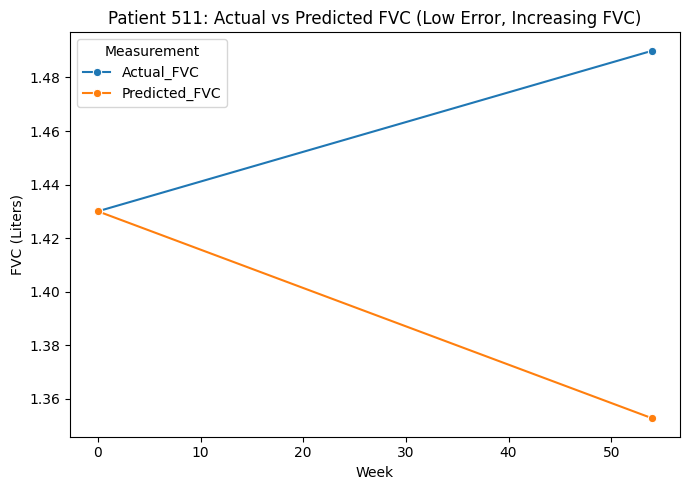

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


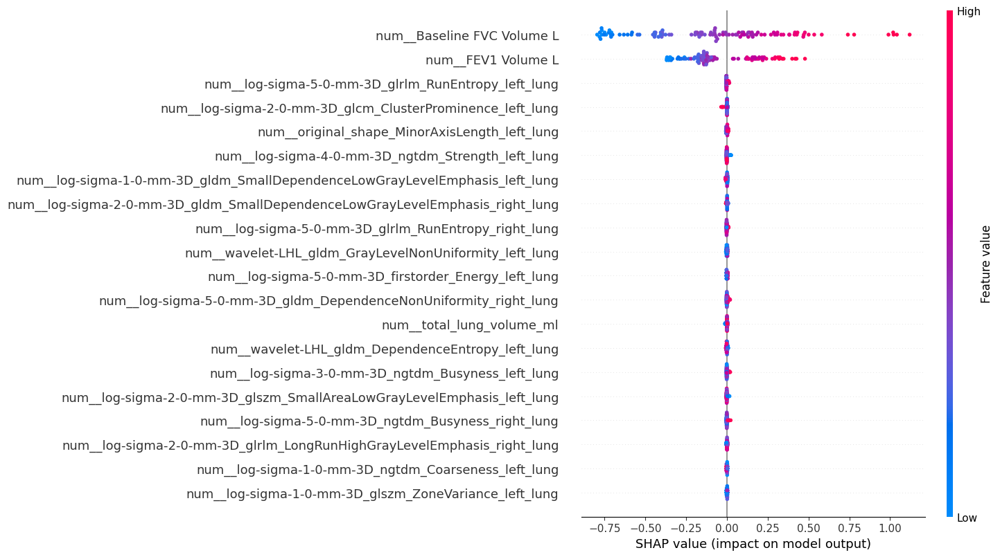

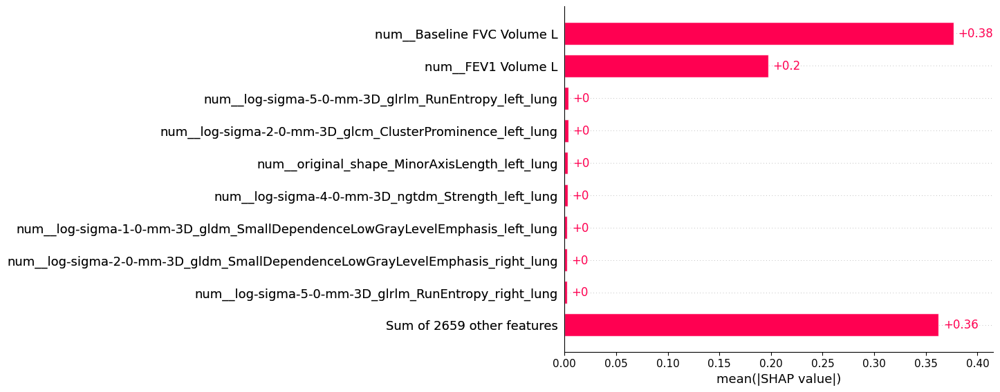

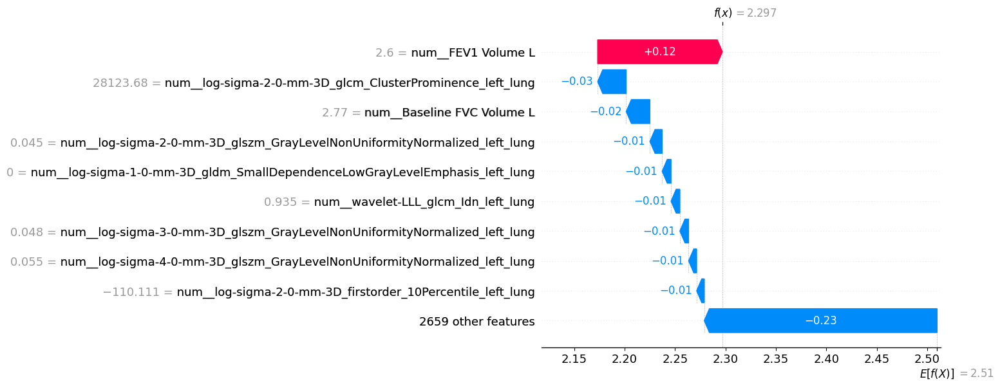

In [ ]:
# all combined radiomics + clinical features
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization_8_1_ratio.pkl")
# Radiomics: automatically grab all columns with certain prefixes
Radiomics_data = [col for col in X_train.columns 
                  if col.startswith(("wavelet", "original", "log-sigma"))]
all_features = Clinical_Contineous_data + Radiomics_data  + ['left_lung_volume_ml', 'right_lung_volume_ml', 'total_lung_volume_ml', 'ggo_left_ml', 'ggo_right_ml', 'ggo_total_ml', 'ggo_percent_total', 'fib_left_ml', 'fib_right_ml', 'fib_total_ml', 'fib_percent_total']



X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)

results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, all_features, all_features, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/RF_model/RF_With_All_Clinical_Radiomics_without_harmonization.pkl")

Numeric features: ['original_shape_Elongation_right_lung', 'original_shape_Flatness_right_lung', 'original_shape_LeastAxisLength_right_lung', 'original_shape_MajorAxisLength_right_lung', 'original_shape_Maximum2DDiameterColumn_right_lung', 'original_shape_Maximum2DDiameterRow_right_lung', 'original_shape_Maximum2DDiameterSlice_right_lung', 'original_shape_Maximum3DDiameter_right_lung', 'original_shape_MeshVolume_right_lung', 'original_shape_MinorAxisLength_right_lung', 'original_shape_Sphericity_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_shape_SurfaceVolumeRatio_right_lung', 'original_shape_VoxelVolume_right_lung', 'original_firstorder_10Percentile_right_lung', 'original_firstorder_90Percentile_right_lung', 'original_firstorder_Energy_right_lung', 'original_firstorder_Entropy_right_lung', 'original_firstorder_InterquartileRange_right_lung', 'original_firstorder_Kurtosis_right_lung', 'original_firstorder_Maximum_right_lung', 'original_firstorder_MeanAbsoluteDeviatio

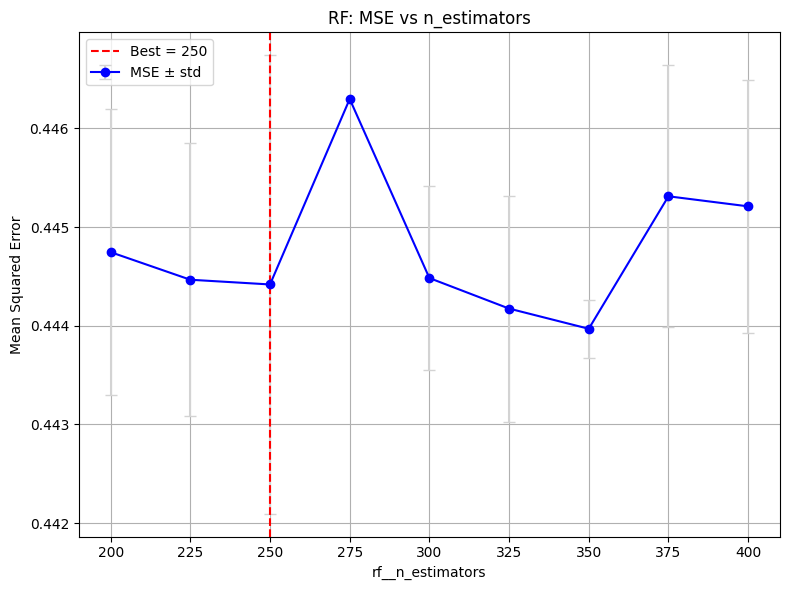

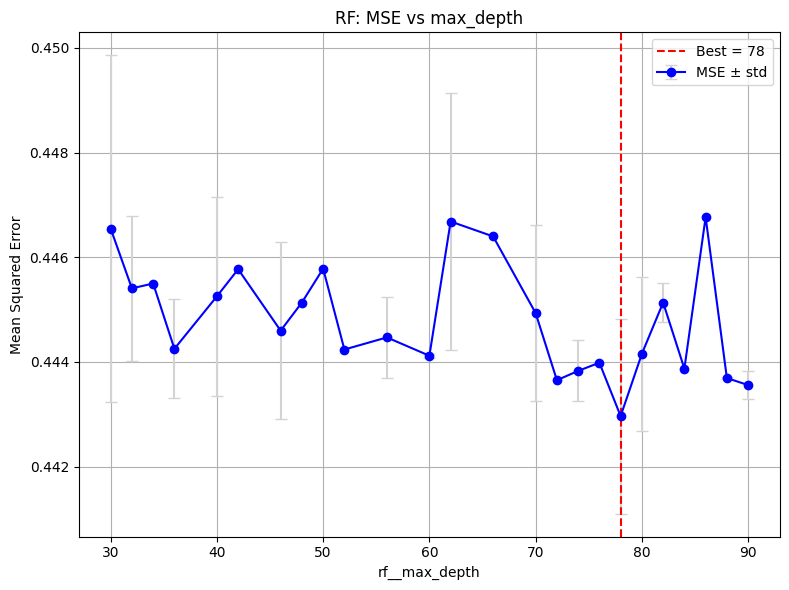

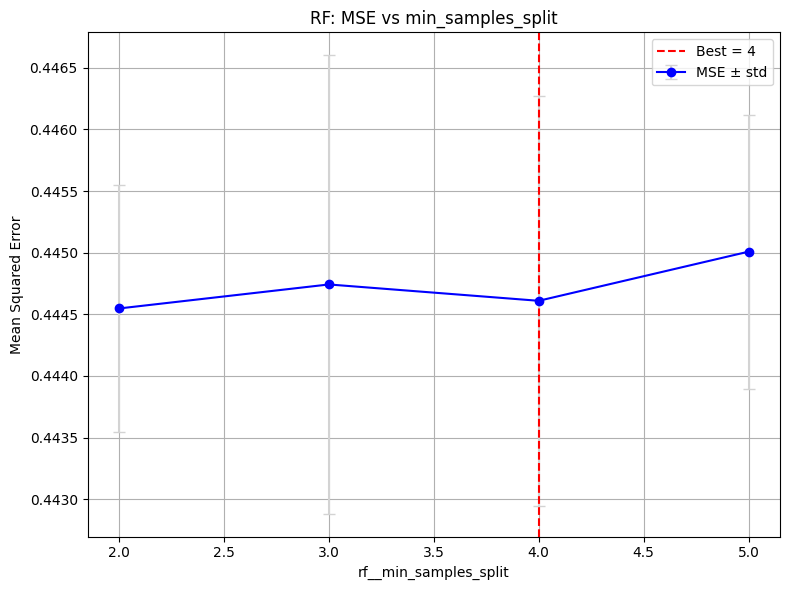

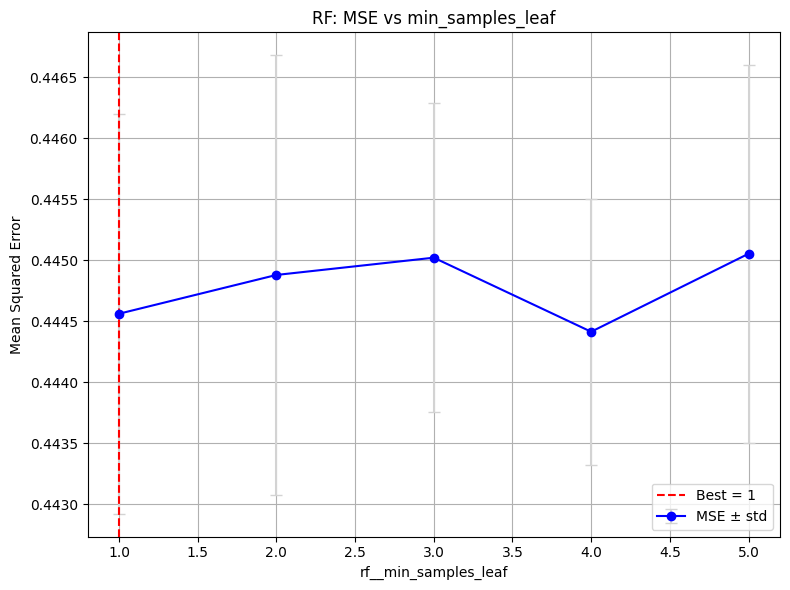

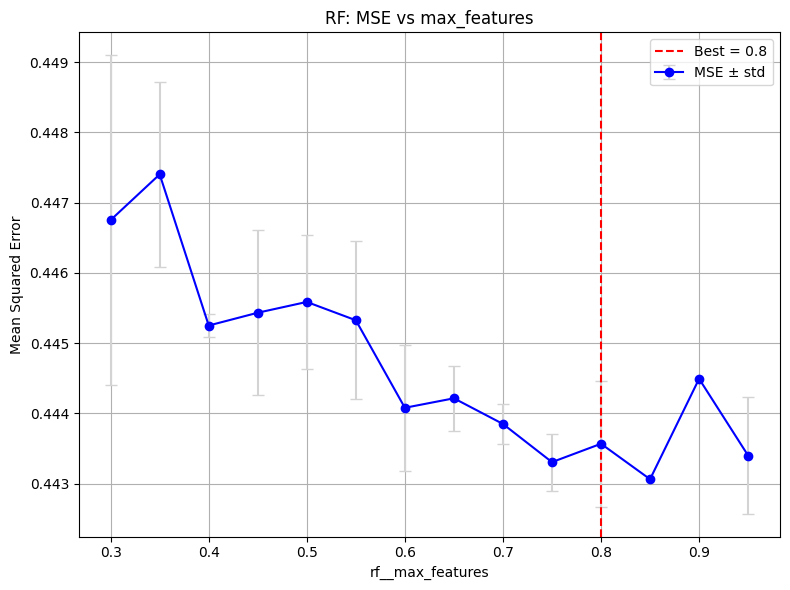

MAE: [0.5751287663909148, 0.526885219327197, 0.5626767472669365, 0.44665478117765983, 0.5163945204865137, 0.49707157358543846, 0.5869148793739818, 0.4981273087021708, 0.47109916955629794, 0.5608052370610324, 0.606799485133669, 0.487090682326218, 0.5161916190929814, 0.48413345747466097, 0.5320381343598286]
MSE: [0.48511766875483325, 0.4550681659968342, 0.5090394560548971, 0.33685931375371464, 0.4263346173304527, 0.4263702749221831, 0.5328605851979183, 0.4002450029194095, 0.345135069000903, 0.5047878216502778, 0.5910006663324344, 0.3575200002579964, 0.3977148741852143, 0.4122185964633994, 0.44442668042667594]
RMSE: [0.6965038899782493, 0.6745874042678489, 0.7134700106205566, 0.5803958250657172, 0.6529430429451352, 0.652970347659205, 0.7299730030610162, 0.6326491941980243, 0.5874819733412278, 0.7104842163273424, 0.7687656771295363, 0.5979297619771041, 0.6306463939365817, 0.642042519202116, 0.6666533435202107]
R2: [0.4578908224363416, 0.4514420109043422, 0.436406258647728, 0.45489121489765

/tmp/ipykernel_1122409/2013018324.py:243: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


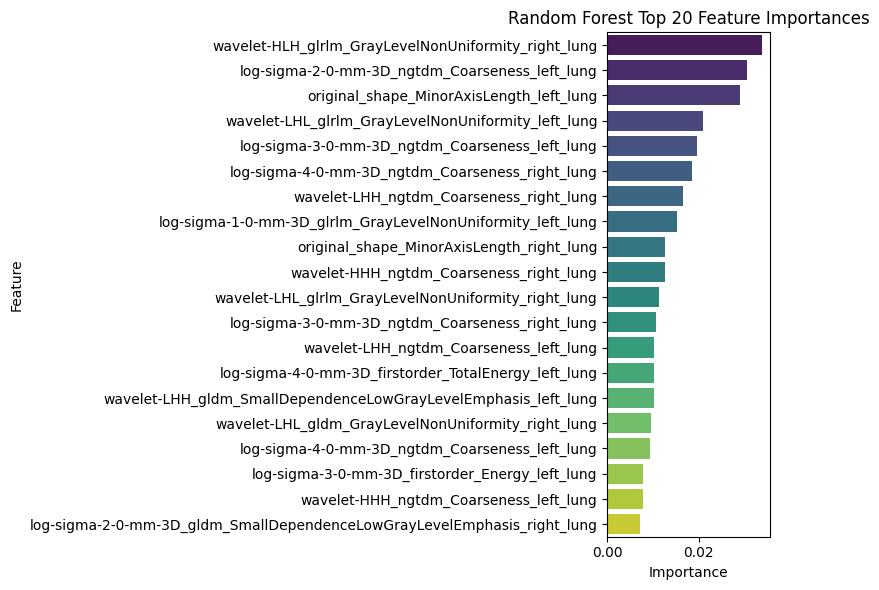

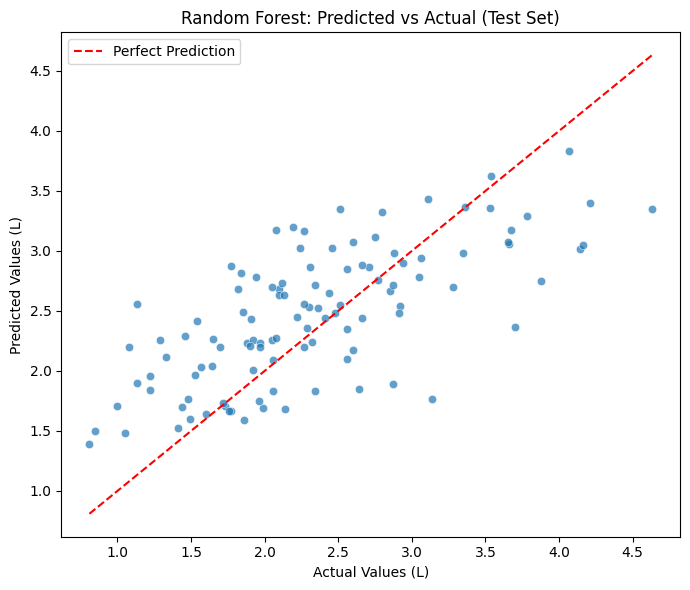

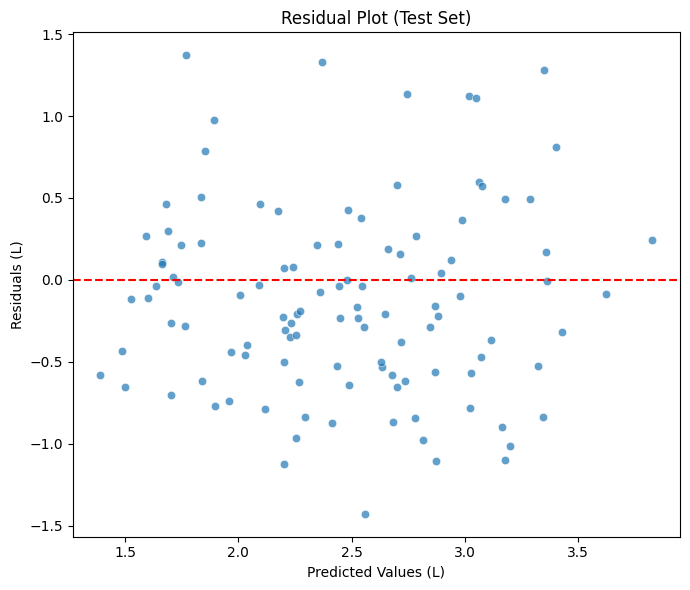


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
368          1.56        1.13       2.557468   1.427468                0.0   
475          3.26        3.14       1.769221   1.370779                0.0   
3            3.73        3.70       2.367588   1.332412                0.0   
163          4.73        4.63       3.350092   1.279908                0.0   
81           3.59        3.88       2.746068   1.133932                0.0   

     Followup_FVC_Week  
368               49.0  
475               52.0  
3                 55.0  
163               49.0  
81                52.0  


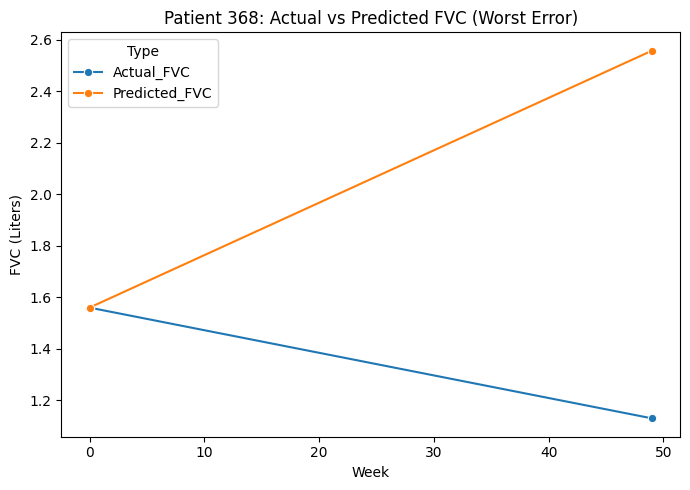

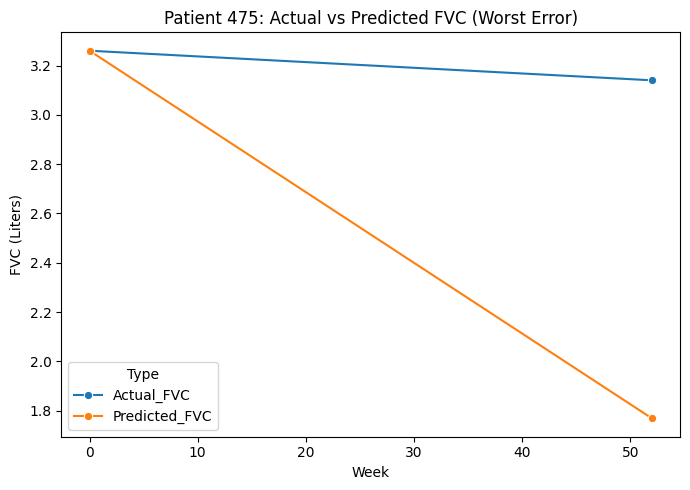

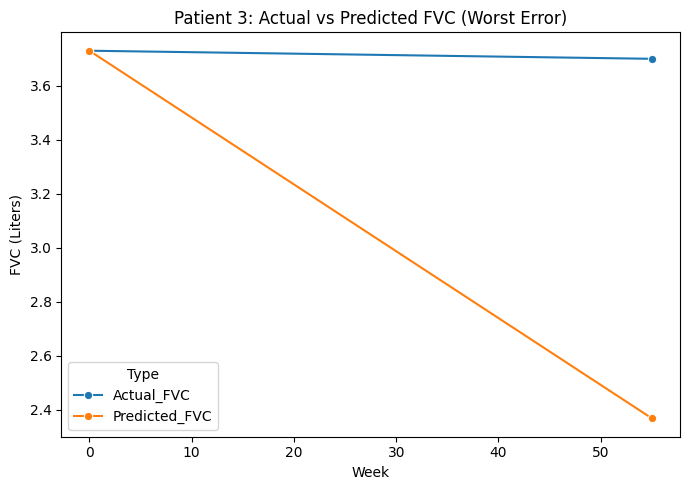

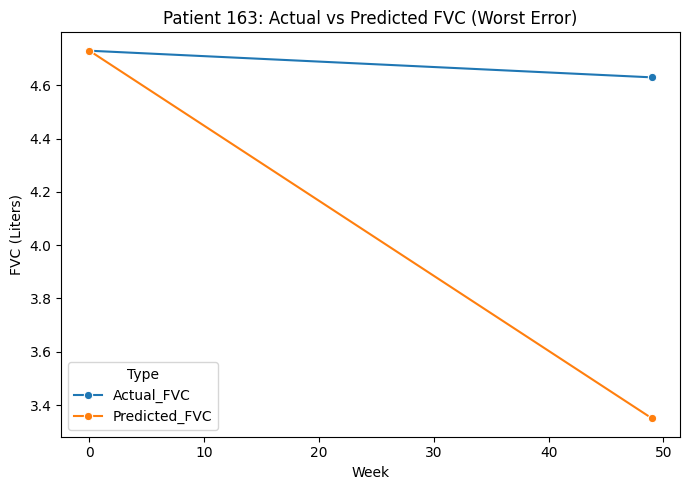

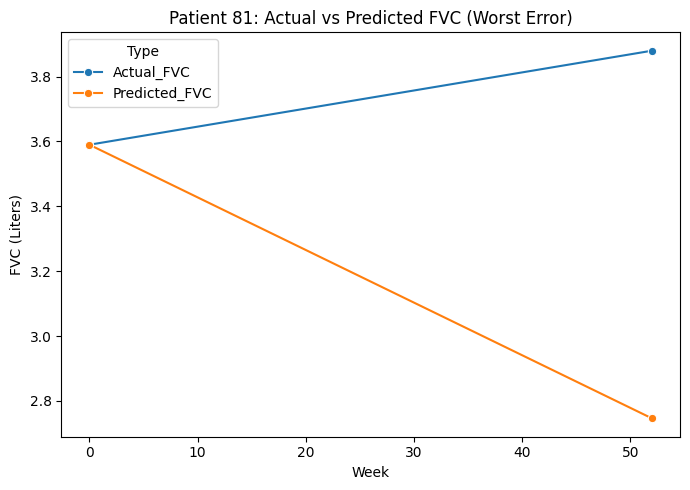


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
430          3.22       3.360       3.364460   0.004460                0.0   
273          2.51       2.771       2.761725   0.009275                0.0   
426          1.66       1.720       1.734154   0.014154                0.0   
108          2.18       2.320       2.243165   0.076835                0.0   
380          3.10       3.540       3.625030   0.085030                0.0   

     Followup_FVC_Week  
430               54.0  
273               49.0  
426               52.0  
108               48.0  
380               53.0  


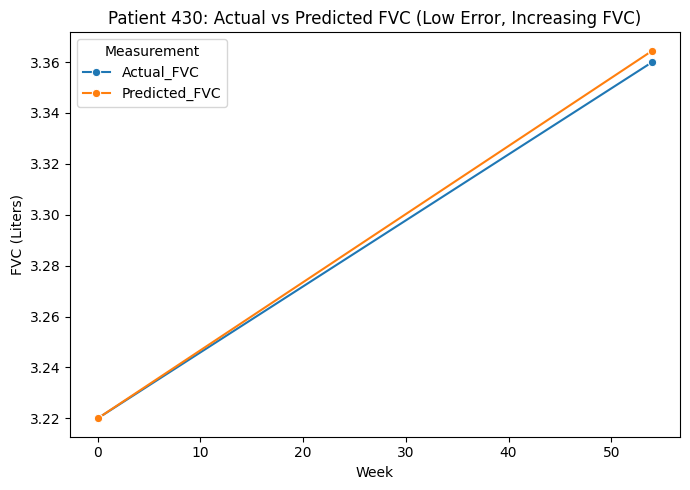

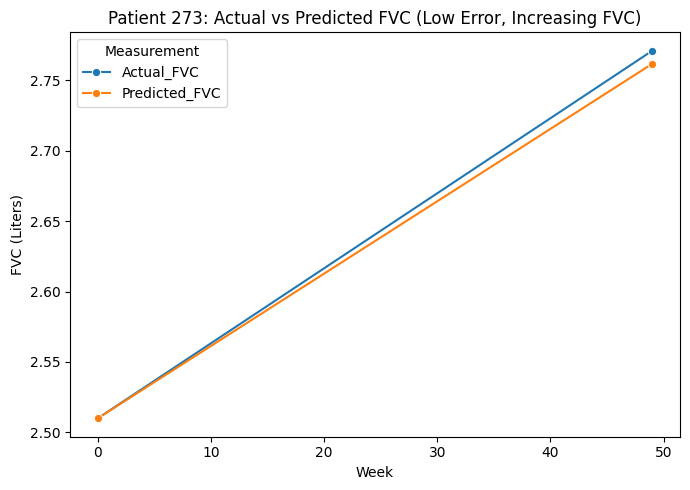

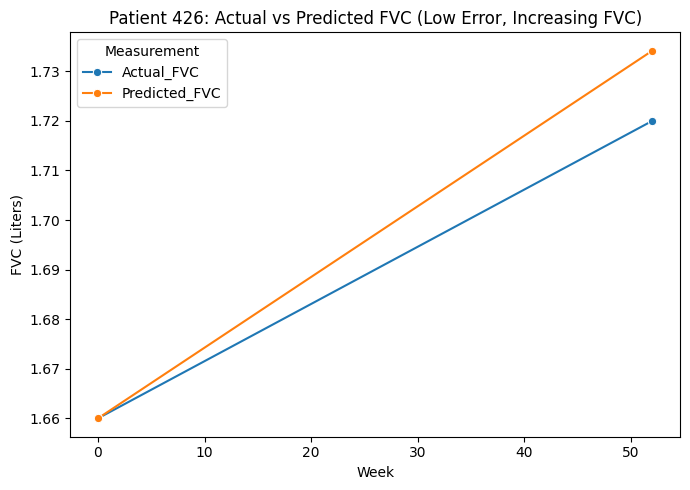

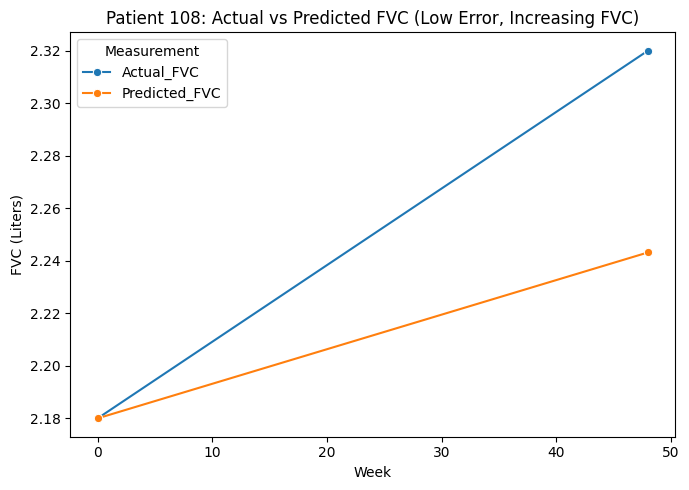

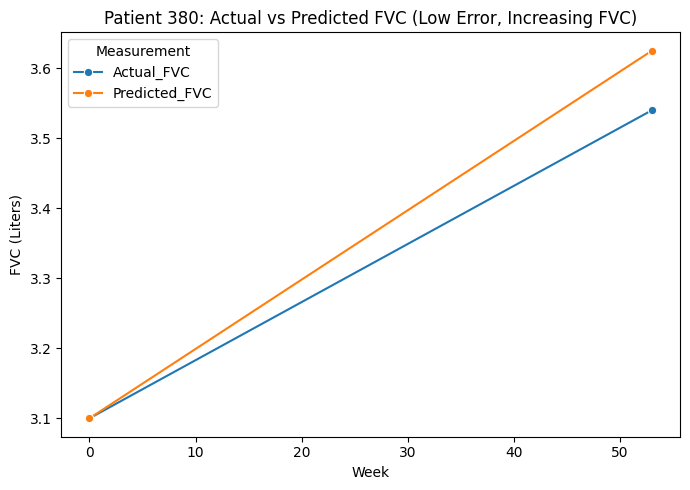

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


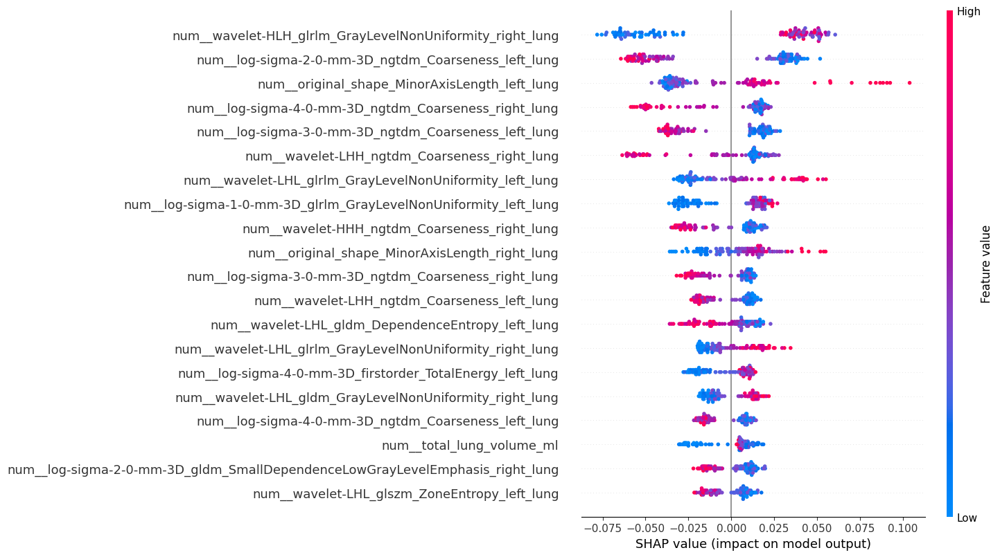

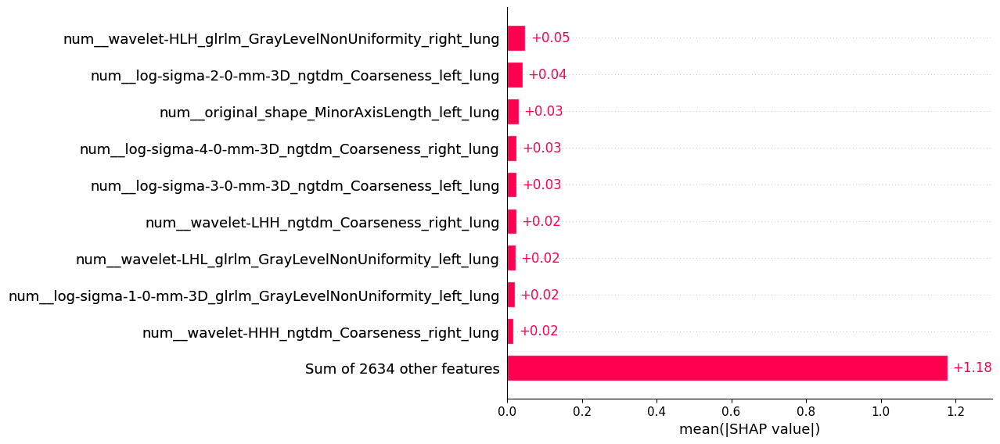

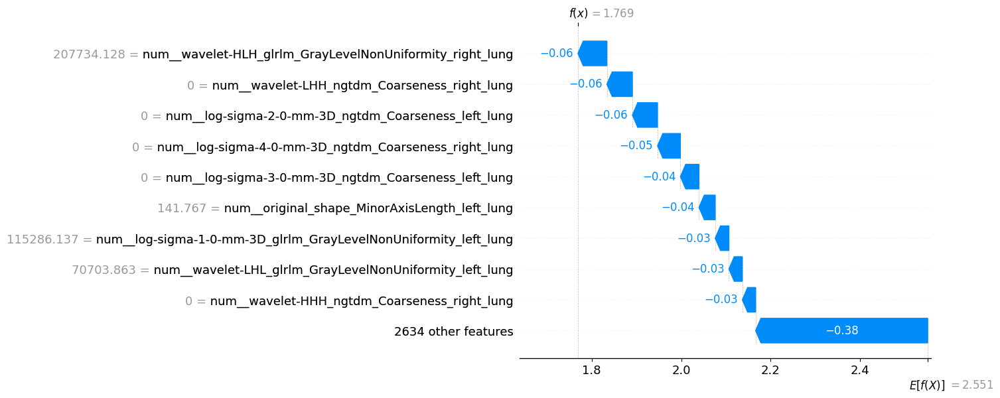

In [14]:
# # all radiomics-only features
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
# Radiomics: automatically grab all columns with certain prefixes
Radiomics_data = [col for col in X_train.columns 
                  if col.startswith(("wavelet", "original", "log-sigma"))]
all_features = Radiomics_data  + ['left_lung_volume_ml', 'right_lung_volume_ml', 'total_lung_volume_ml', 'ggo_left_ml', 'ggo_right_ml', 'ggo_total_ml', 'ggo_percent_total', 'fib_left_ml', 'fib_right_ml', 'fib_total_ml', 'fib_percent_total']

Clinical_Categorical_data = []

X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)

results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, all_features, all_features, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/RF_model/RF_With_all_radiomics-only_features_without_harmonization.pkl")

['Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
One-hot features: ['Primary Diagnosis_CHP', 'Primary Diagnosis_CTD-ILD', 'Primary Diagnosis_Emphysema', 'Primary Diagnosis_Exposure-related', 'Primary Diagnosis_Fibrotic HP (FHP)', 'Primary Diagnosis_INSIP', 'Primary Diagnosis_IPF', 'Primary Diagnosis_Idiopathic OP', 'Primary Diagnosis_Idiopathic pleuroparenchymal fibroelastosis (IPPFE)', 'Primary Diagnosis_Miscellaneous', 'Primary Diagnosis_NSIP', 'Primary Diagnosis_No information', 'Primary Diagnosis_Occupational-related ILD', 'Primary Diagnosis_Sarcoidosis', 'Primary Diagnosis_Smoking Related ILD (DIP / RB / RB-ILD)', 'Primary Diagnosis_UILD', 'Sex_Female', 'Sex_Male', 'Smoking History_Active Smoker', 'Smoking History_Ex Smoker', 'Smoking History_Never Smoker', 'Smoking History_No Knowledge']
number of features given as input: 25
Fitting 15 folds for each of 50 candidates, totalling 750 fits

Best hyperparameters fou

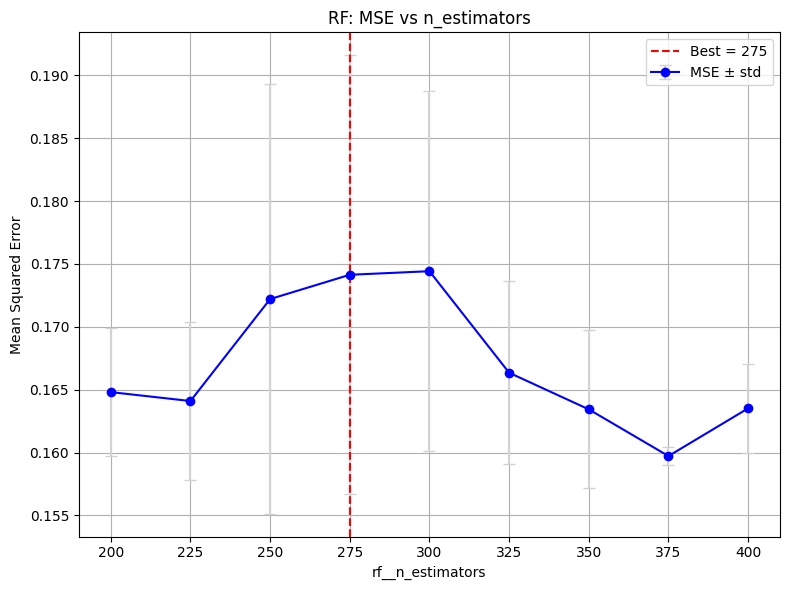

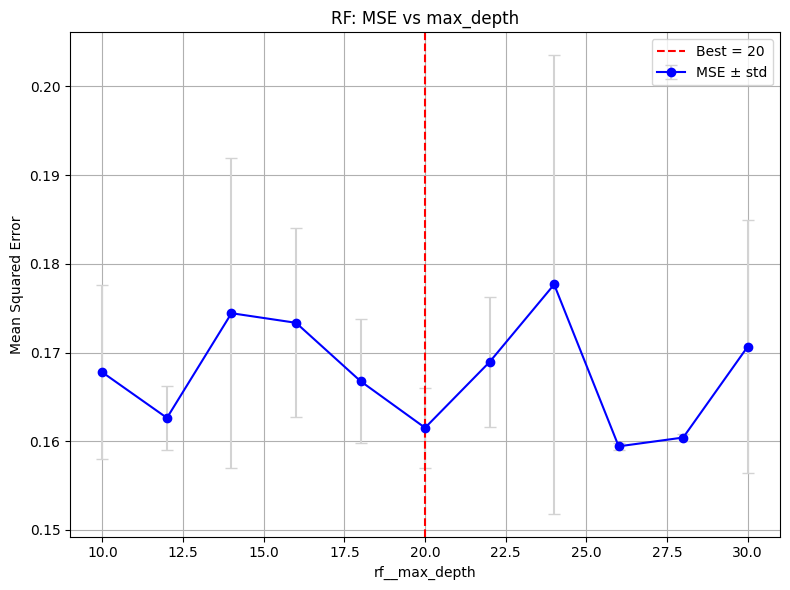

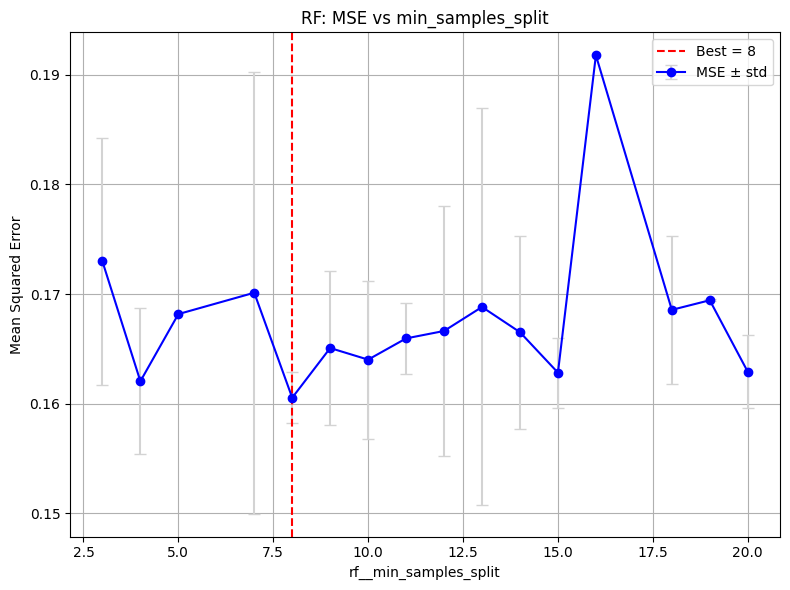

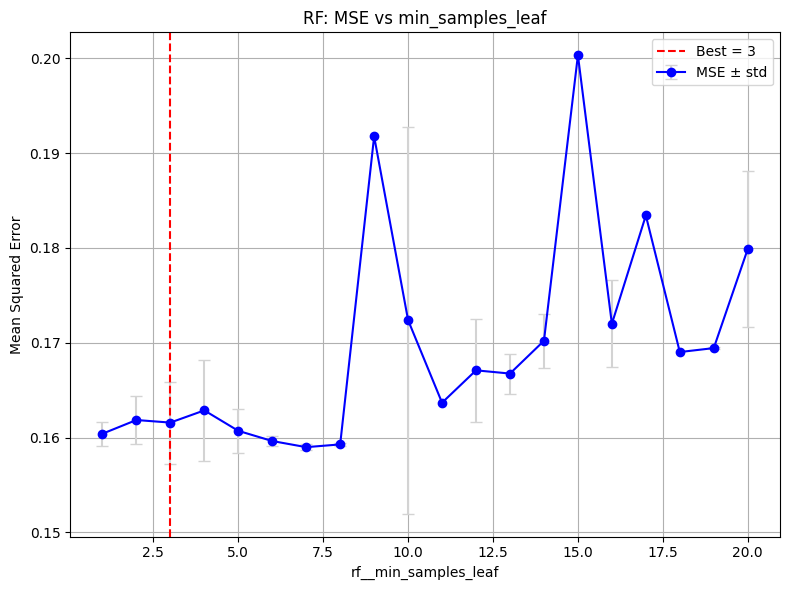

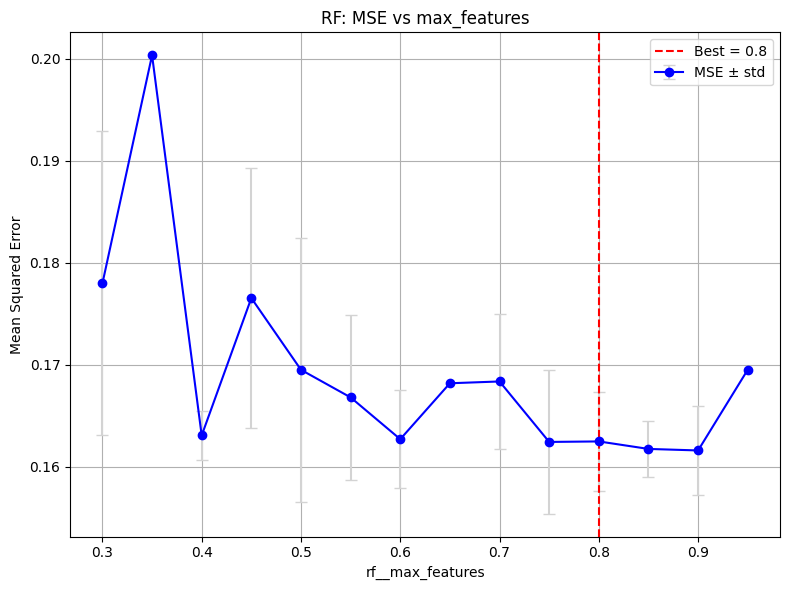

MAE: [0.2621043814971213, 0.2358571677636907, 0.31699640863191586, 0.2904955672342741, 0.266913783754042, 0.2441238329655896, 0.3198008427066876, 0.2616652115708559, 0.23024263802325262, 0.3043963440988061, 0.33590055350870507, 0.24345821624783034, 0.26602450108680736, 0.2644418301279727, 0.24941749157976814]
MSE: [0.13395652031511968, 0.12911745146393633, 0.21892240850341757, 0.16835905069726206, 0.14757994132084937, 0.1157453164727596, 0.19123140897426405, 0.15955826344298546, 0.11813850892007113, 0.21067412888989523, 0.2479853821702901, 0.1169412949847992, 0.15153045136720728, 0.13627451771309393, 0.1269133382013514]
RMSE: [0.3660007108123148, 0.3593291686795498, 0.4678914494873972, 0.4103157938676771, 0.3841613480308103, 0.34021363357860834, 0.43730013603275275, 0.39944744766112283, 0.3437128291467619, 0.4589925150695763, 0.4979813070490599, 0.34196680392225093, 0.3892691246004585, 0.3691537859931738, 0.3562489834390428]
R2: [0.8503062994103829, 0.844356483655449, 0.757615450420045

/tmp/ipykernel_3300194/3670626953.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


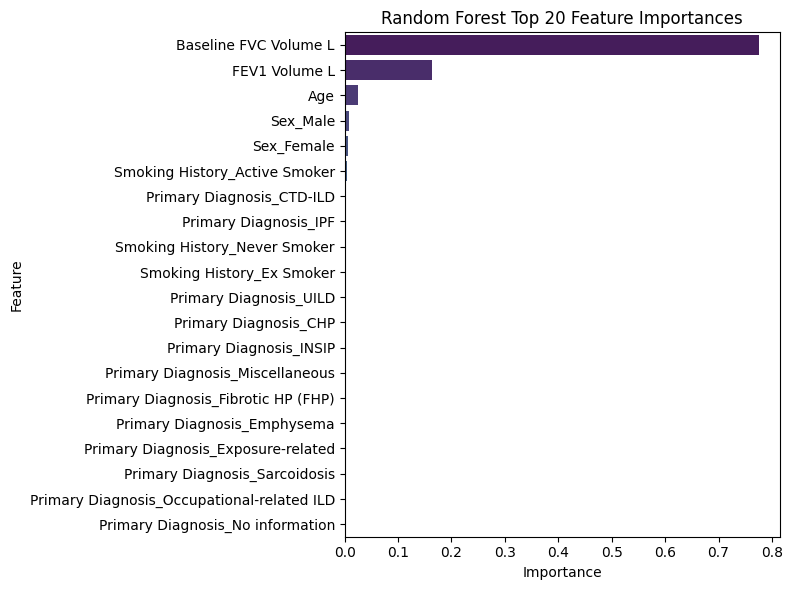

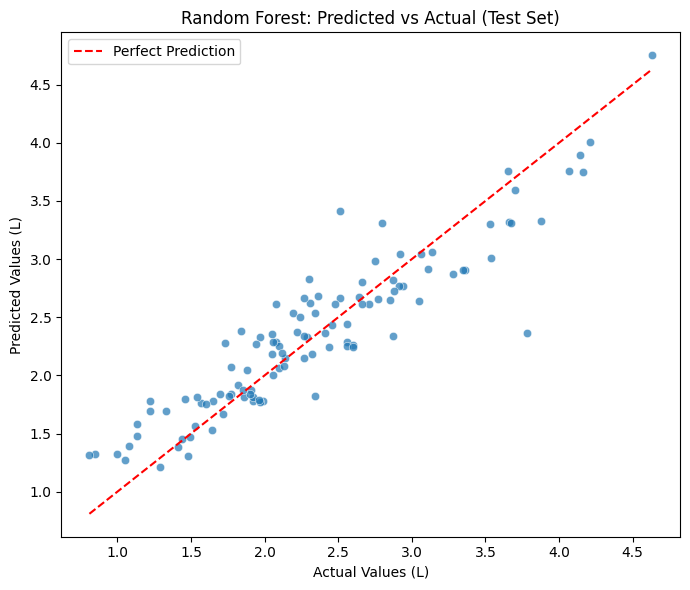

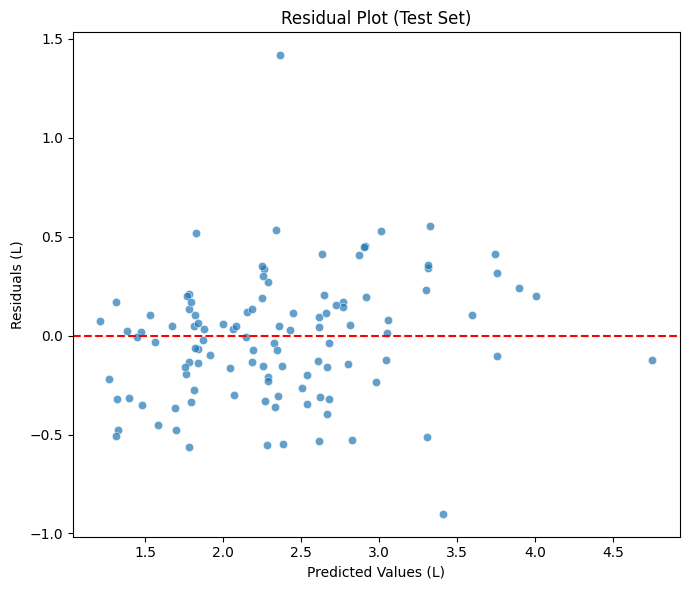


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
123          2.23        3.78       2.363335   1.416665                0.0   
152          3.63        2.51       3.410470   0.900470                0.0   
233          1.98        1.22       1.782560   0.562560                0.0   
81           3.59        3.88       3.325175   0.554825                0.0   
326          2.37        1.73       2.281784   0.551784                0.0   

     Followup_FVC_Week  
123               51.0  
152               53.0  
233               54.0  
81                52.0  
326               56.0  


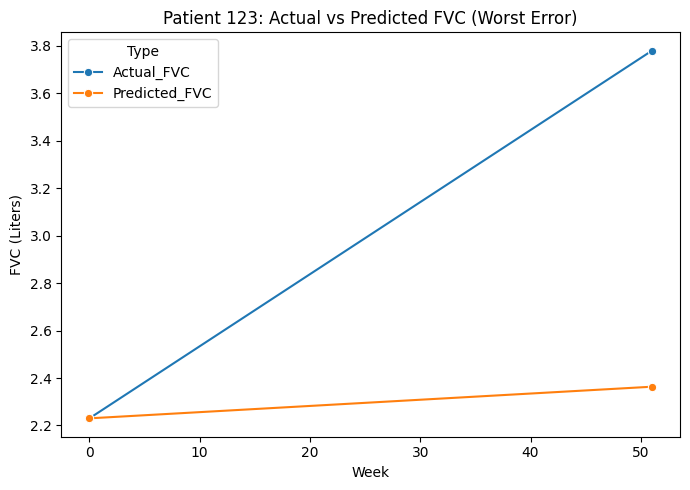

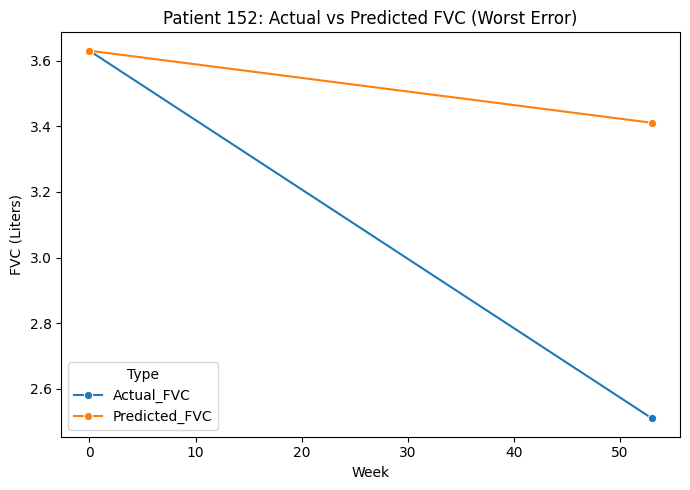

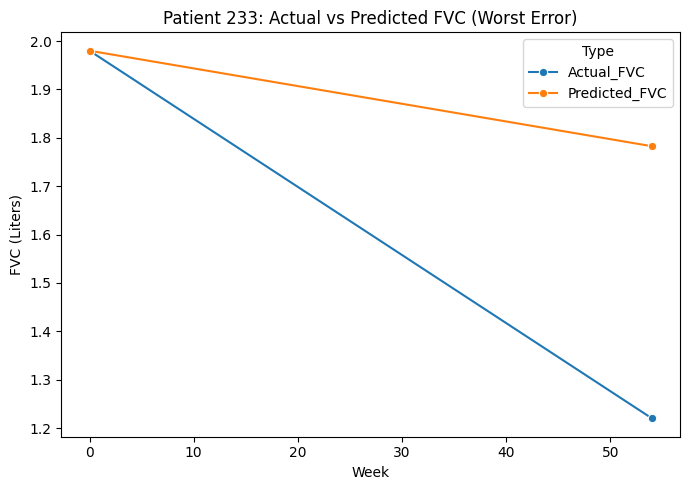

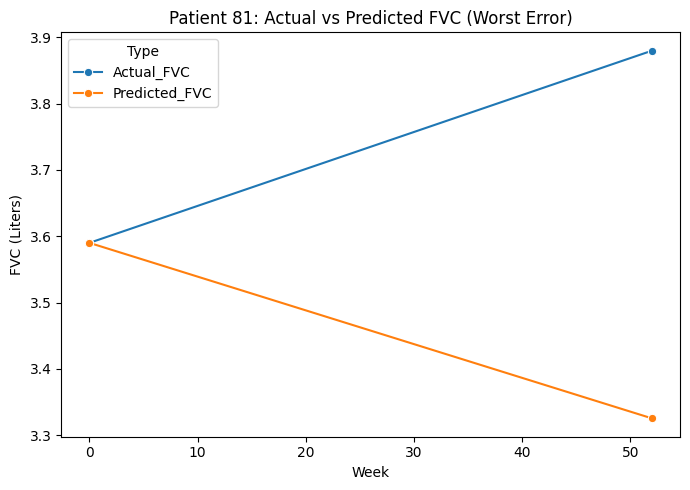

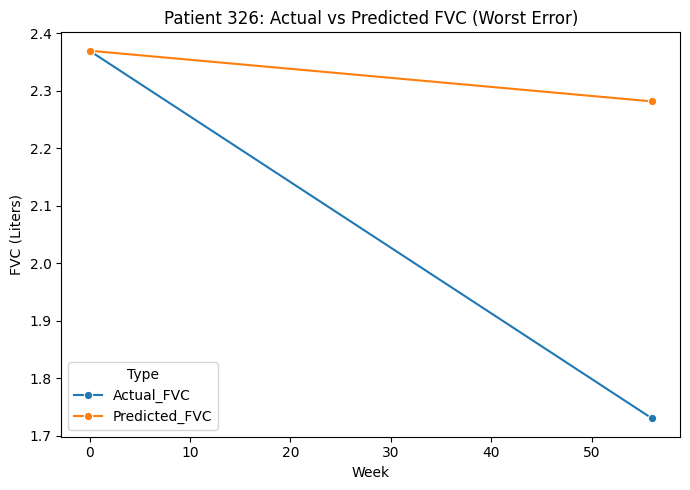


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
264          1.19        1.44       1.449482   0.009482                0.0   
511          1.43        1.49       1.473626   0.016374                0.0   
8            1.32        1.41       1.386477   0.023523                0.0   
100          2.35        2.46       2.429662   0.030338                0.0   
514          2.65        2.66       2.617539   0.042461                0.0   

     Followup_FVC_Week  
264               52.0  
511               54.0  
8                 52.0  
100               53.0  
514               52.0  


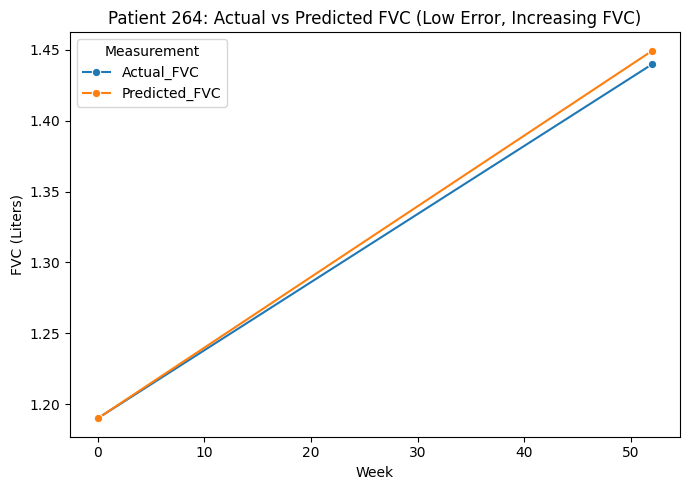

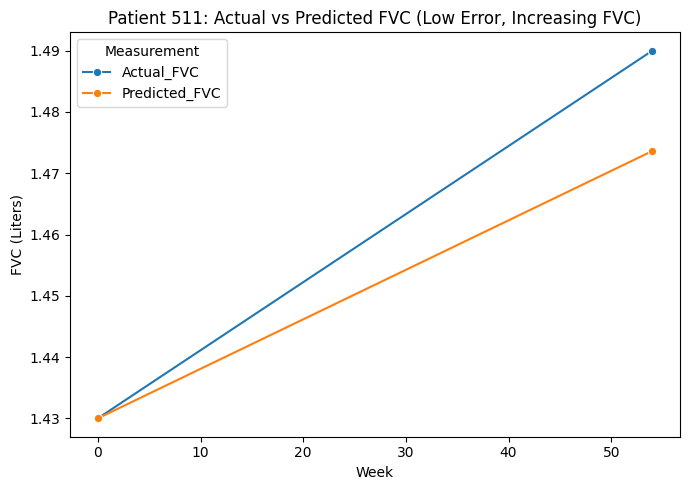

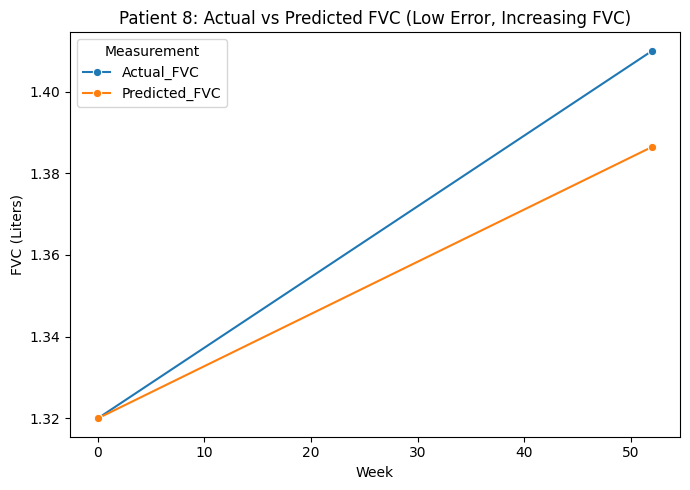

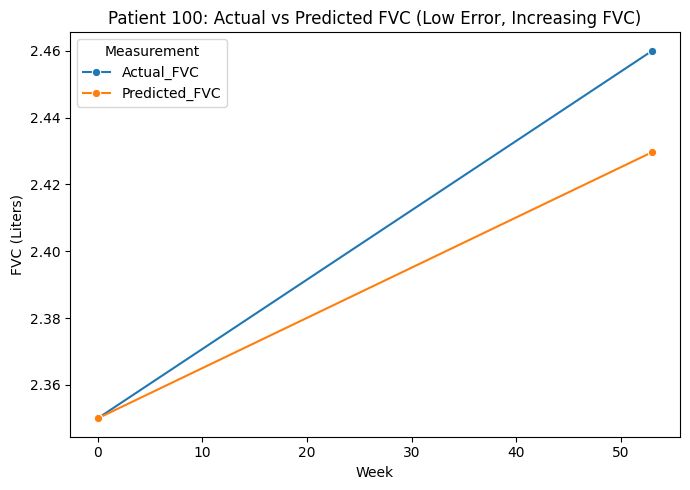

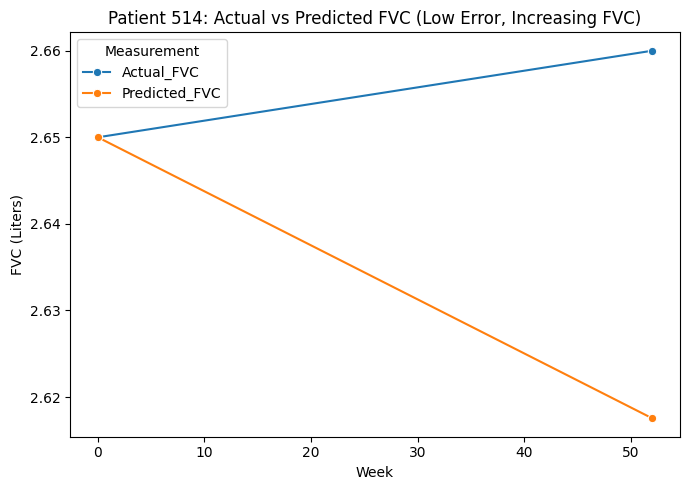

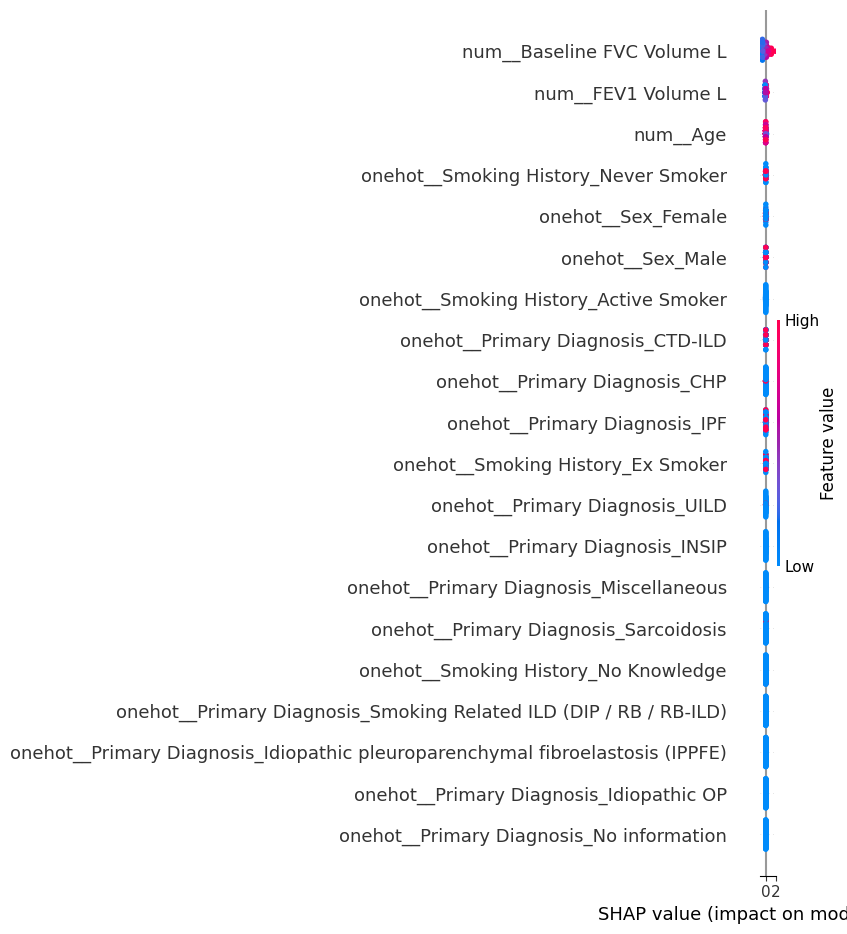

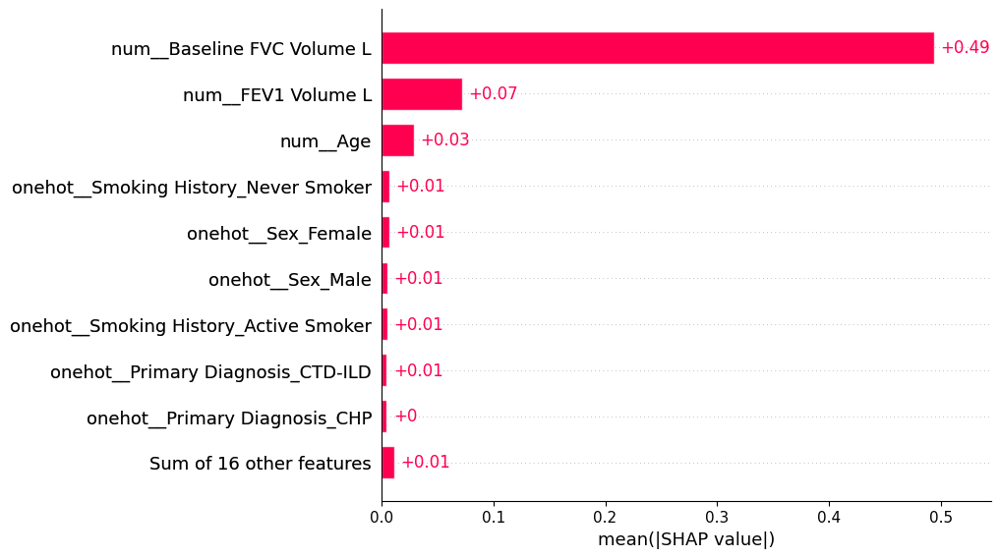

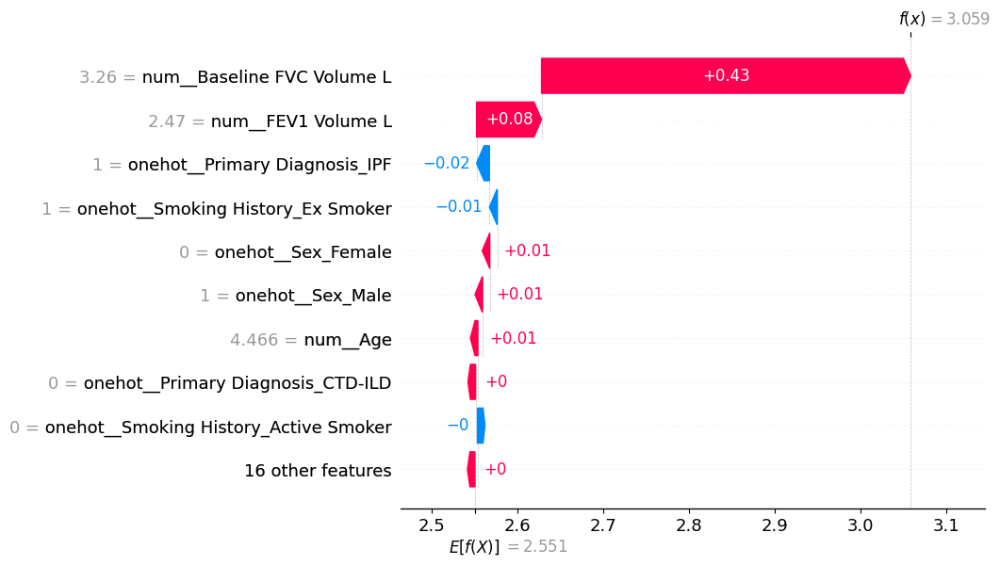

In [14]:
#all clinical-only features
selected_features = []
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)


# Run experiments
results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/RF_model/RF_with_all_clinical-only_features_without_harmonization.pkl")

Model Training using Selected Features

['wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_left_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_left_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
One-hot features: ['Primary Diagnosis_CHP', 'Primary Diagnosis_CTD-ILD', 'Primary Diagnosis_Emphysema', 'Primary Diagnosis_Exposure-related', 'Primary Diagnosis_Fibrotic HP (FHP)', 'Prim

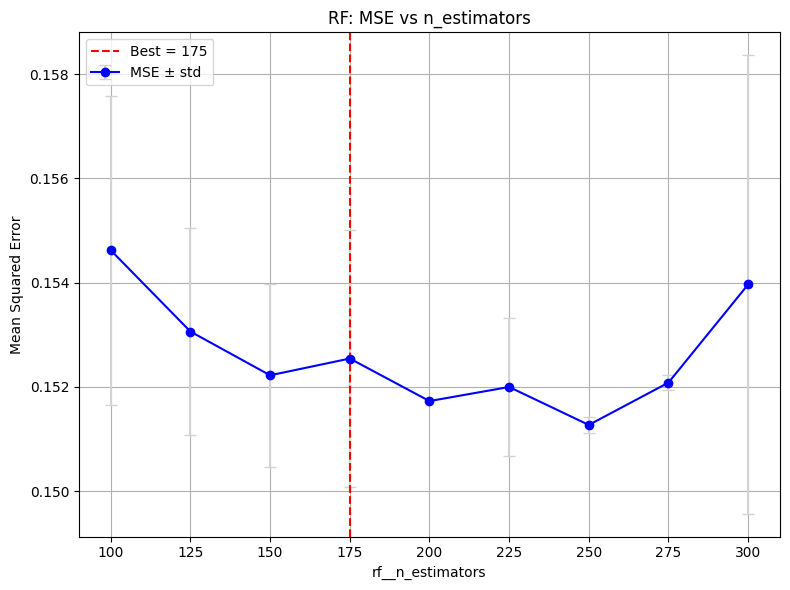

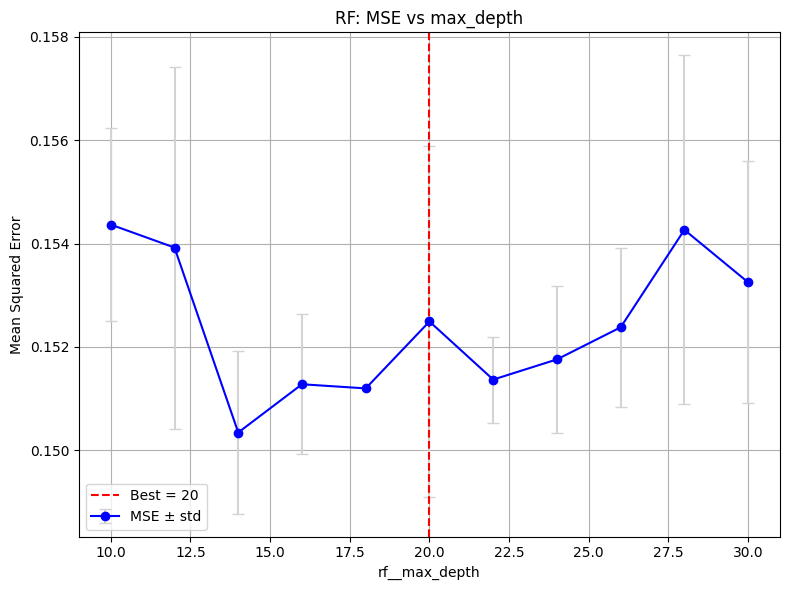

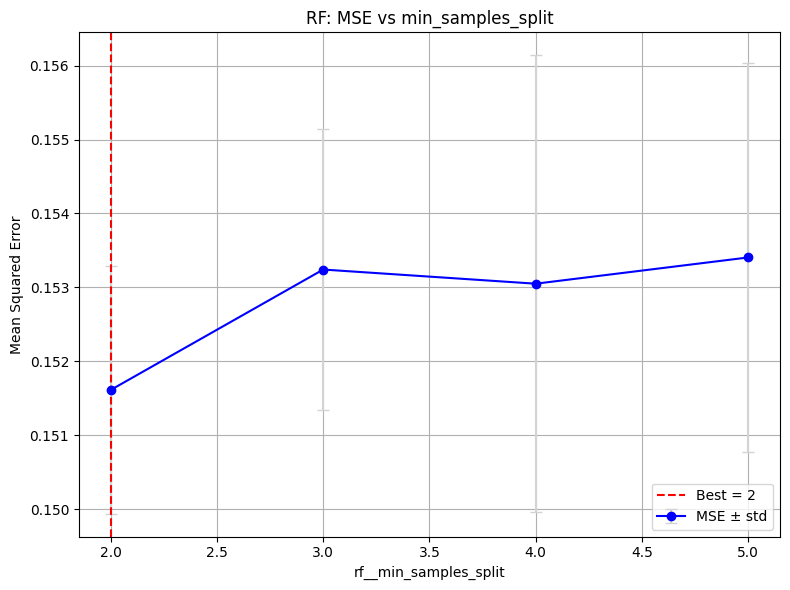

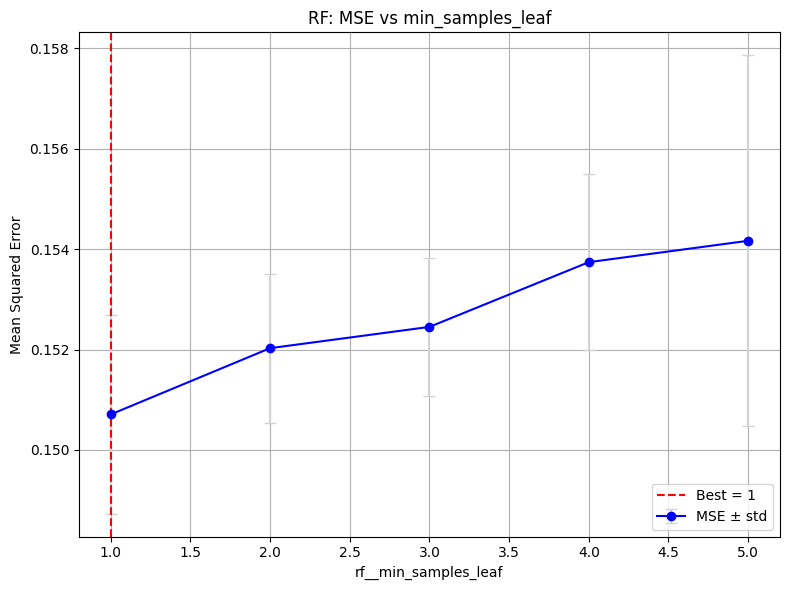

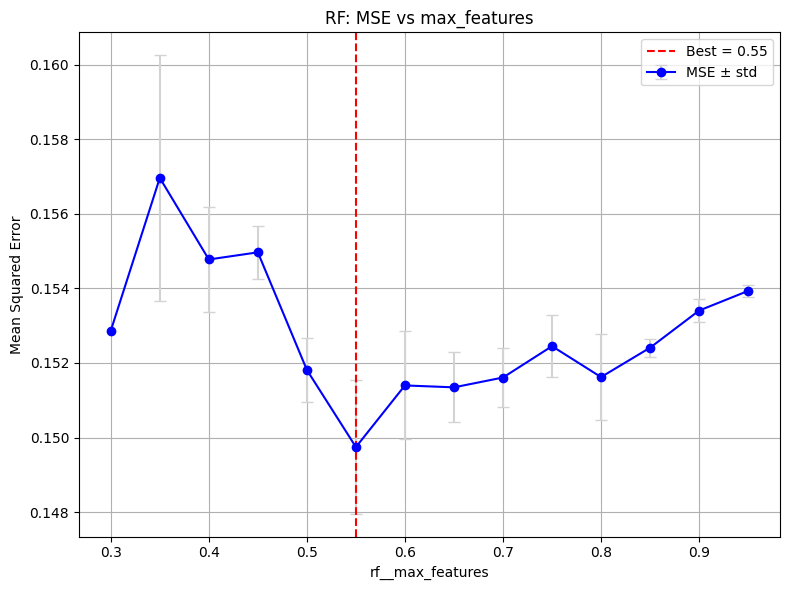

MAE: [0.2701019596919938, 0.2621075420407703, 0.2871732052575067, 0.2702301291701299, 0.2651774677798054, 0.23550962138384163, 0.2957373993654574, 0.2473985173264848, 0.22830318176825976, 0.30892637430585357, 0.3443636599426967, 0.22773600876124145, 0.25791550740138053, 0.26881090897324666, 0.2427993504569481]
MSE: [0.14117868687505195, 0.13392200537899915, 0.1885918736250756, 0.149827512404589, 0.13181800703430205, 0.10091611123820886, 0.17922514369524403, 0.1426211139699404, 0.10639946739793536, 0.20131706541852645, 0.24567512505000788, 0.10287072175195683, 0.14051314010561636, 0.13275618502167683, 0.11763711136505468]
RMSE: [0.3757375239113761, 0.3659535563141847, 0.4342716587863818, 0.38707559003970915, 0.3630674965268883, 0.31767296271198286, 0.4233499069271706, 0.3776521070640814, 0.3261893122067849, 0.44868370308996786, 0.49565625694629123, 0.32073465941796314, 0.3748508238027714, 0.36435722172296353, 0.34298266919052145]
R2: [0.8422356744338038, 0.8385648756479426, 0.7911965401

/tmp/ipykernel_3300194/3994163005.py:256: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


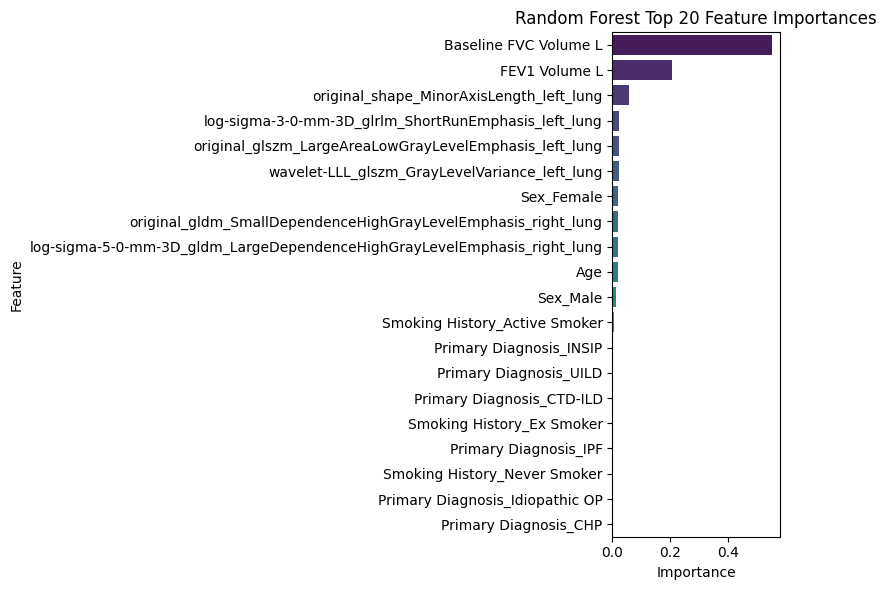

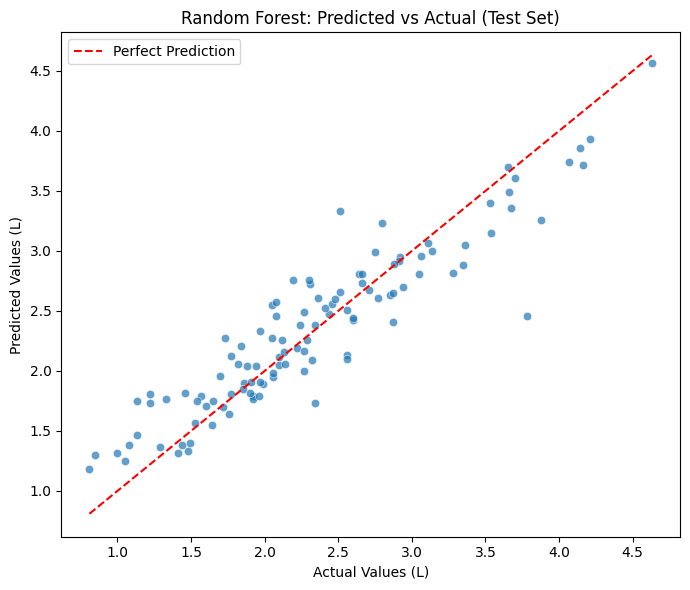

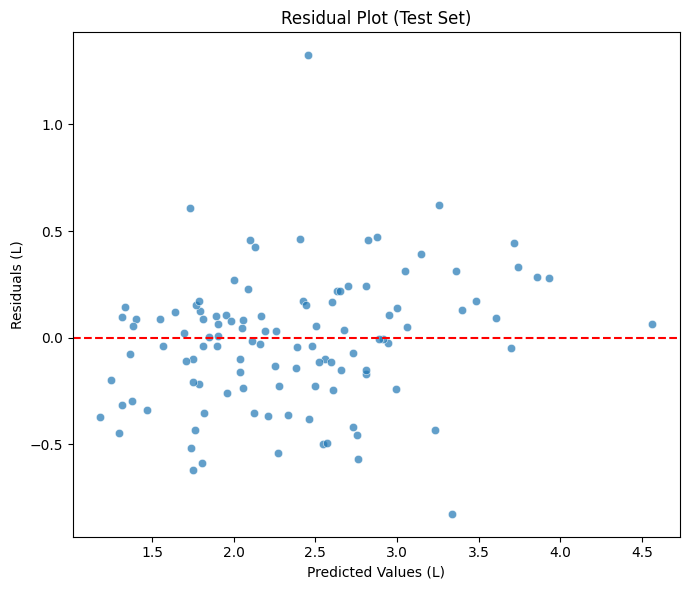


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
123          2.23        3.78       2.455257   1.324743                0.0   
152          3.63        2.51       3.336171   0.826171                0.0   
81           3.59        3.88       3.257029   0.622971                0.0   
368          1.56        1.13       1.751200   0.621200                0.0   
28           1.89        2.34       1.731029   0.608971                0.0   

     Followup_FVC_Week  
123               51.0  
152               53.0  
81                52.0  
368               49.0  
28                48.0  


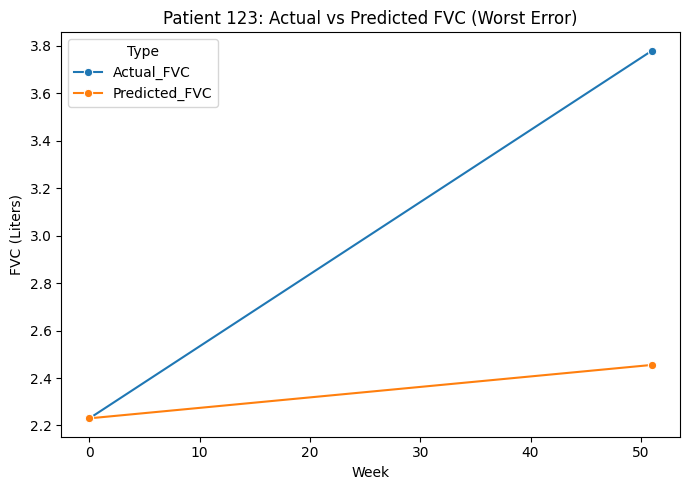

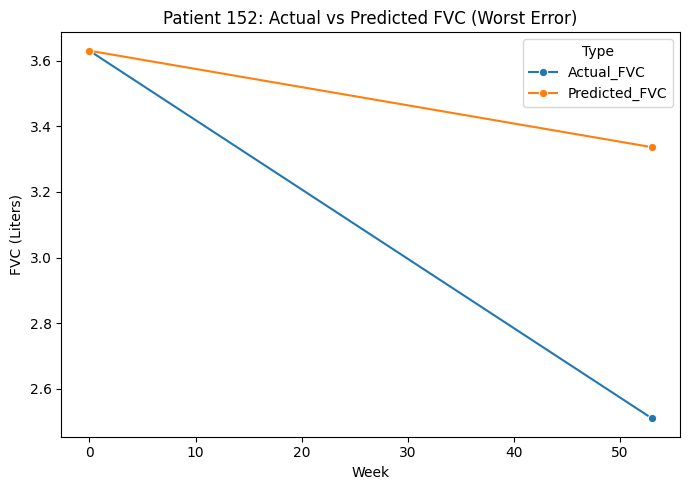

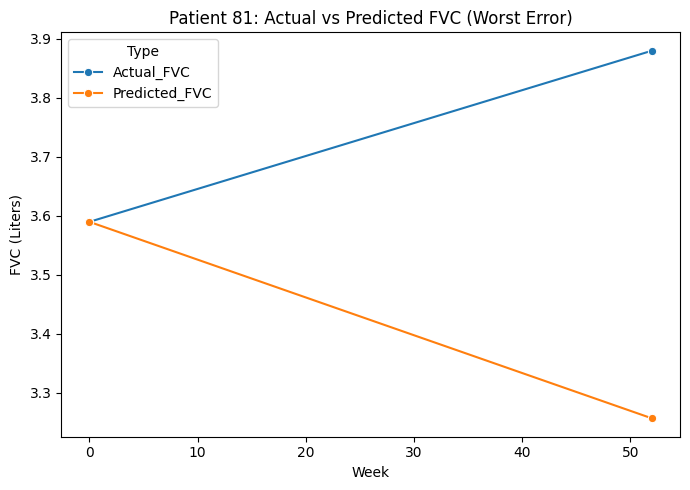

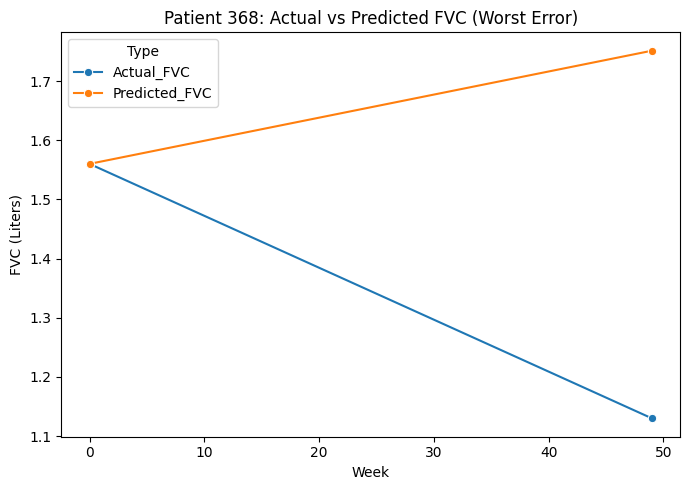

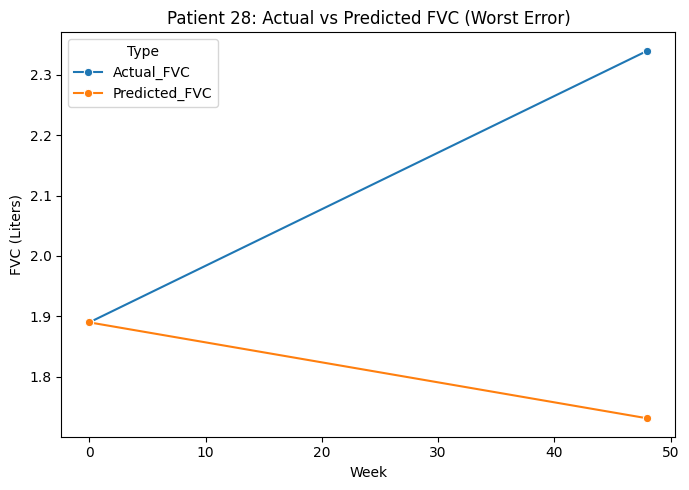


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
337          2.50        2.91       2.915714   0.005714                0.0   
107          2.81        2.88       2.888171   0.008171                0.0   
426          1.66        1.72       1.696514   0.023486                0.0   
506          2.65        2.71       2.674777   0.035223                0.0   
4            2.35        2.44       2.478000   0.038000                0.0   

     Followup_FVC_Week  
337               48.0  
107               54.0  
426               52.0  
506               52.0  
4                 51.0  


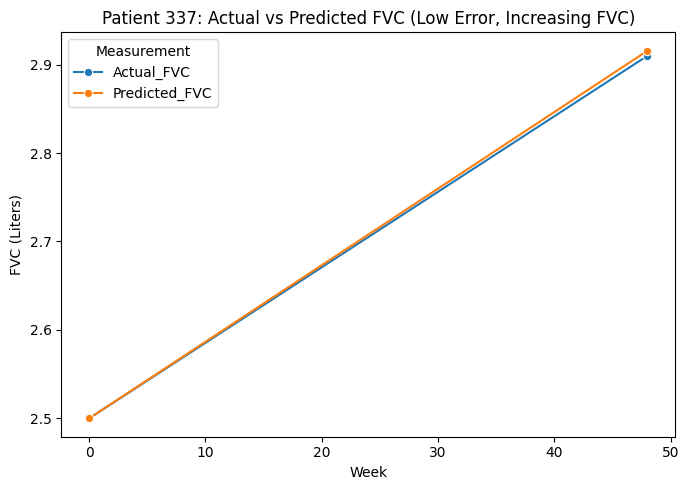

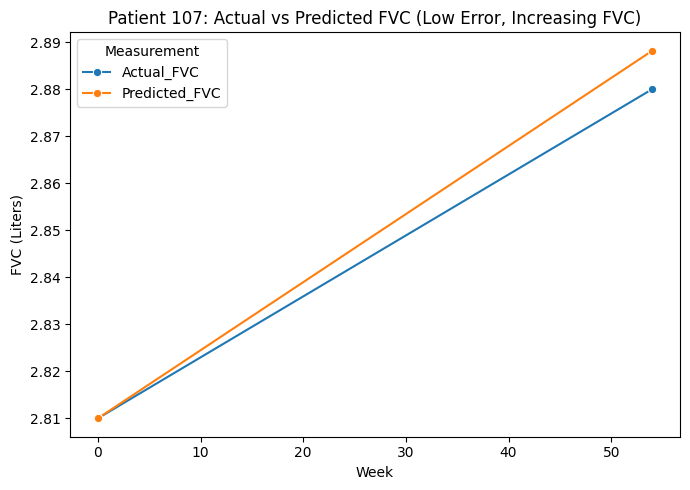

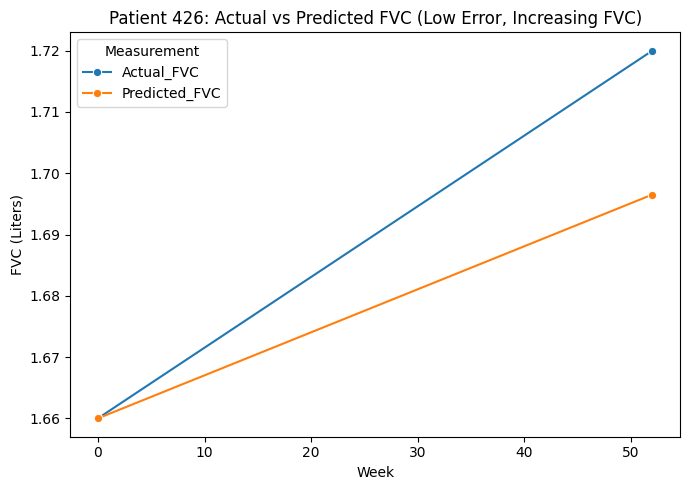

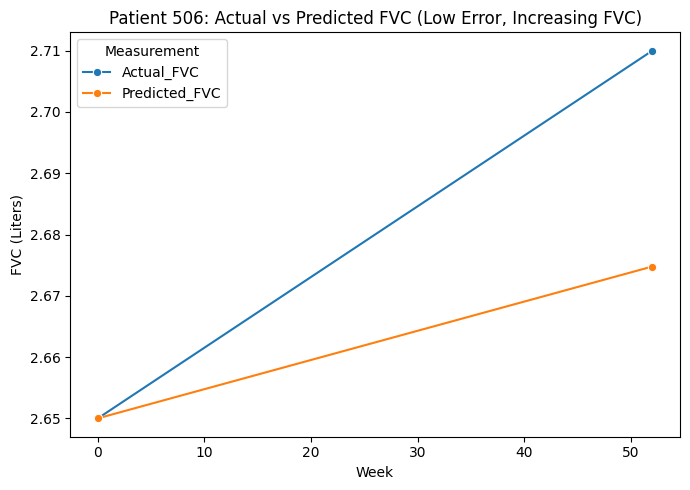

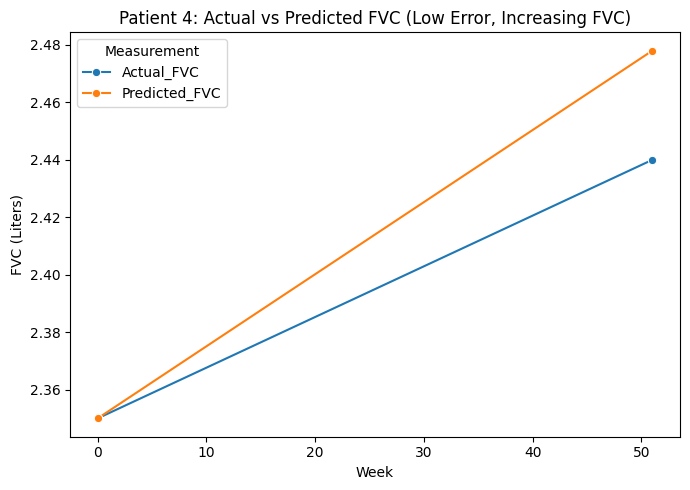

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


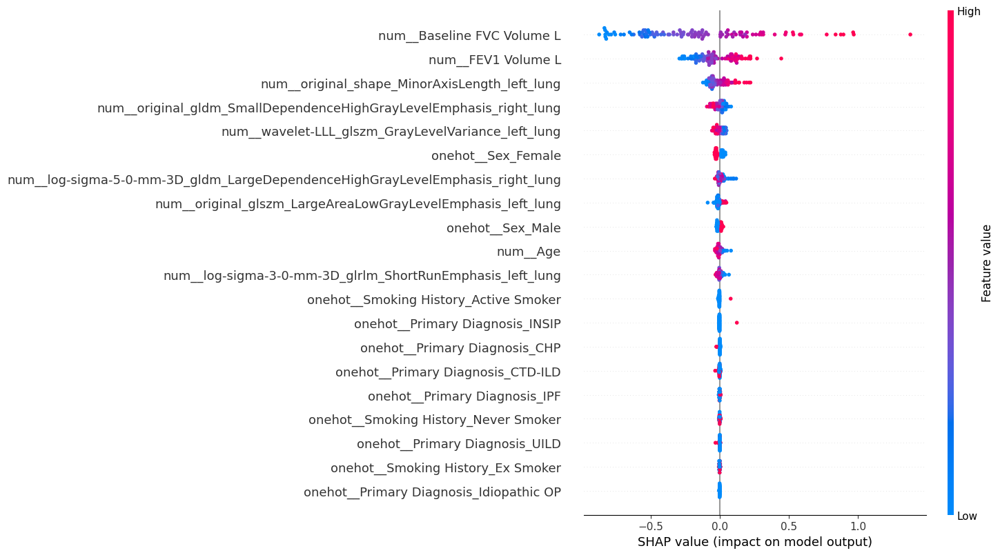

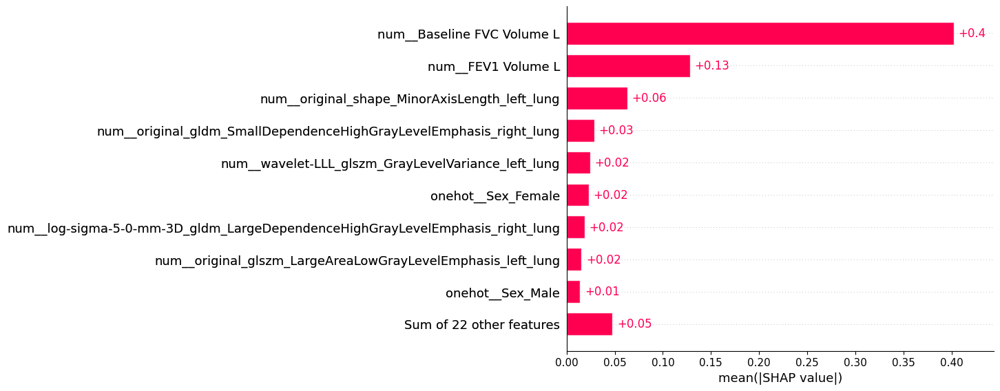

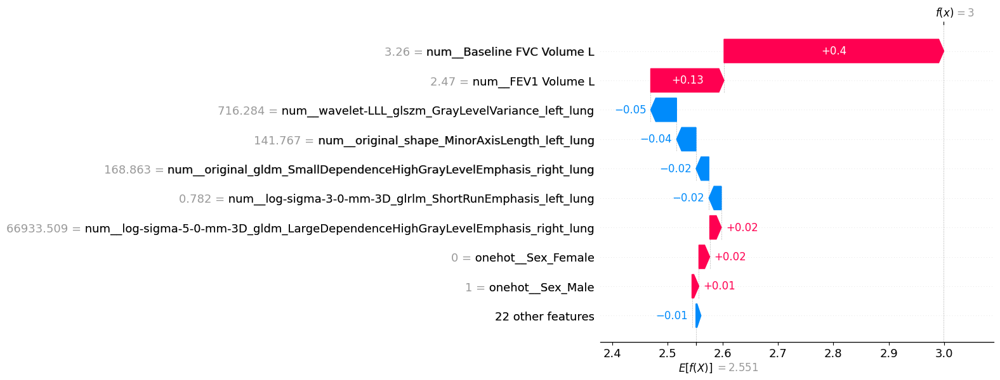

In [44]:
#Pipeline P1: PAM → Correlation with Target → mRMR → VIF
selected_features = ['wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_left_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)


# Run experiments
results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, 
                                 model_name="/home/pansurya/OSIC_thesis/RF_model/RF_PAM_mrmr_VIF_without_harmonization.pkl")

['original_firstorder_Kurtosis_right_lung', 'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LLL_glrlm_RunLengthNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_glrlm_GrayLevelNonUniformity_left_lung', 'original_firstorder_MeanAbsoluteDeviation_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung', 'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'original_glrlm_GrayLevelNonUniformity_right_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-5-0-mm-3D_firstorder_Energy_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung

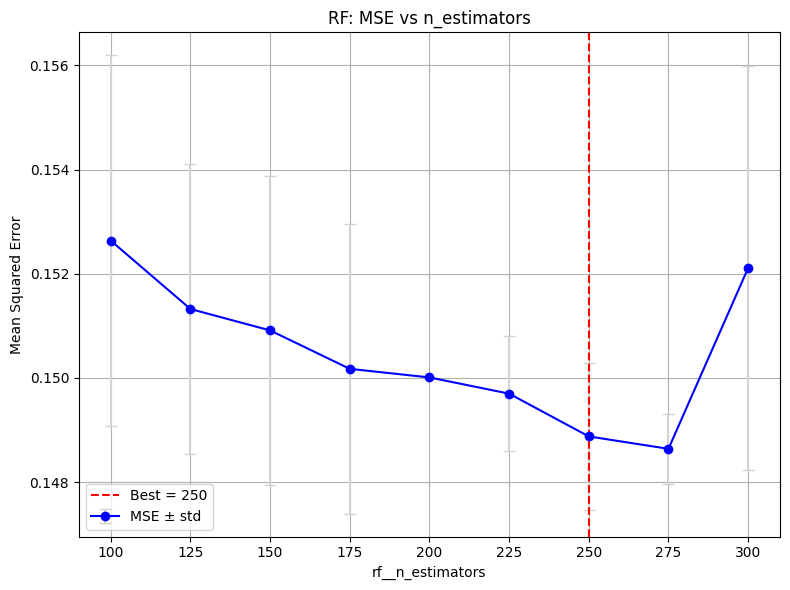

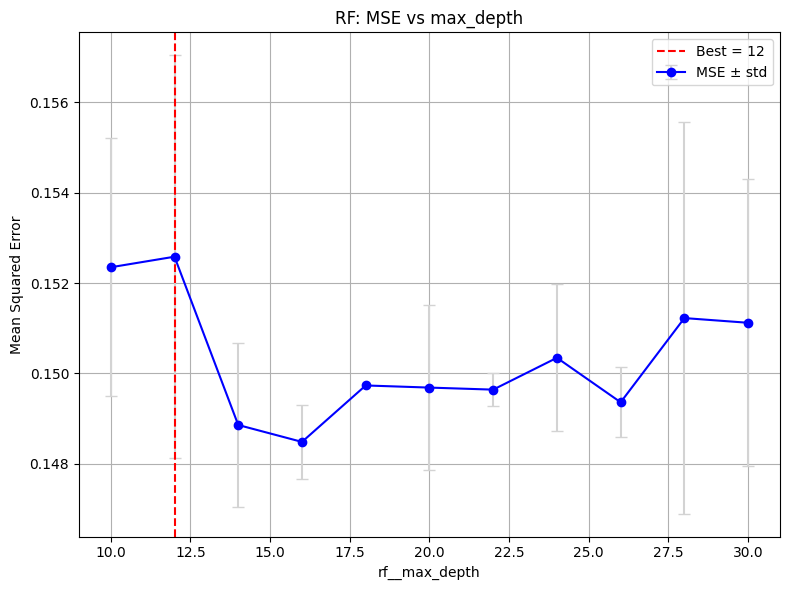

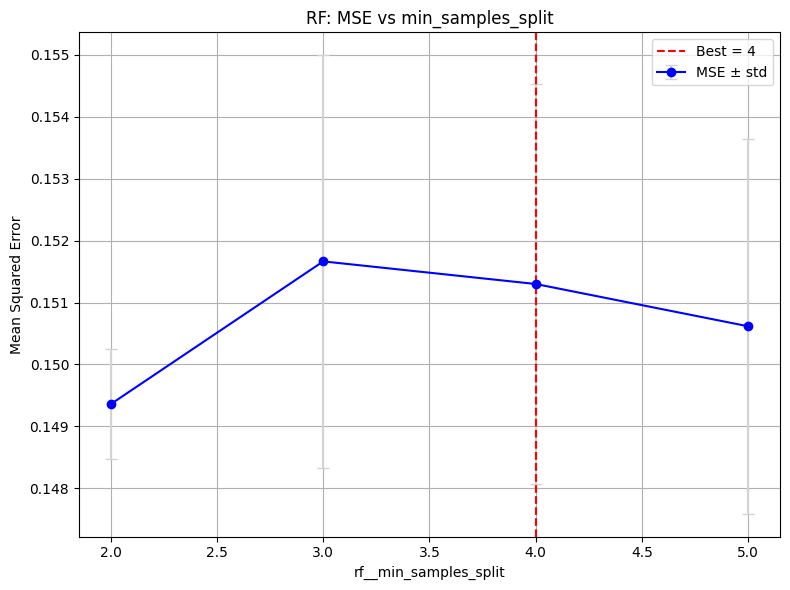

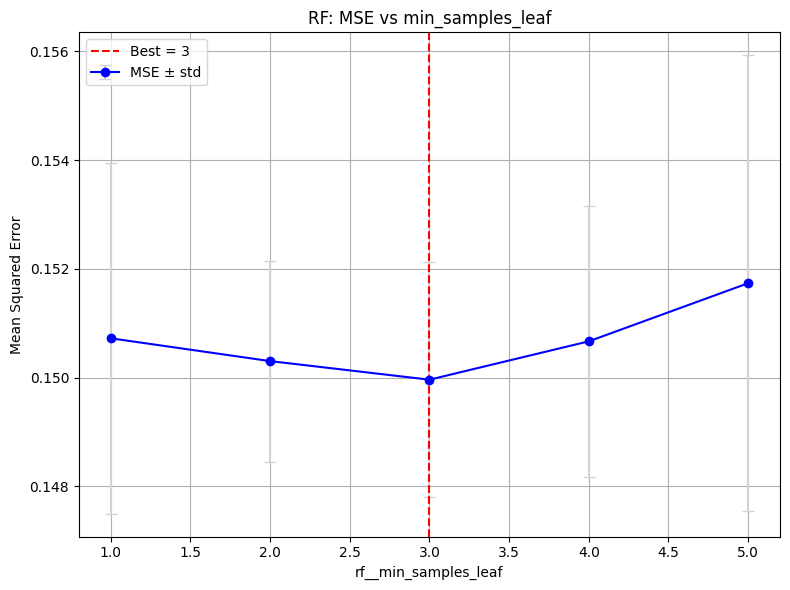

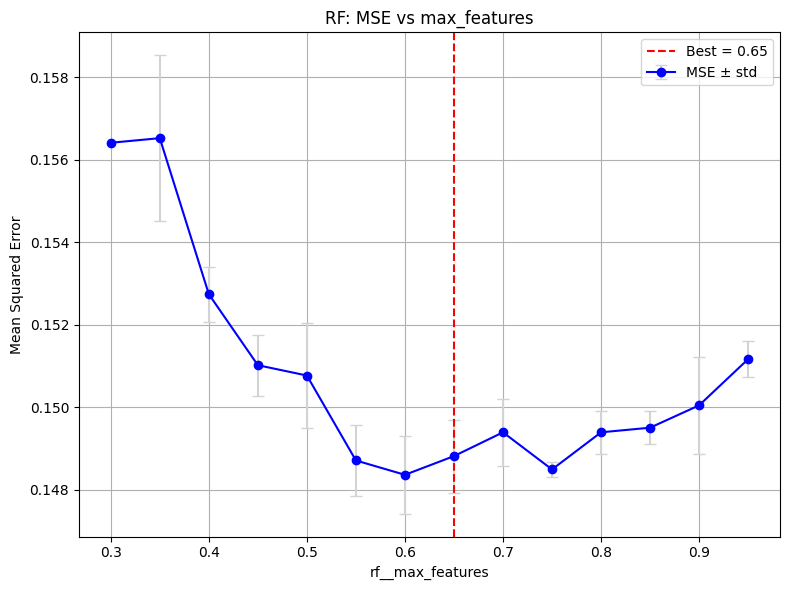

MAE: [0.2619681797625386, 0.25647238296987673, 0.30061191293685635, 0.25074868027036606, 0.279793070132683, 0.22073998590313756, 0.3127510327823302, 0.26250785446852554, 0.2391911177540261, 0.29728644619815, 0.3420891678610074, 0.2323389674419033, 0.2650669519275609, 0.2771942679847077, 0.24009344775358993]
MSE: [0.13481907195845277, 0.12496523443290933, 0.20550119543078002, 0.1412846704104205, 0.13957077314037844, 0.08720784313708015, 0.18479187568286987, 0.14687578235646676, 0.10859360691343488, 0.195901839568826, 0.23901174987826687, 0.10183672180343865, 0.1438062884421058, 0.13636924866877778, 0.11974909533606136]
RMSE: [0.36717716698952396, 0.3535042212377517, 0.4533223967892829, 0.37587853145719896, 0.3735917198498629, 0.2953097410128561, 0.4298742556642231, 0.3832437636237109, 0.3295354410582189, 0.44260799763314945, 0.48888827954683767, 0.31911866414147366, 0.3792179959365138, 0.36928207195689555, 0.3460478223252696]
R2: [0.8493424154043155, 0.8493617378020217, 0.77247502878694

/tmp/ipykernel_3300194/3994163005.py:256: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


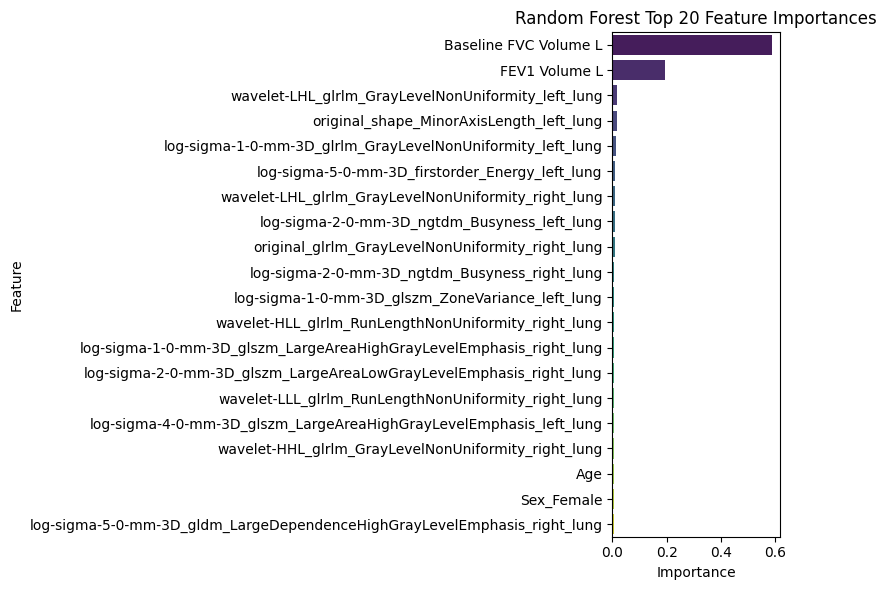

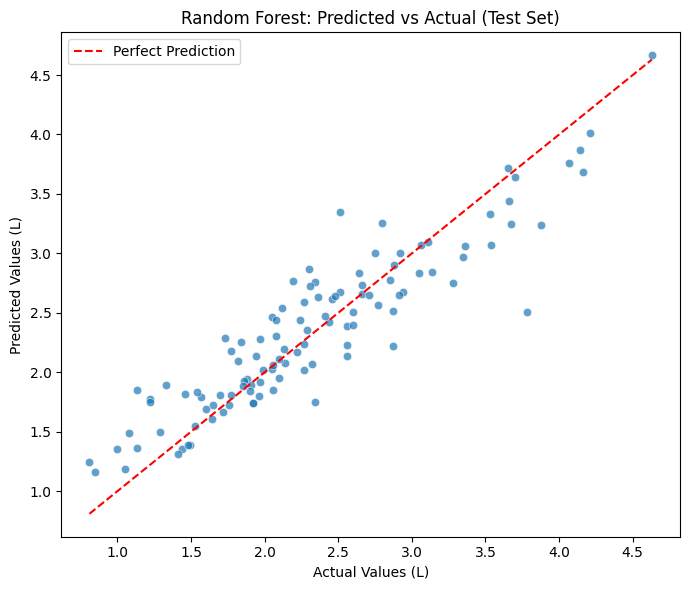

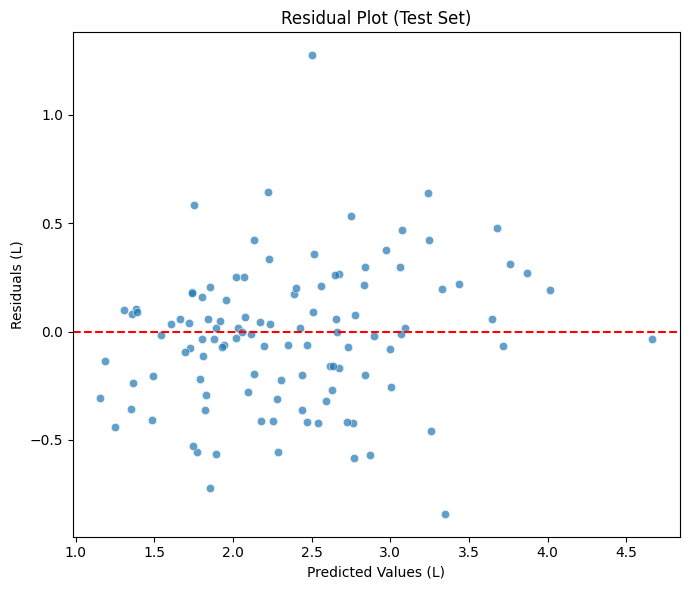


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
123          2.23        3.78       2.505601   1.274399                0.0   
152          3.63        2.51       3.350430   0.840430                0.0   
368          1.56        1.13       1.853116   0.723116                0.0   
91           2.42        2.87       2.224154   0.645846                0.0   
81           3.59        3.88       3.239592   0.640408                0.0   

     Followup_FVC_Week  
123               51.0  
152               53.0  
368               49.0  
91                48.0  
81                52.0  


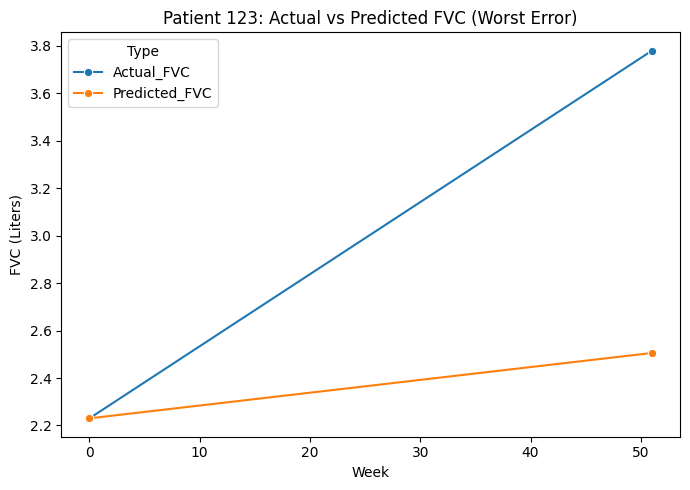

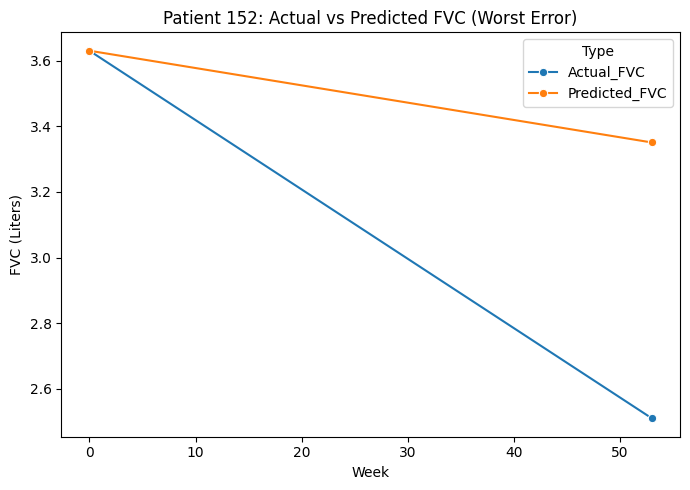

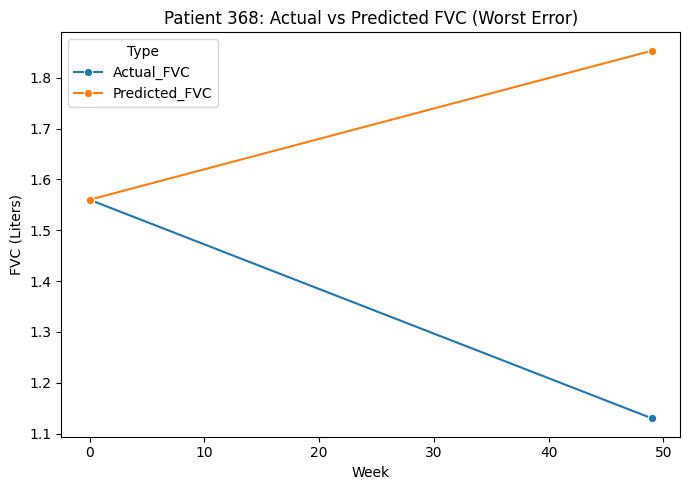

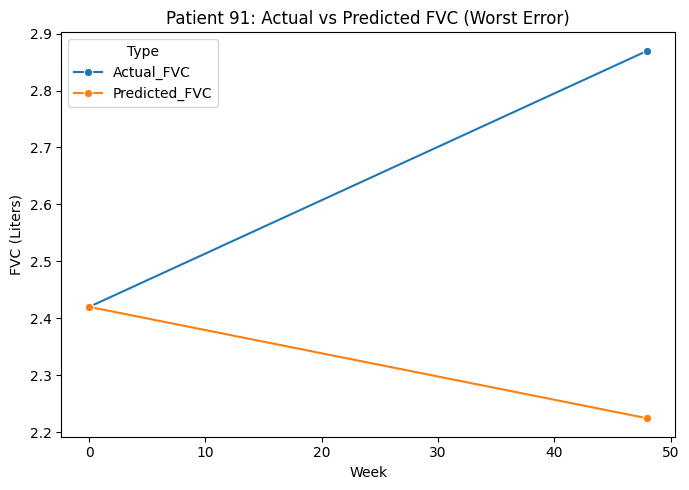

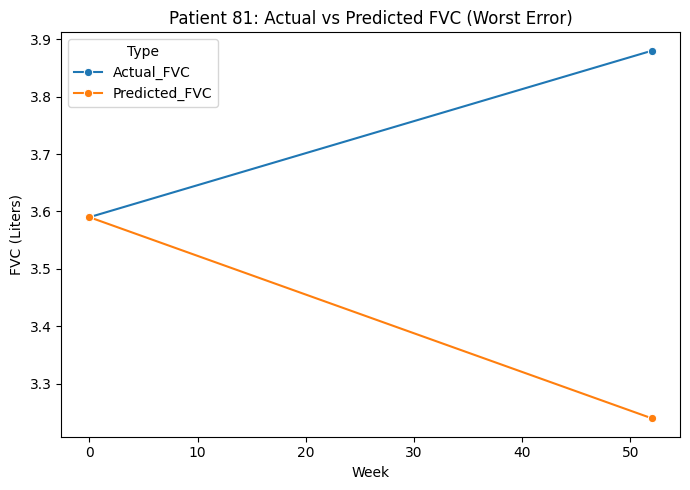


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
4            2.35        2.44       2.424288   0.015712                0.0   
229          3.02        3.11       3.093515   0.016485                0.0   
107          2.81        2.88       2.898449   0.018449                0.0   
271          1.91        1.99       2.019172   0.029172                0.0   
283          1.60        1.64       1.605554   0.034446                0.0   

     Followup_FVC_Week  
4                 51.0  
229               52.0  
107               54.0  
271               54.0  
283               52.0  


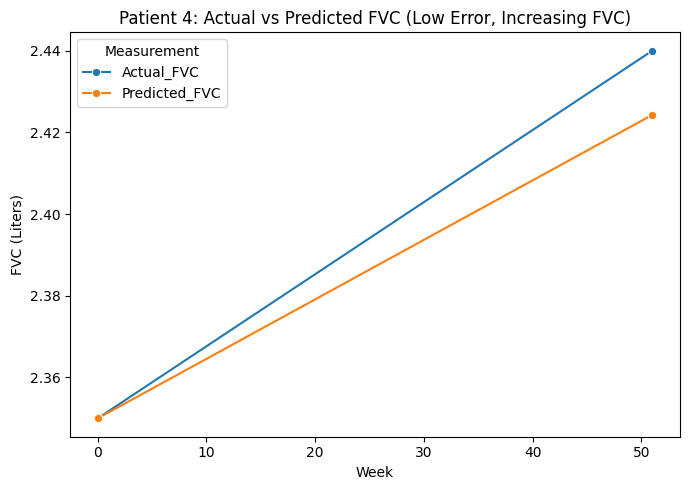

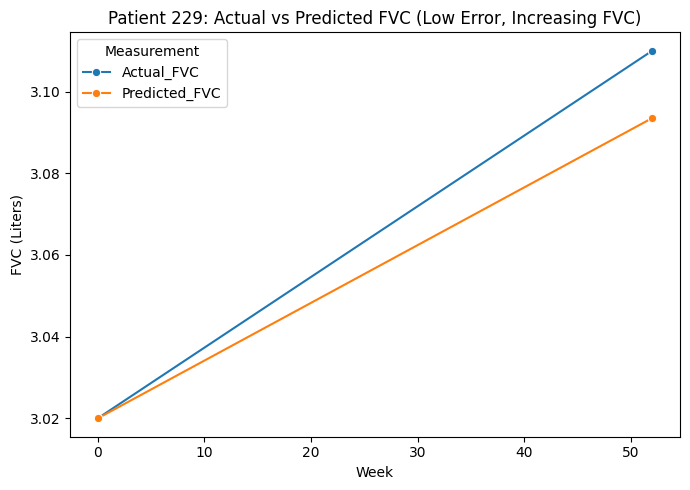

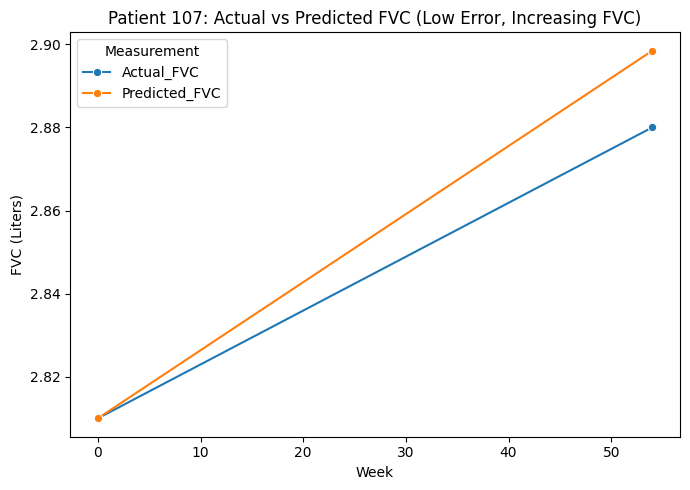

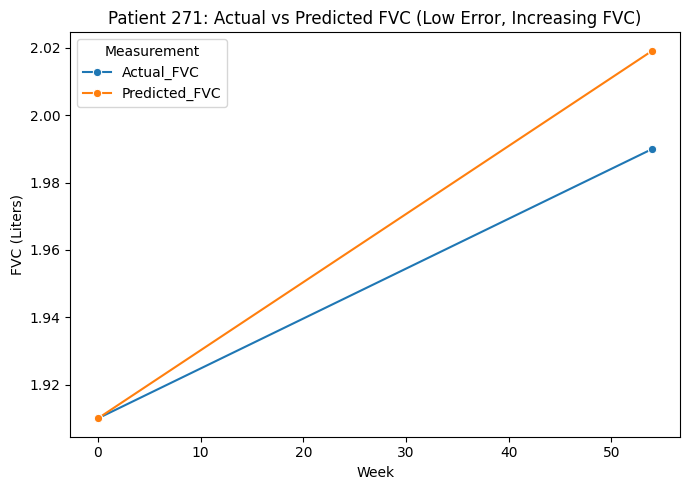

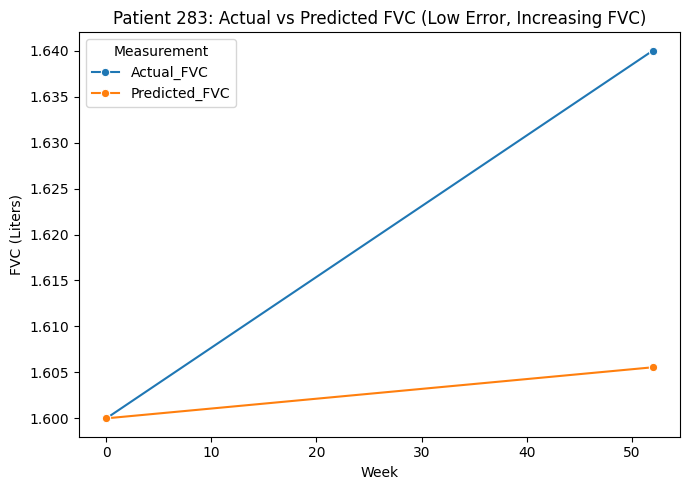

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


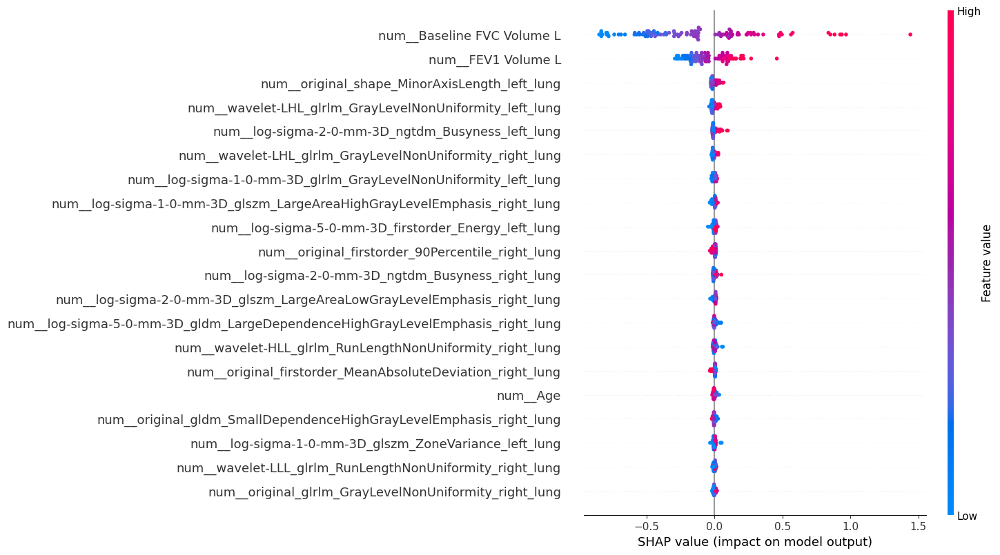

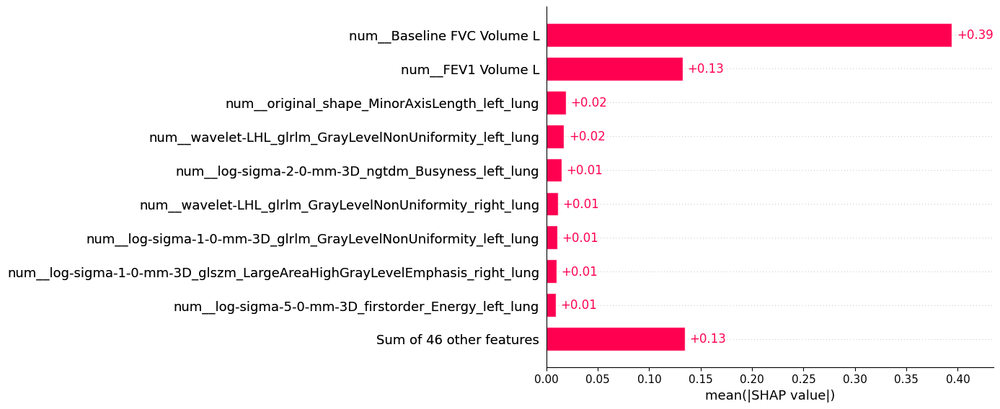

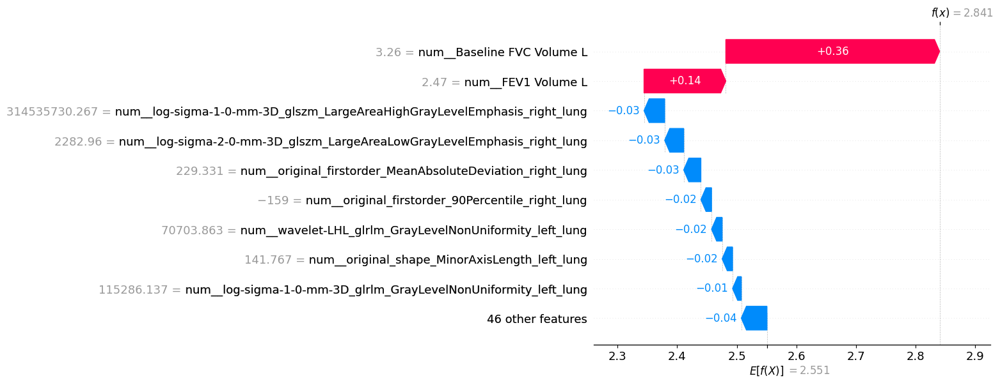

In [45]:
#tested, not good method
selected_features = ['original_firstorder_Kurtosis_right_lung',
       'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung',
       'wavelet-LLL_glrlm_RunLengthNonUniformity_right_lung',
       'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung',
       'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
       'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung',
       'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-1-0-mm-3D_glrlm_GrayLevelNonUniformity_left_lung',
       'original_firstorder_MeanAbsoluteDeviation_right_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung',
       'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung',
       'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',
       'original_glrlm_GrayLevelNonUniformity_right_lung',
       'original_firstorder_90Percentile_right_lung',
       'log-sigma-5-0-mm-3D_firstorder_Energy_left_lung',
       'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-2-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_RunPercentage_left_lung',
       'wavelet-LLL_firstorder_90Percentile_left_lung',
       'wavelet-HLL_glrlm_RunLengthNonUniformity_right_lung',
       'log-sigma-1-0-mm-3D_glszm_ZoneVariance_left_lung',
       'original_shape_MinorAxisLength_left_lung',
       'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung',
       'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung',
       'log-sigma-4-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung',
       'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)


# Run experiments
results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, 
                                  model_name="/home/pansurya/OSIC_thesis/RF_model/PAM_ANOVA_VIF_RF_without_harmonization.pkl")


Hierarchical

['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HLL_firstorder_Skewness_right_lung', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HLL_firstorder_Skewness_right_lung', 'wavelet-HHL_glszm_LargeArea

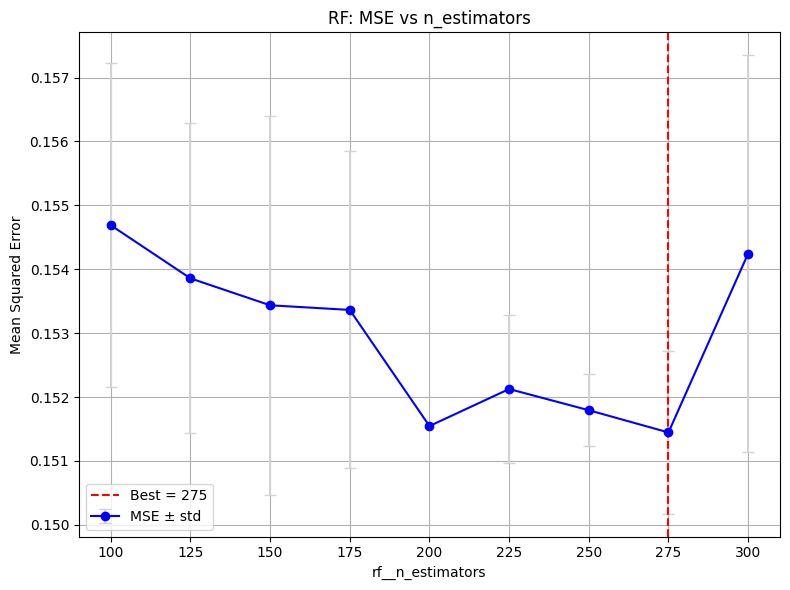

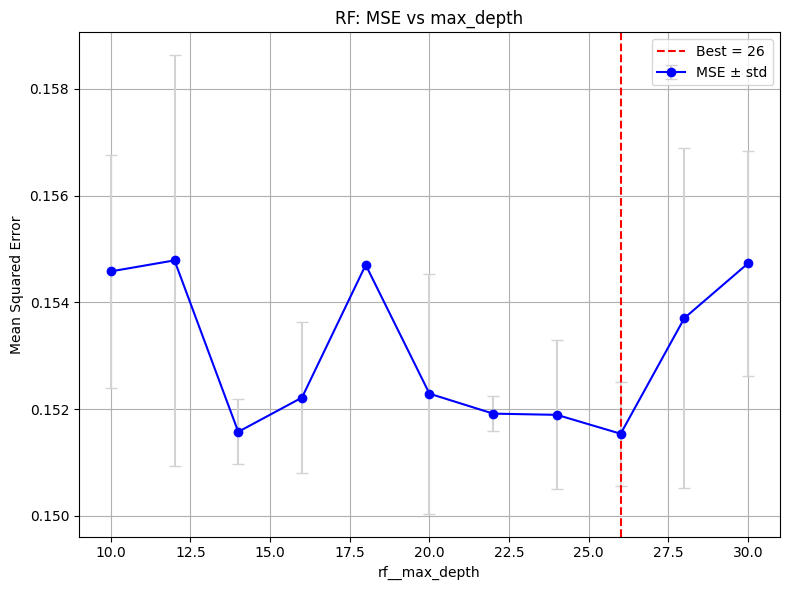

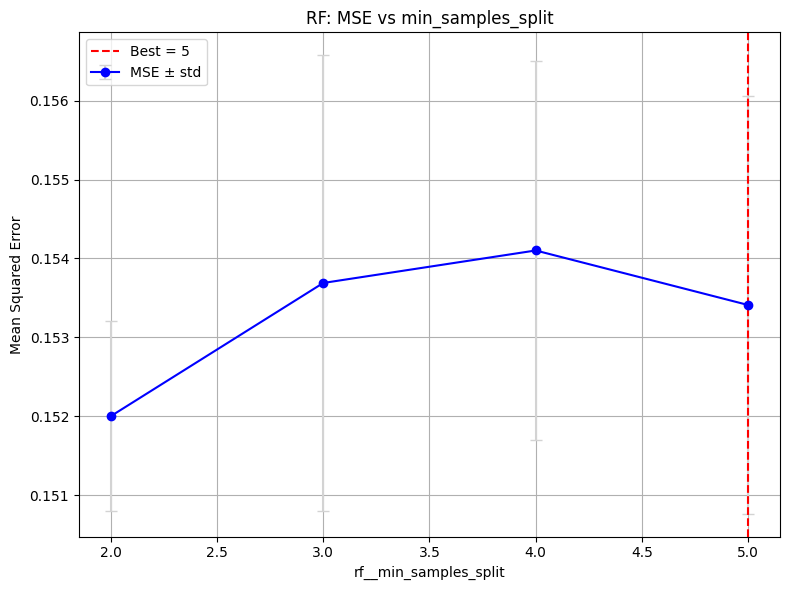

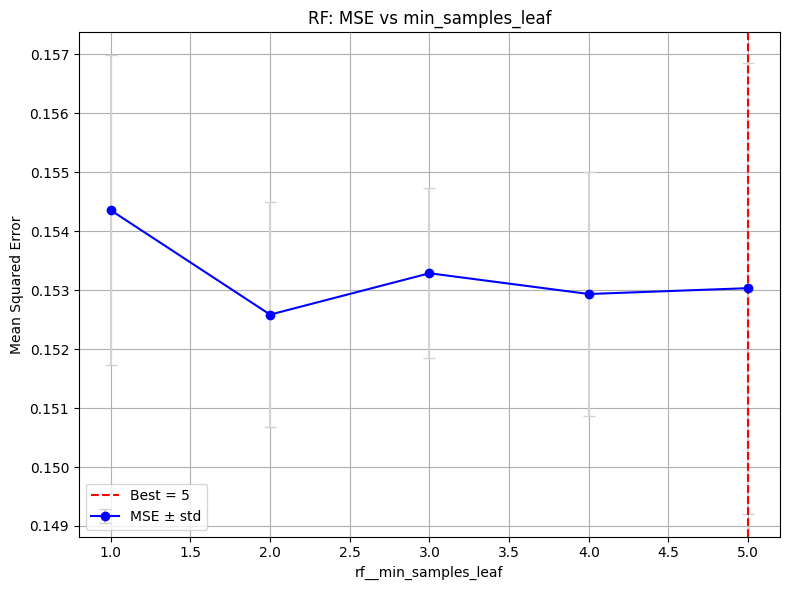

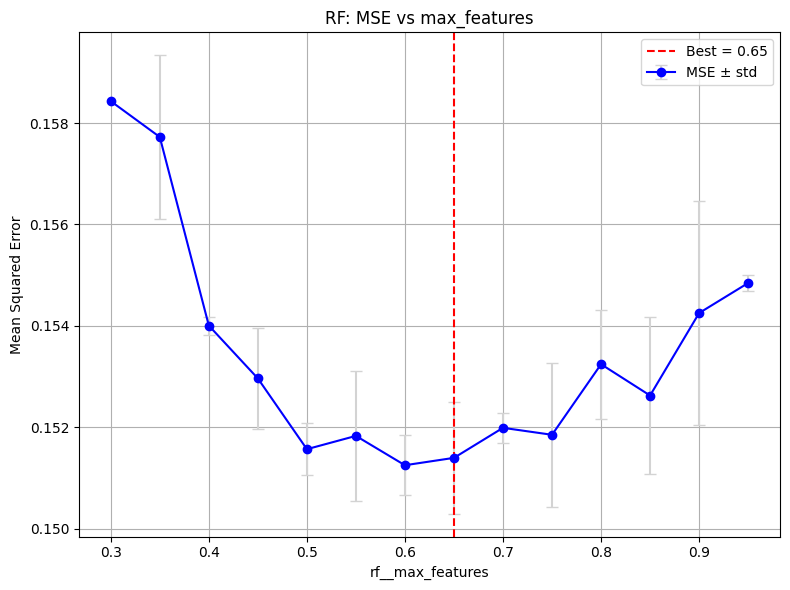

MAE: [0.2629505247275429, 0.24457410068335275, 0.3003168576641677, 0.25561601445234705, 0.2701067545475668, 0.23559092988034774, 0.30503553966526076, 0.24554957347610368, 0.22230549624566392, 0.30168298214330797, 0.33905063243982064, 0.22733310925678643, 0.2616297142363775, 0.2725026311209155, 0.24023215269263706]
MSE: [0.13964885216331116, 0.127006438088188, 0.19903037815009372, 0.14913122250762145, 0.14511196617115055, 0.09977464761969225, 0.1923247434477383, 0.14463417329321268, 0.10167990423437608, 0.1994215557789464, 0.24200967193235776, 0.10011367431830133, 0.1521744911477476, 0.1405421389699465, 0.11901509732516083]
RMSE: [0.3736962030357161, 0.35637962636518383, 0.4461282081981521, 0.38617511896498646, 0.3809356457082358, 0.3158712516511945, 0.43854845051343905, 0.38030799793484843, 0.31887286531527903, 0.4465664069082519, 0.4919447854509261, 0.31640744984639874, 0.3900954897813452, 0.37488950234695356, 0.34498564799881287]
R2: [0.8439452337650869, 0.8469011864909416, 0.7796393

/tmp/ipykernel_3300194/3994163005.py:256: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


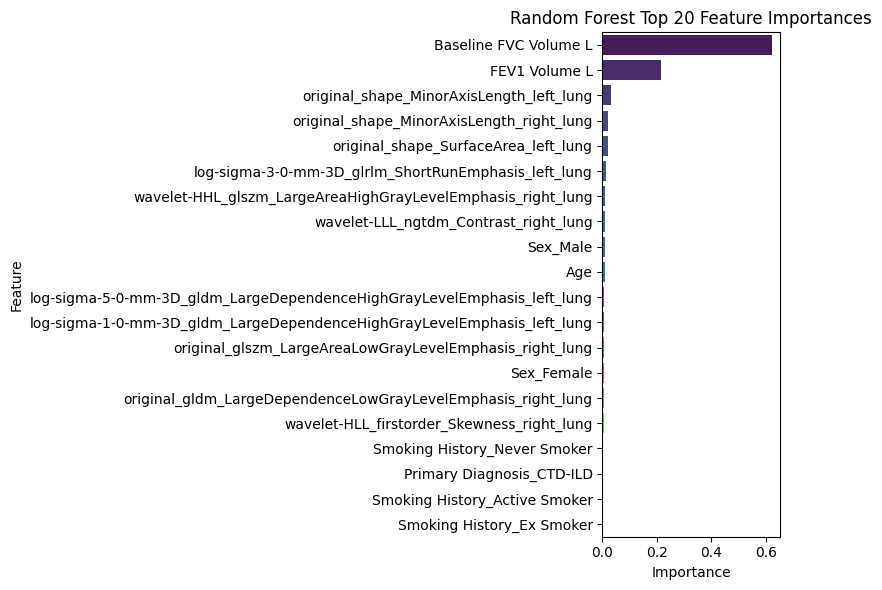

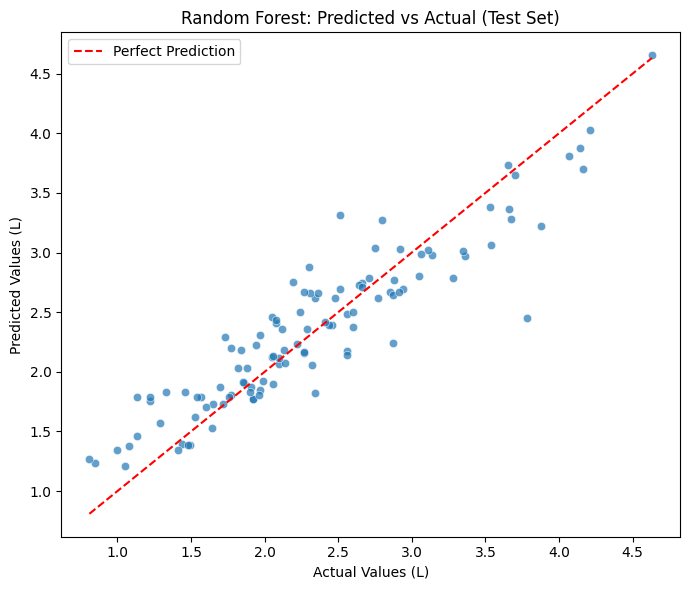

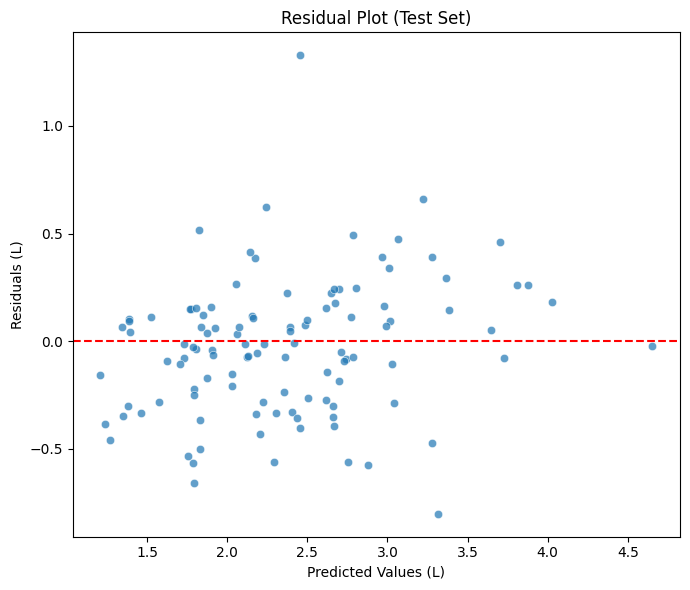


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
123          2.23        3.78       2.451442   1.328558                0.0   
152          3.63        2.51       3.312417   0.802417                0.0   
368          1.56        1.13       1.791445   0.661445                0.0   
81           3.59        3.88       3.221193   0.658807                0.0   
91           2.42        2.87       2.244965   0.625035                0.0   

     Followup_FVC_Week  
123               51.0  
152               53.0  
368               49.0  
81                52.0  
91                48.0  


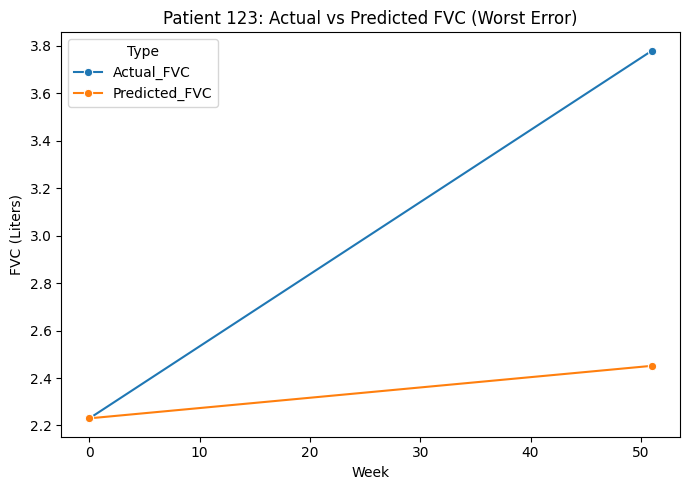

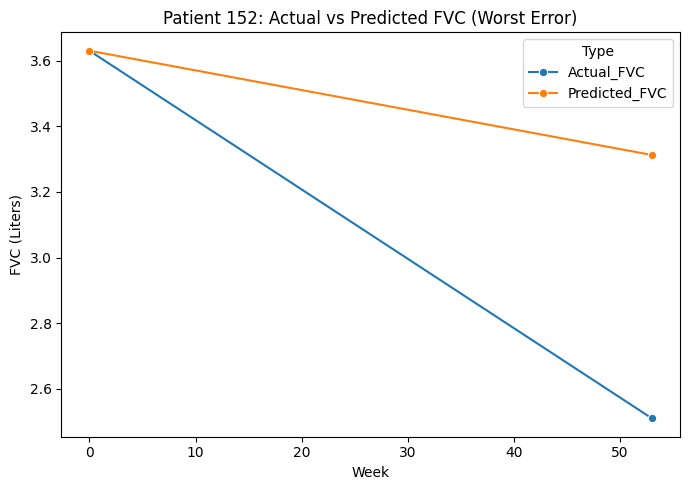

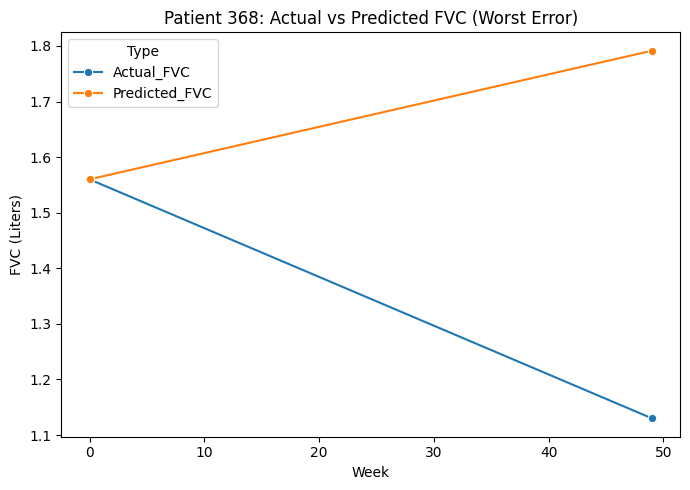

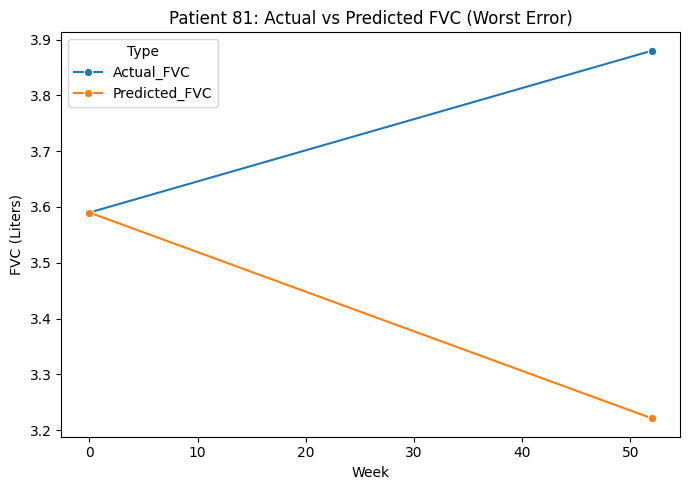

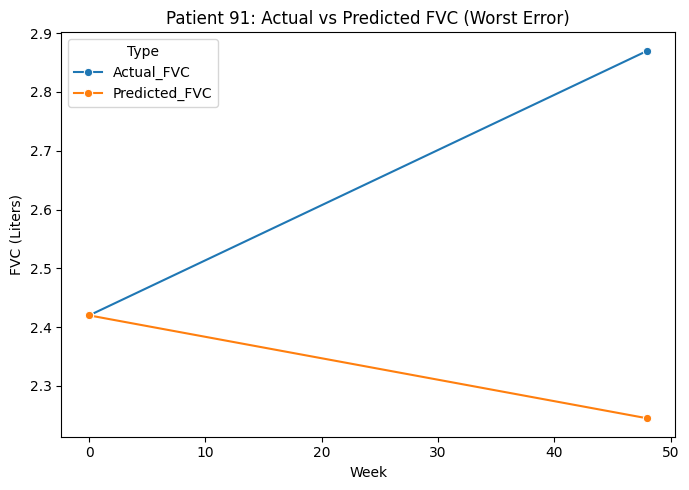


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
426          1.66        1.72       1.731653   0.011653                0.0   
264          1.19        1.44       1.396425   0.043575                0.0   
4            2.35        2.44       2.392287   0.047713                0.0   
514          2.65        2.66       2.710815   0.050815                0.0   
271          1.91        1.99       1.927140   0.062860                0.0   

     Followup_FVC_Week  
426               52.0  
264               52.0  
4                 51.0  
514               52.0  
271               54.0  


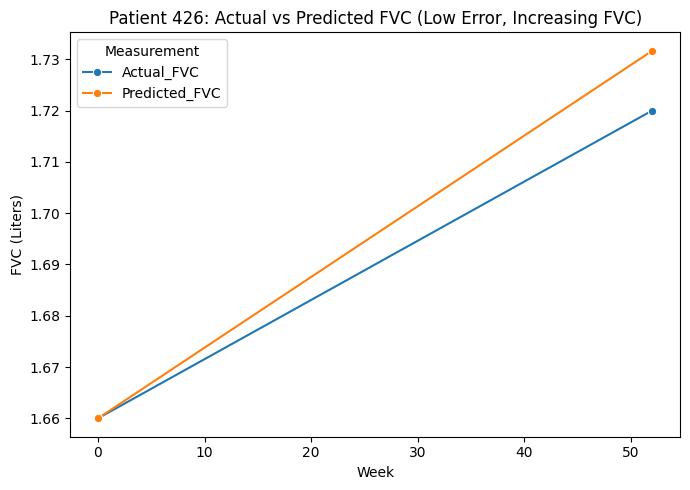

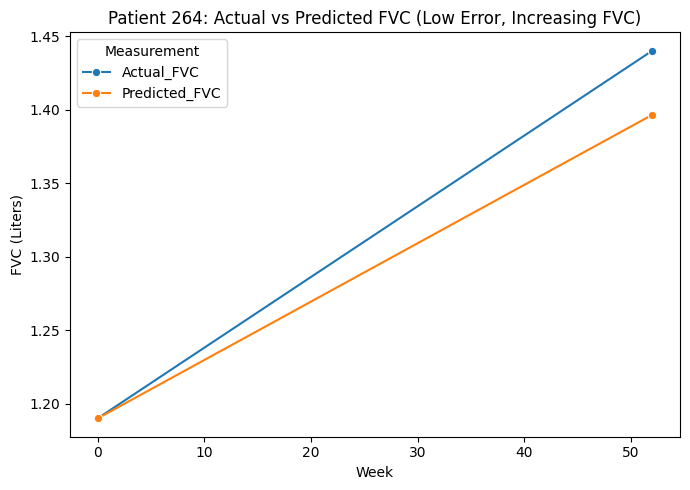

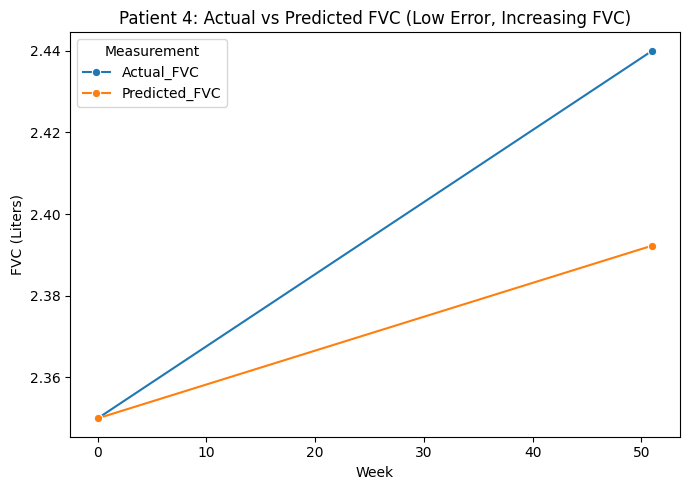

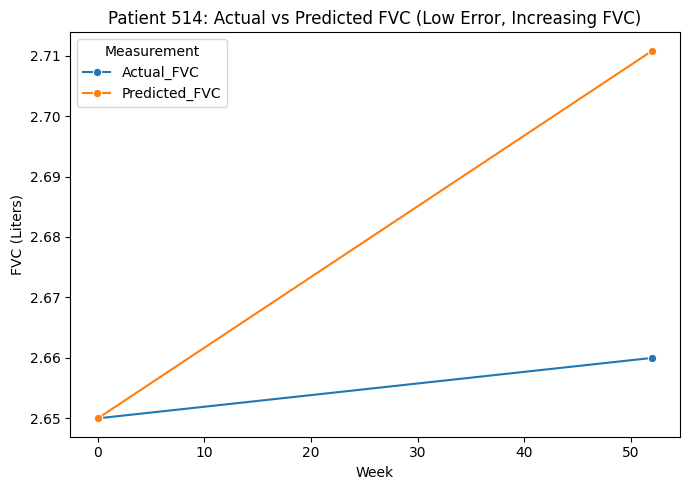

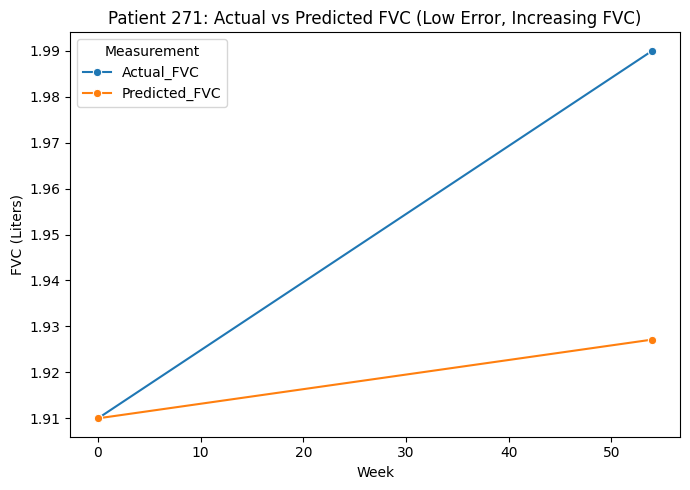

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


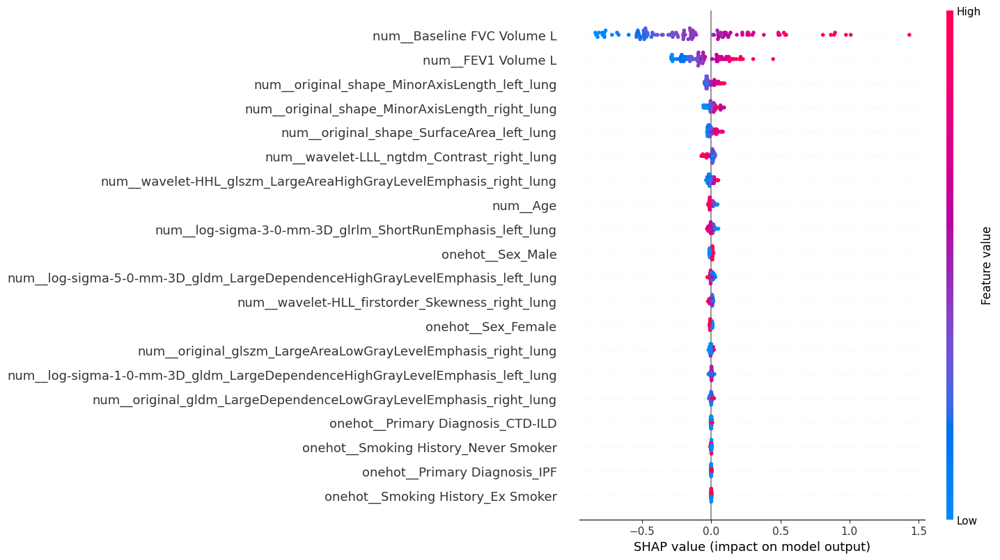

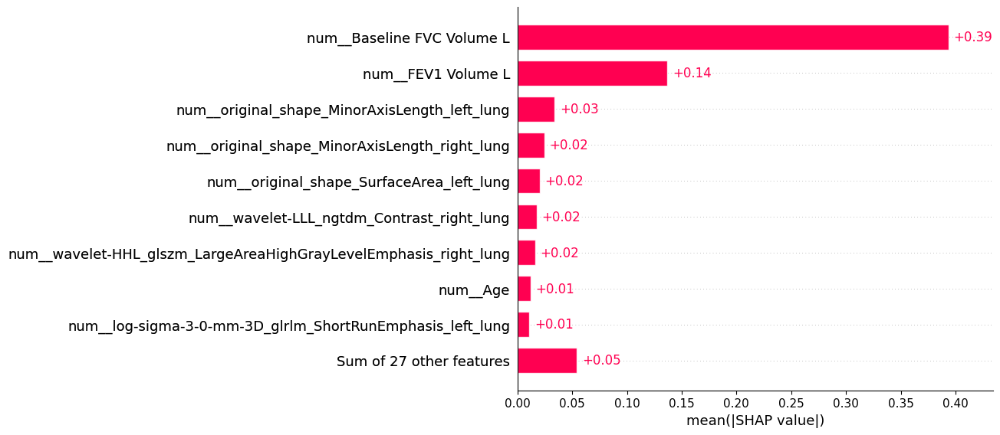

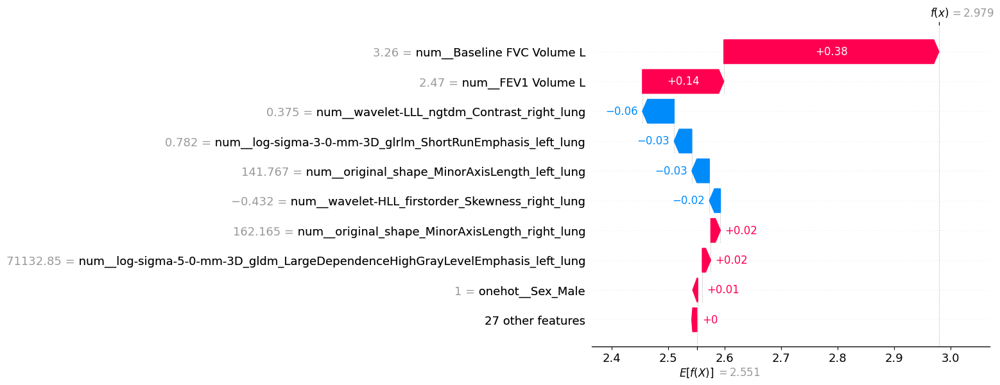

In [46]:
selected_features = ['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HLL_firstorder_Skewness_right_lung', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, 
                                         model_name="/home/pansurya/OSIC_thesis/RF_model/Hierarchical_ANOVA_VIF_RF_without_harmonization.pkl")



['original_shape_MinorAxisLength_left_lung', 'wavelet-HHH_glcm_MCC_right_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-1-0-mm-3D_gldm_GrayLevelNonUniformity_left_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'original_glszm_SmallAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LLH_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LHL_firstorder_Kurtosis_right_lung', 'wavelet-LLL_glszm_GrayLevelNonUniformity_right_lung', 'original

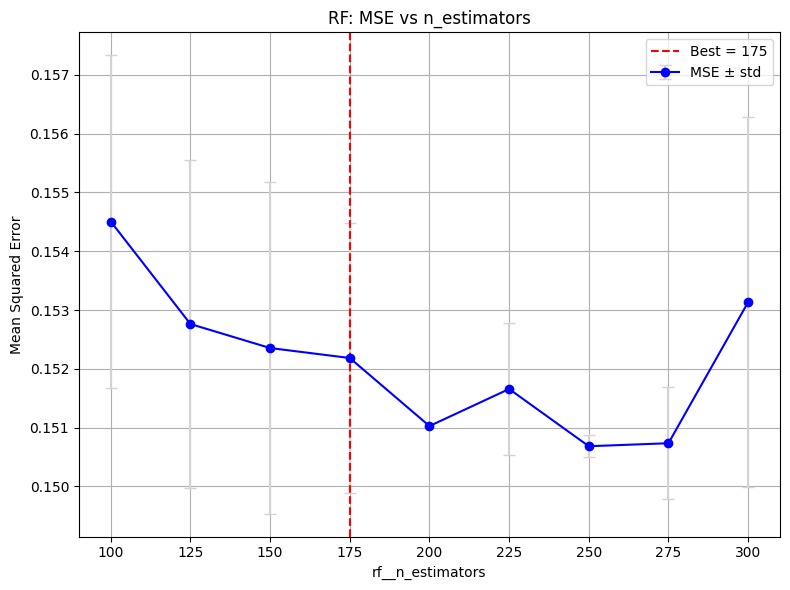

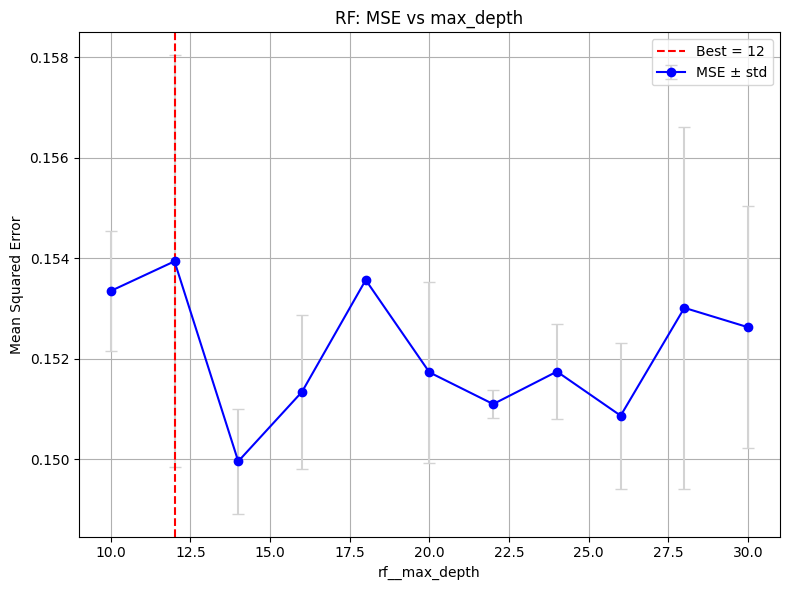

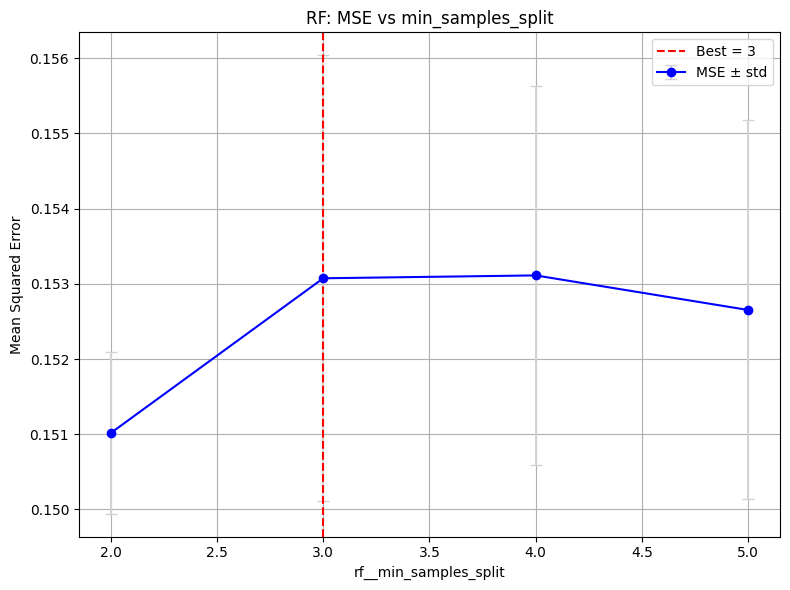

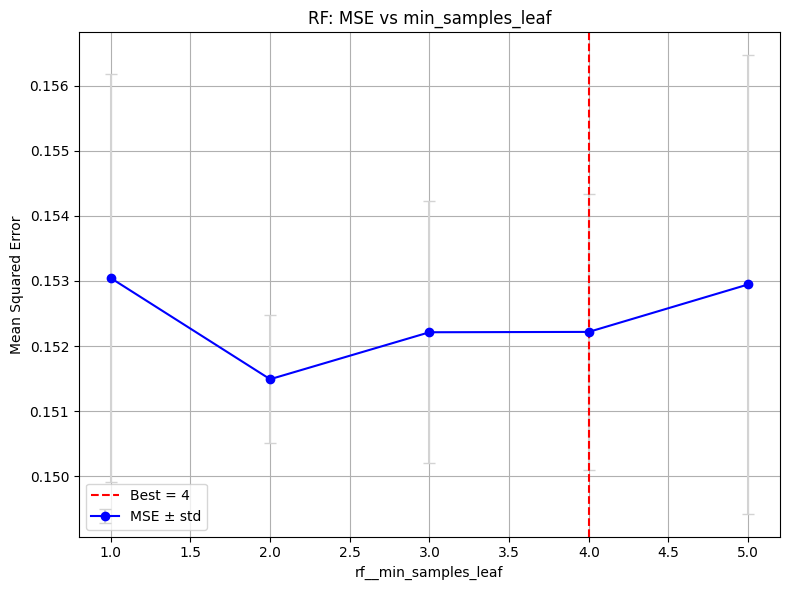

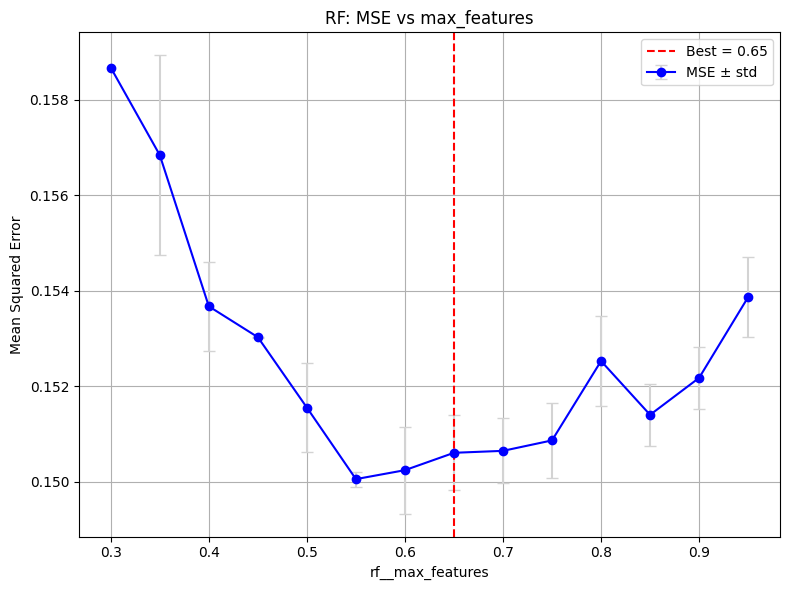

MAE: [0.2691389267169449, 0.25024077832568176, 0.302771155757193, 0.2547725155338838, 0.27162578561242223, 0.23111332280653984, 0.3019918862609151, 0.2685437989720517, 0.22819289996892655, 0.30508040493811267, 0.339145294424885, 0.221226494542184, 0.26451127148085835, 0.27654445636544367, 0.23930063133595295]
MSE: [0.1430887213764929, 0.12328813264281212, 0.20891040935179297, 0.14536286799269352, 0.13767907977647617, 0.09507367784714223, 0.1858102899669257, 0.14928480530959432, 0.10484202200480636, 0.2062098432093341, 0.24048092973418853, 0.09249525599003343, 0.14489251726017016, 0.14244959936807683, 0.11844215552296875]
RMSE: [0.37827069854337503, 0.35112409863581295, 0.457067182536433, 0.381264826587365, 0.3710513169043821, 0.3083401982342591, 0.43105717714350344, 0.3863739190338736, 0.32379317782313816, 0.45410333979099304, 0.4903885497584426, 0.3041303273105683, 0.3806474973780468, 0.3774249585918727, 0.34415426123029297]
R2: [0.8401012495315896, 0.851383385665412, 0.76870044588191

/tmp/ipykernel_3300194/3994163005.py:256: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


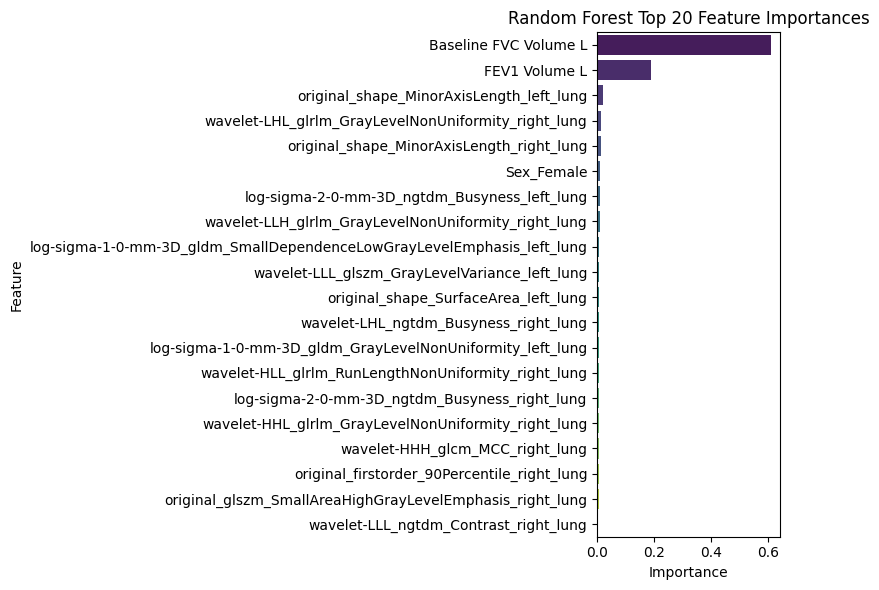

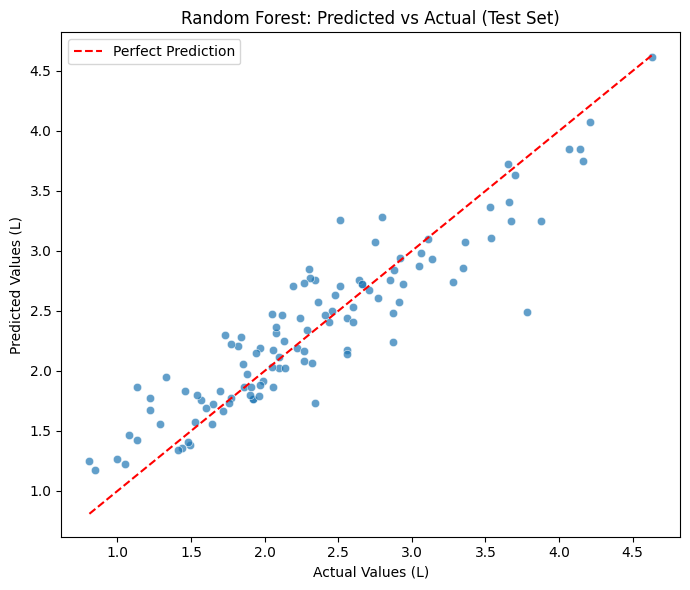

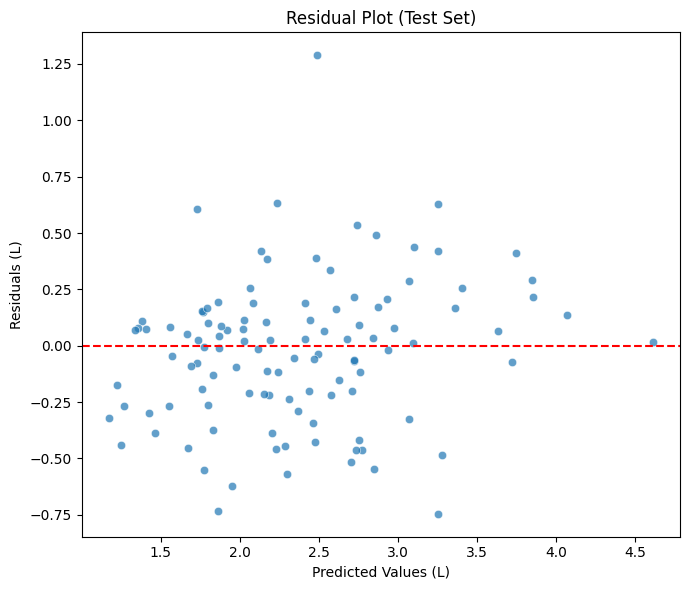


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
123          2.23        3.78       2.491335   1.288665                0.0   
152          3.63        2.51       3.255693   0.745693                0.0   
368          1.56        1.13       1.863048   0.733048                0.0   
91           2.42        2.87       2.237119   0.632881                0.0   
81           3.59        3.88       3.252393   0.627607                0.0   

     Followup_FVC_Week  
123               51.0  
152               53.0  
368               49.0  
91                48.0  
81                52.0  


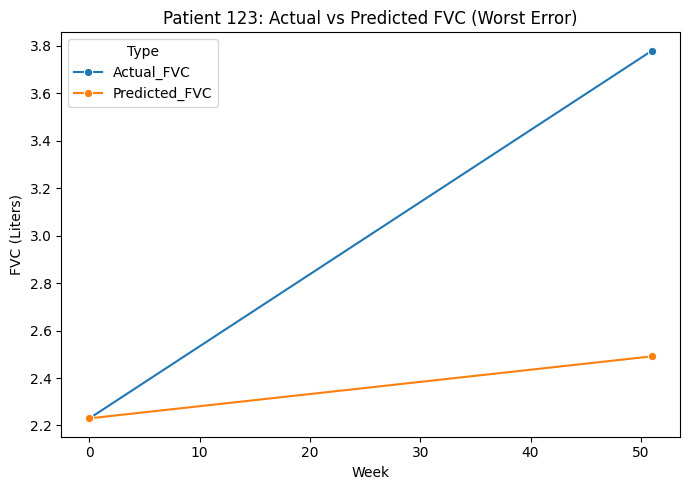

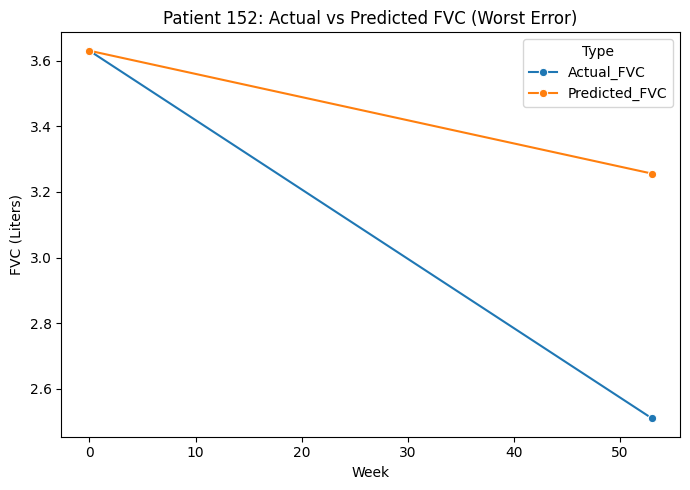

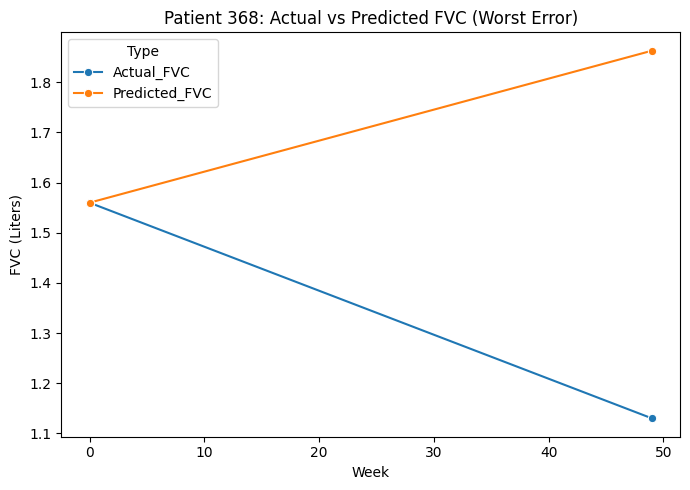

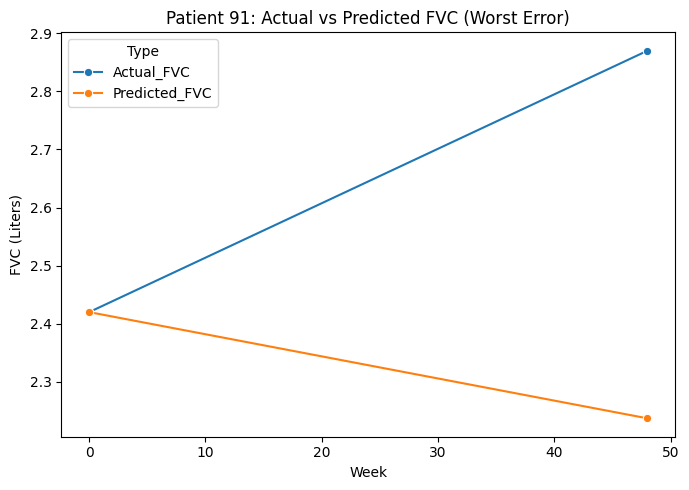

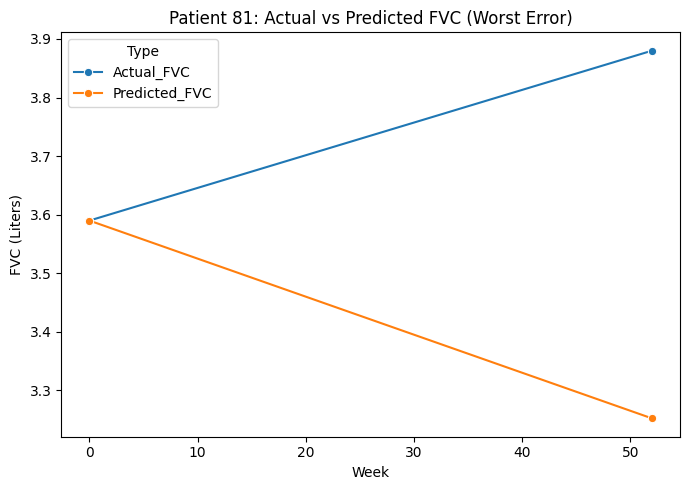


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
229          3.02        3.11       3.099049   0.010951                0.0   
4            2.35        2.44       2.411473   0.028527                0.0   
506          2.65        2.71       2.678000   0.032000                0.0   
107          2.81        2.88       2.845085   0.034915                0.0   
100          2.35        2.46       2.498153   0.038153                0.0   

     Followup_FVC_Week  
229               52.0  
4                 51.0  
506               52.0  
107               54.0  
100               53.0  


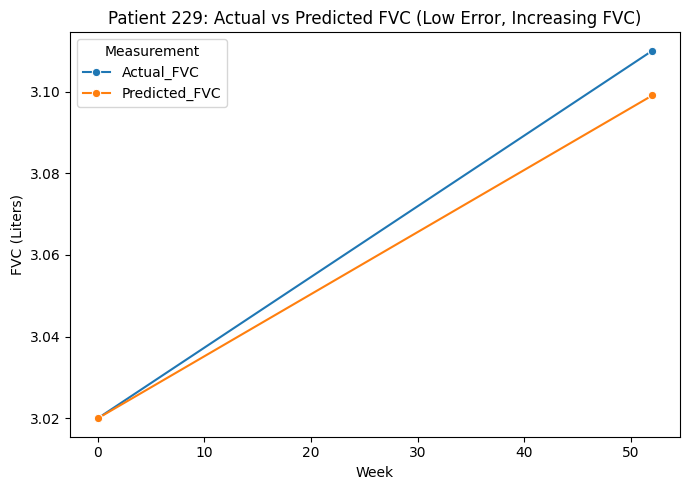

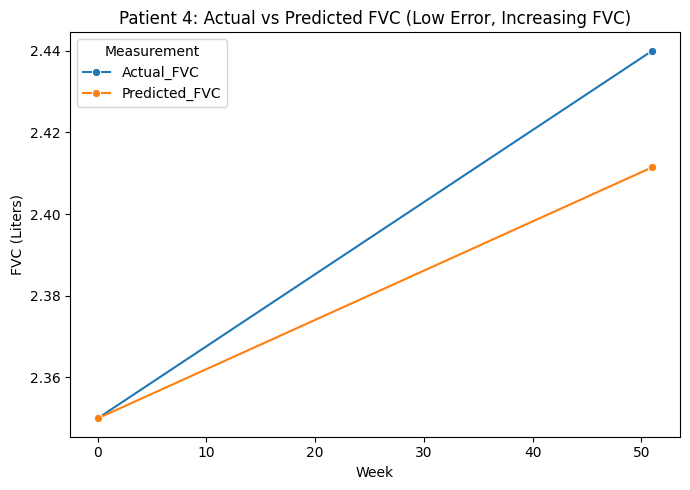

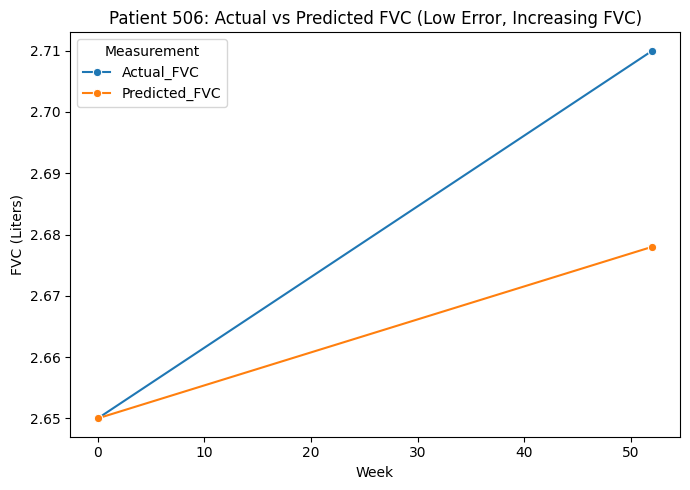

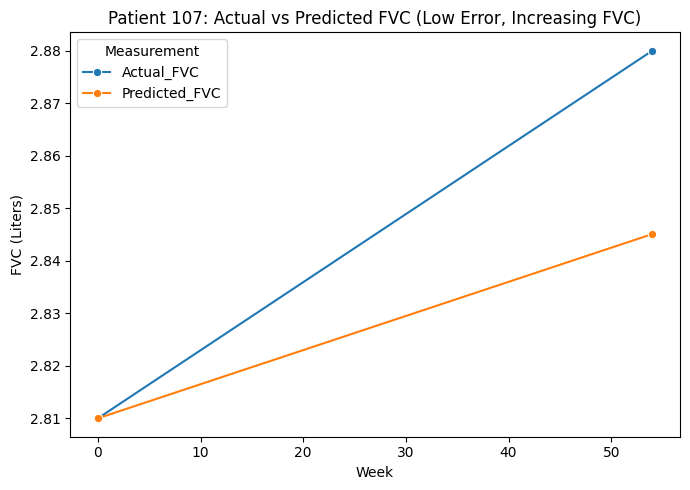

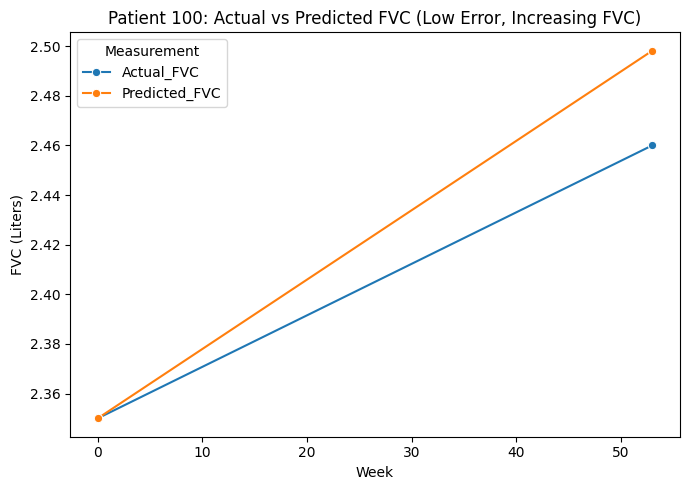

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


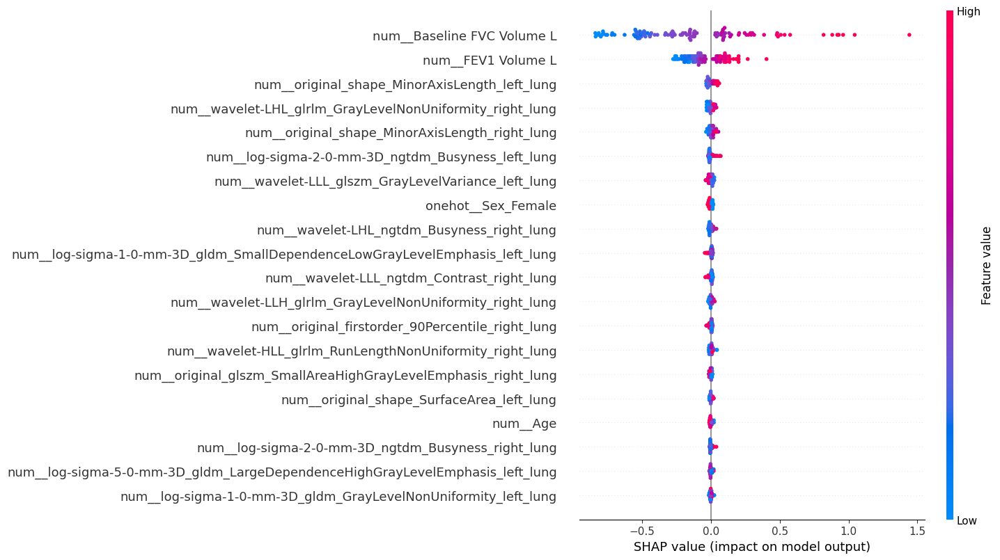

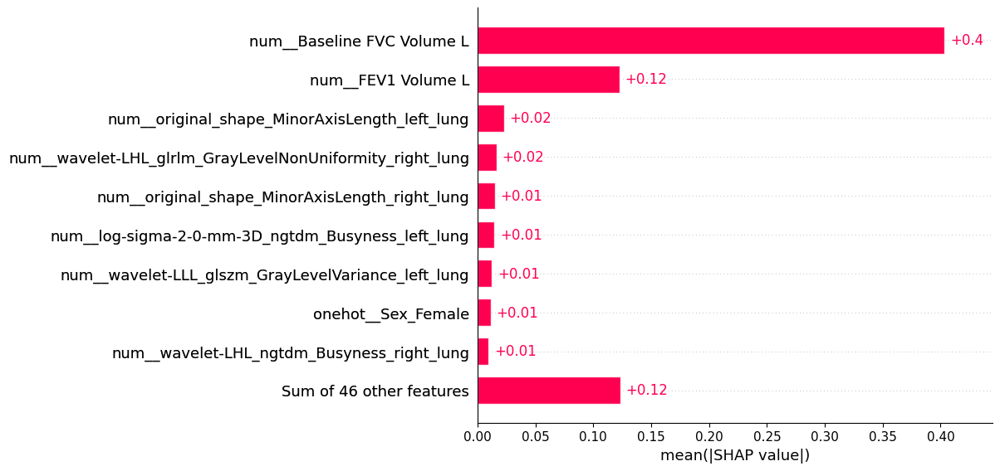

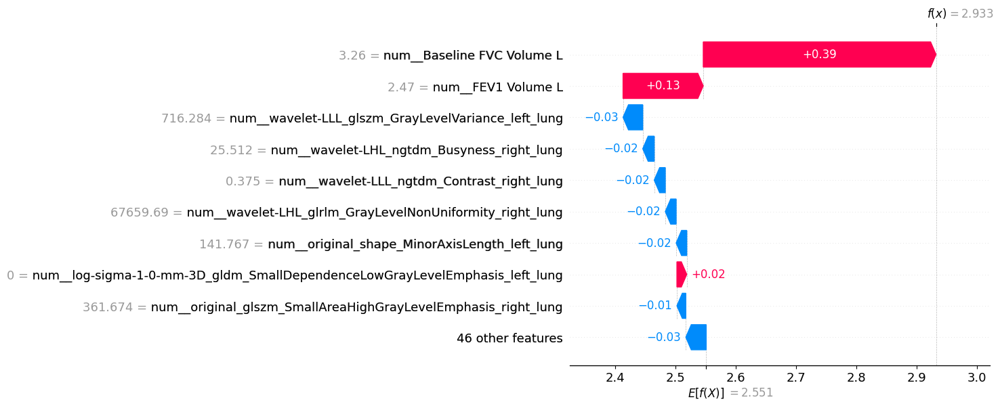

In [47]:
selected_features =['original_shape_MinorAxisLength_left_lung', 'wavelet-HHH_glcm_MCC_right_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-1-0-mm-3D_gldm_GrayLevelNonUniformity_left_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'original_glszm_SmallAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LLH_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LHL_firstorder_Kurtosis_right_lung', 'wavelet-LLL_glszm_GrayLevelNonUniformity_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HLL_glrlm_RunLengthNonUniformity_right_lung', 'original_firstorder_90Percentile_left_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LHL_ngtdm_Busyness_right_lung', 'log-sigma-5-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'wavelet-LLL_ngtdm_Contrast_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
# Run experiments
results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, 
                                  model_name="/home/pansurya/OSIC_thesis/RF_model/Hierarchical_mrmr_VIF_RF_without_harmonization.pkl")

Correlation-Based Pipelines 

['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Median_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Median_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung',

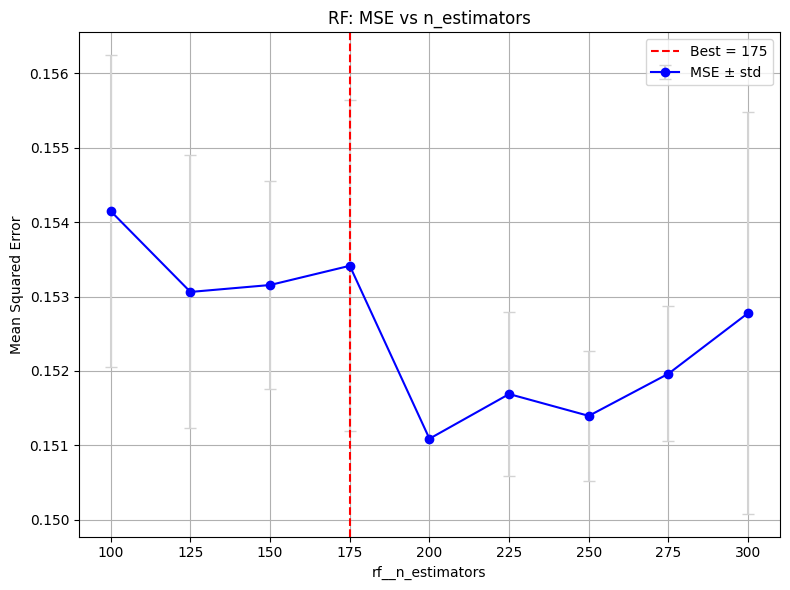

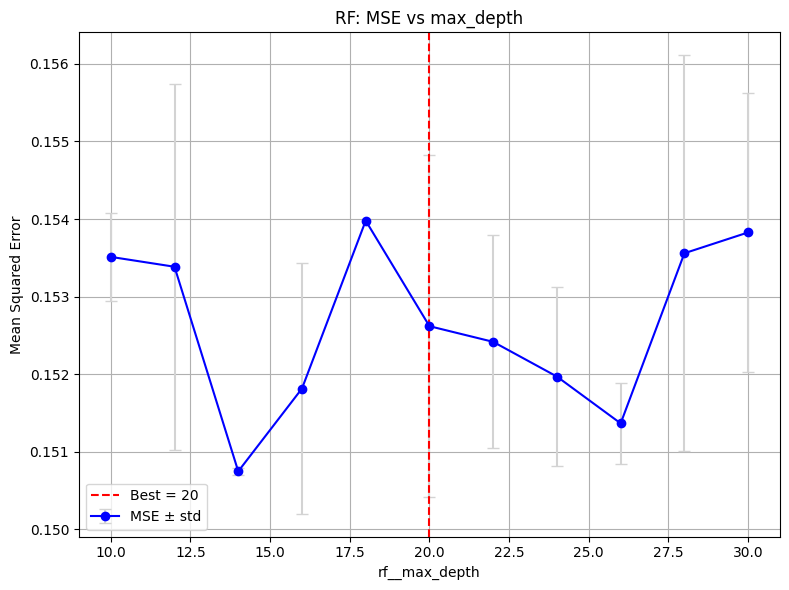

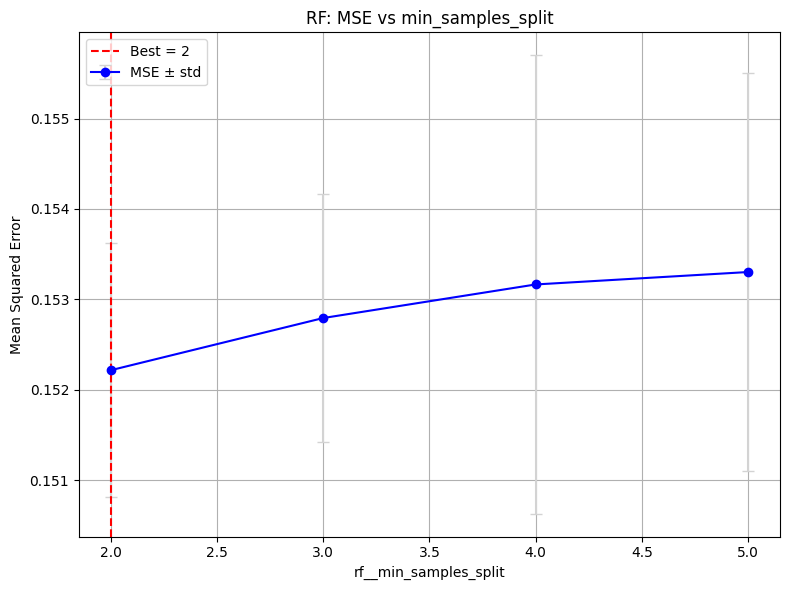

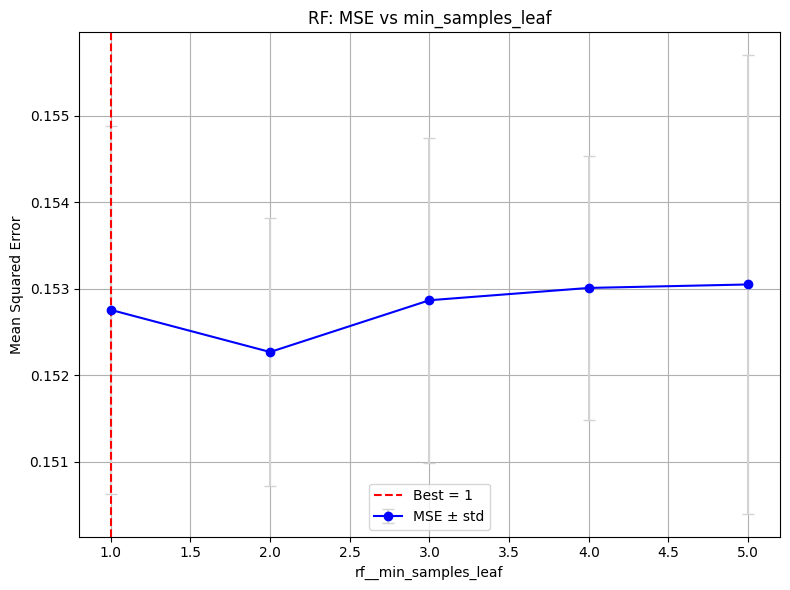

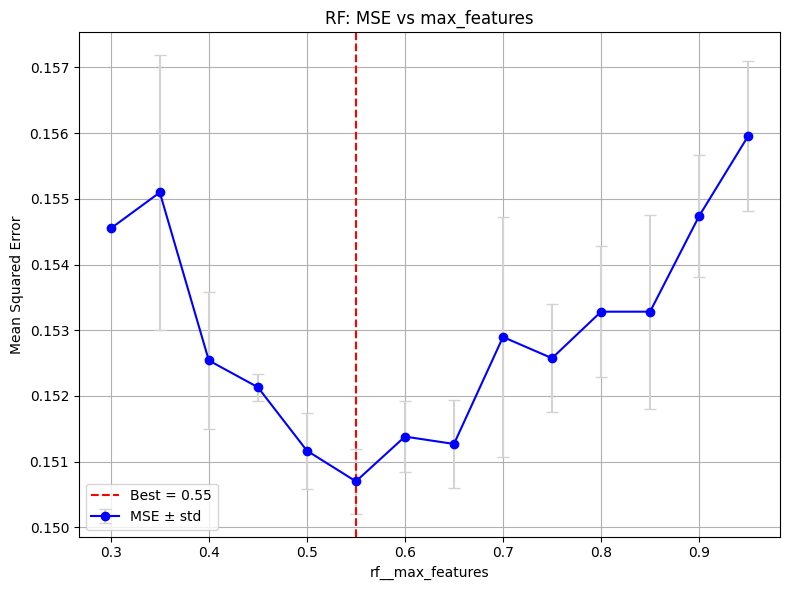

MAE: [0.2758360434086586, 0.2575178792798072, 0.28784051394862264, 0.2699749994218183, 0.2754438313894807, 0.24506427089330646, 0.3125958081013622, 0.25410446159088296, 0.2302685603603787, 0.2908513001360714, 0.3386934084739379, 0.2389870076292594, 0.26841566771338016, 0.2721374024461622, 0.2454167316321209]
MSE: [0.14808618831801706, 0.1316943326887235, 0.18577859461642962, 0.15033297483265595, 0.136375452724315, 0.10704163026566972, 0.1930459756050096, 0.1461982242557091, 0.10358346537626498, 0.18575878797077366, 0.24662097413941633, 0.1076996677960908, 0.14556426597744487, 0.13917054190296513, 0.12525374457273156]
RMSE: [0.38481968286200885, 0.3628971378899584, 0.4310204109046689, 0.38772796498660755, 0.36929047201940507, 0.3271721722055067, 0.4393699757664486, 0.3823587638013664, 0.32184385247549, 0.43099743383316524, 0.49660947850339743, 0.32817627549244144, 0.38152885340095166, 0.3730556820408518, 0.35391205768203426]
R2: [0.8345166813575939, 0.8412502044462428, 0.794311321140990

/tmp/ipykernel_3300194/3994163005.py:256: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


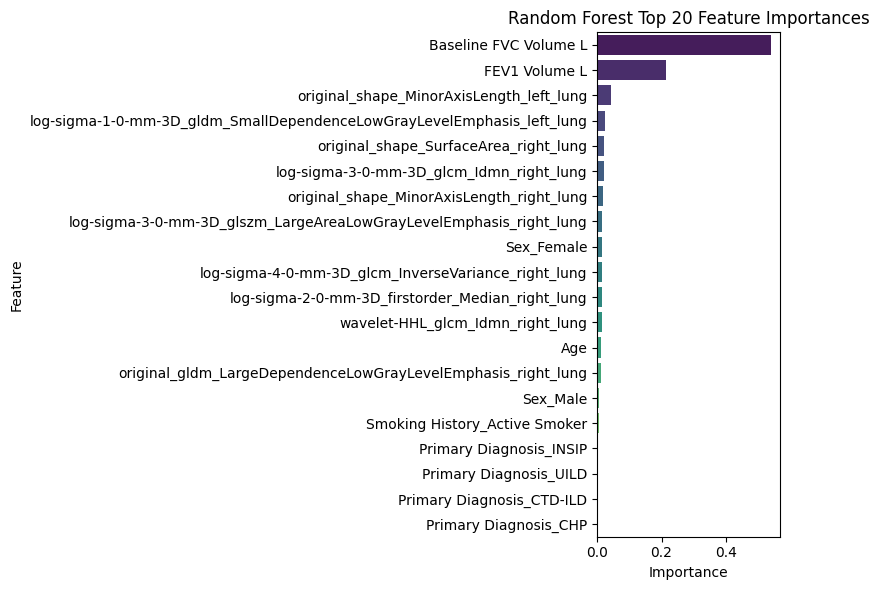

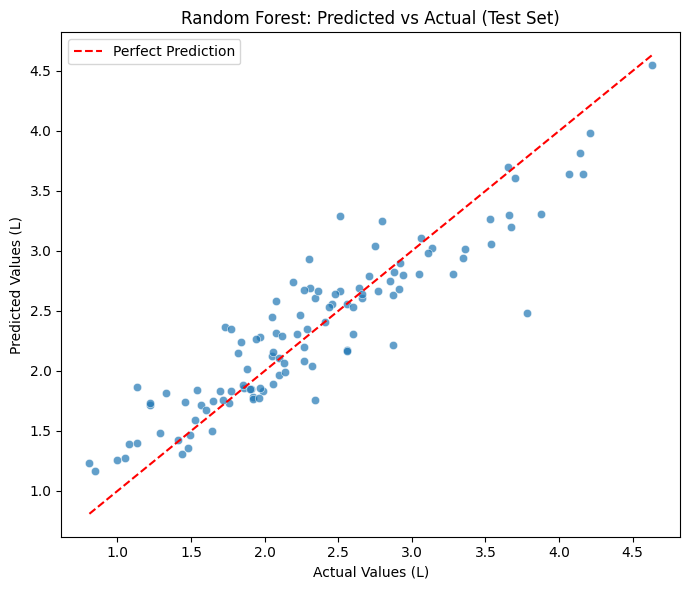

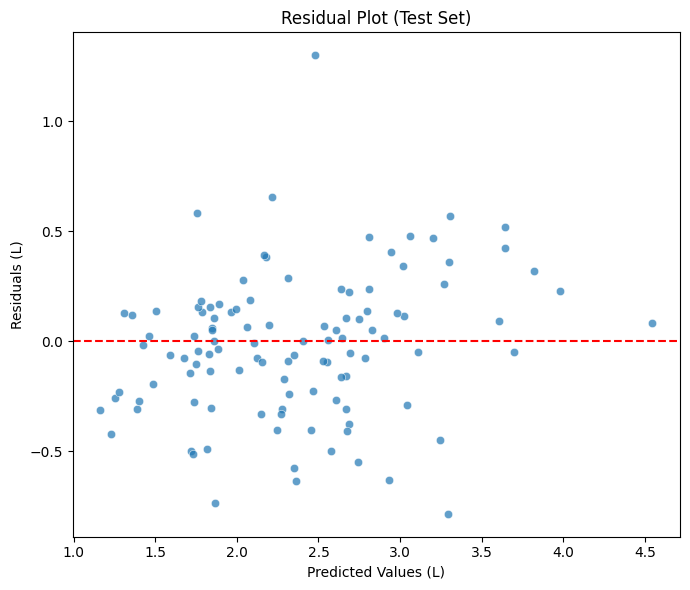


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
123          2.23        3.78       2.478914   1.301086                0.0   
152          3.63        2.51       3.294400   0.784400                0.0   
368          1.56        1.13       1.866743   0.736743                0.0   
91           2.42        2.87       2.213829   0.656171                0.0   
326          2.37        1.73       2.363943   0.633943                0.0   

     Followup_FVC_Week  
123               51.0  
152               53.0  
368               49.0  
91                48.0  
326               56.0  


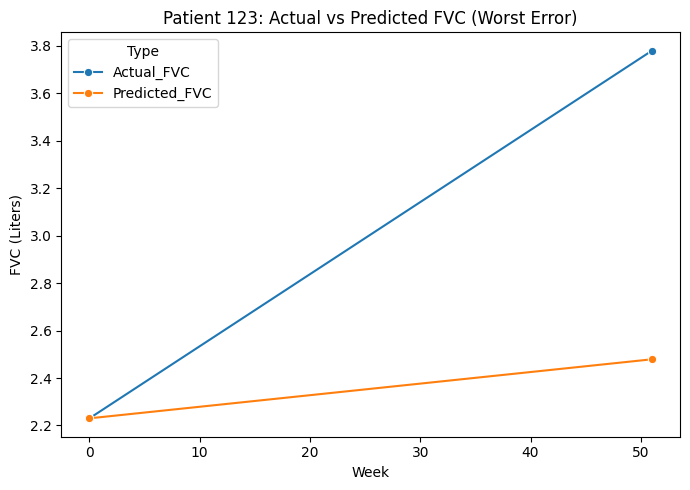

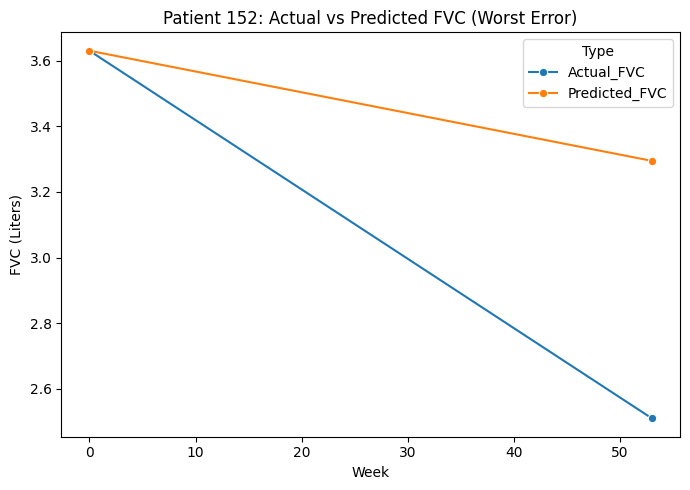

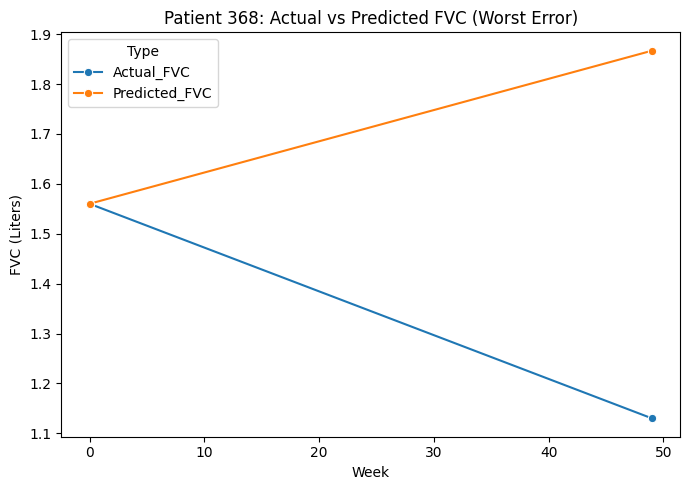

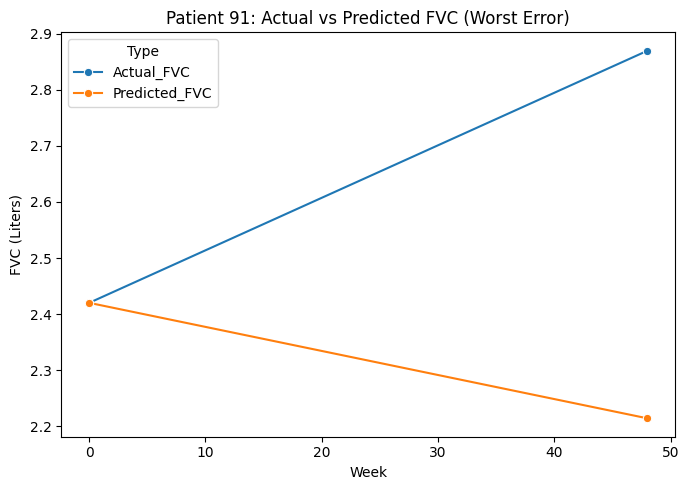

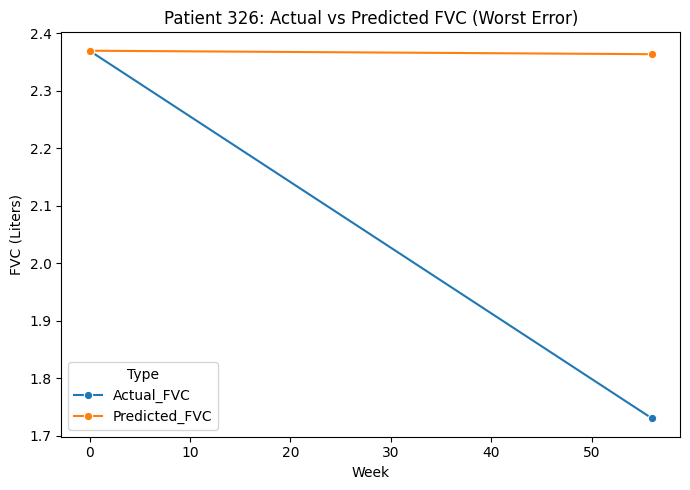


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
114          2.47        2.56       2.555429   0.004571                0.0   
514          2.65        2.66       2.644343   0.015657                0.0   
8            1.32        1.41       1.427543   0.017543                0.0   
511          1.43        1.49       1.463943   0.026057                0.0   
426          1.66        1.72       1.762000   0.042000                0.0   

     Followup_FVC_Week  
114               51.0  
514               52.0  
8                 52.0  
511               54.0  
426               52.0  


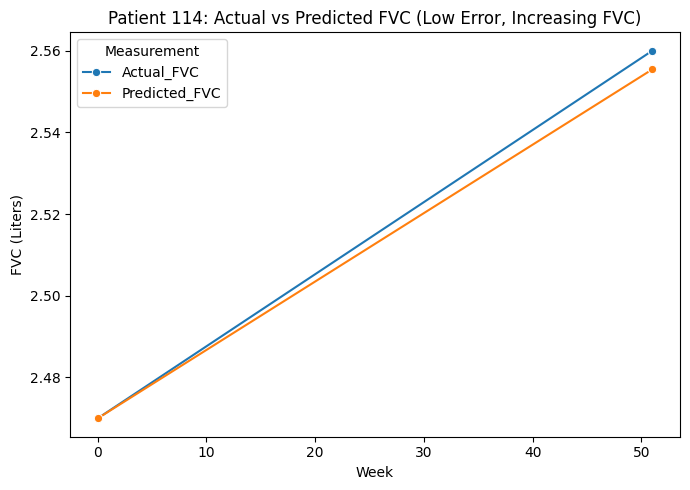

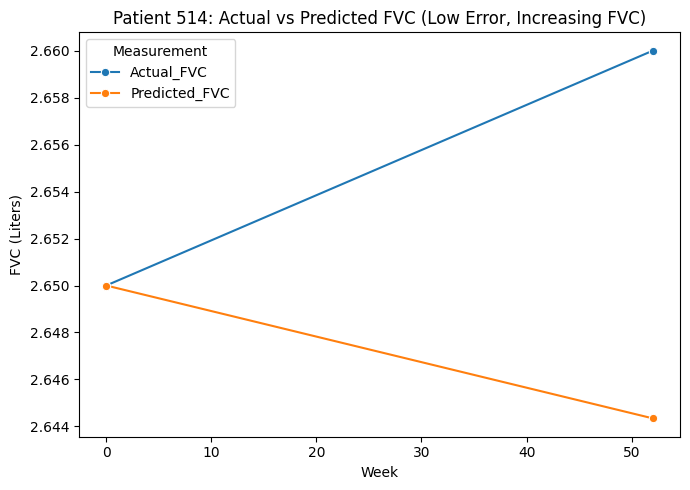

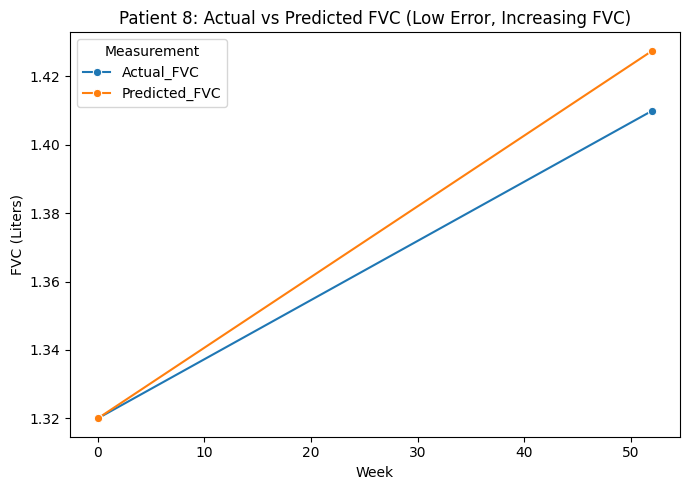

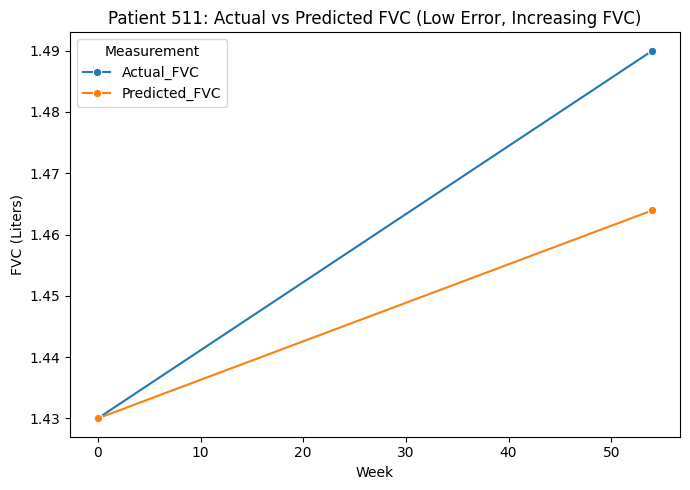

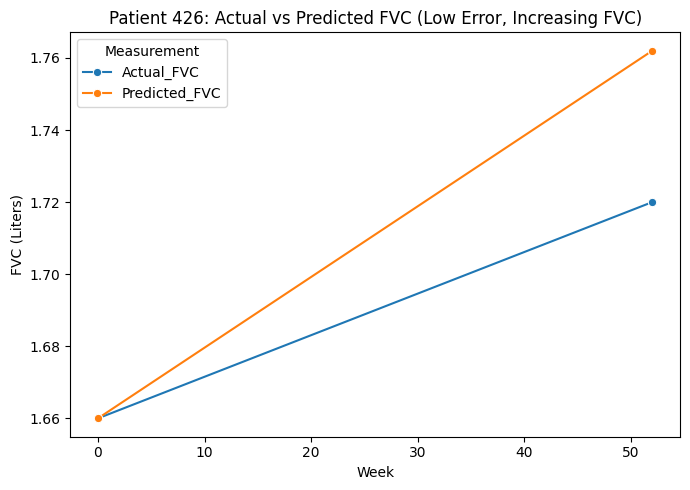

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


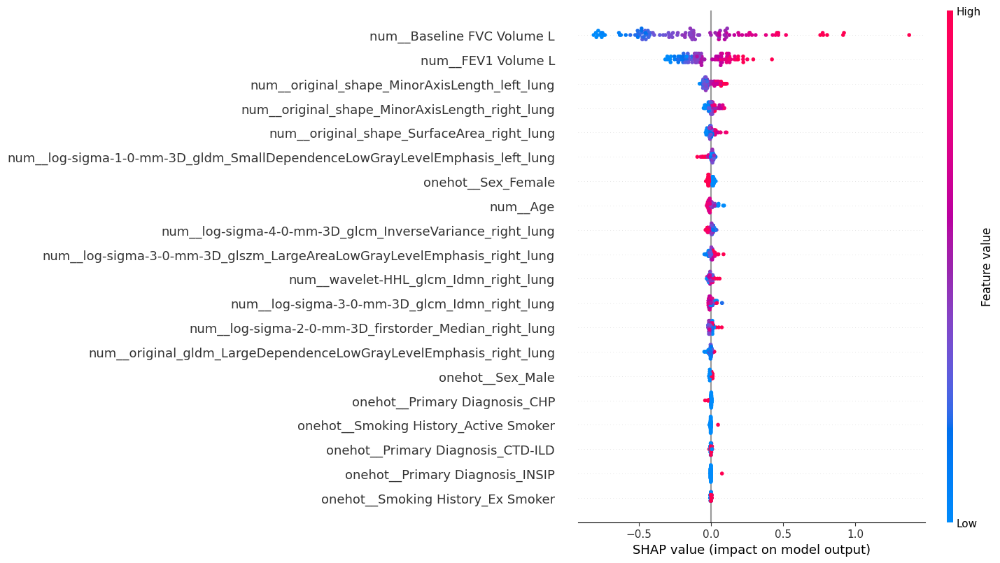

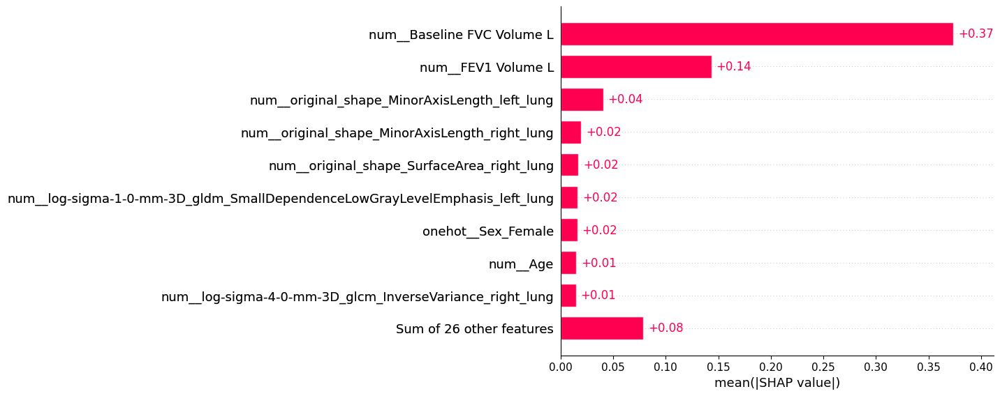

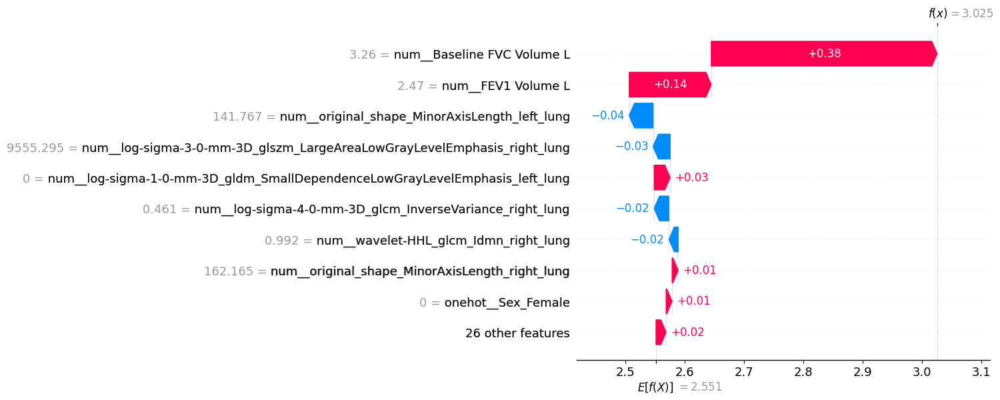

In [48]:
selected_features = ['original_shape_MinorAxisLength_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Median_right_lung', 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)
results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, 
                                         model_name="/home/pansurya/OSIC_thesis/RF_model/Correlation_based_Using_Target_FVC_RF_without_harmonization.pkl")

['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_Depende

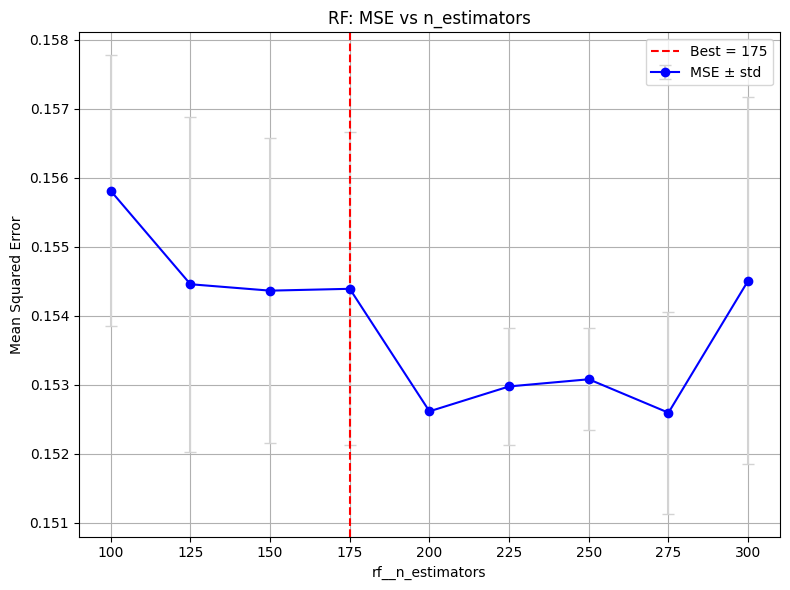

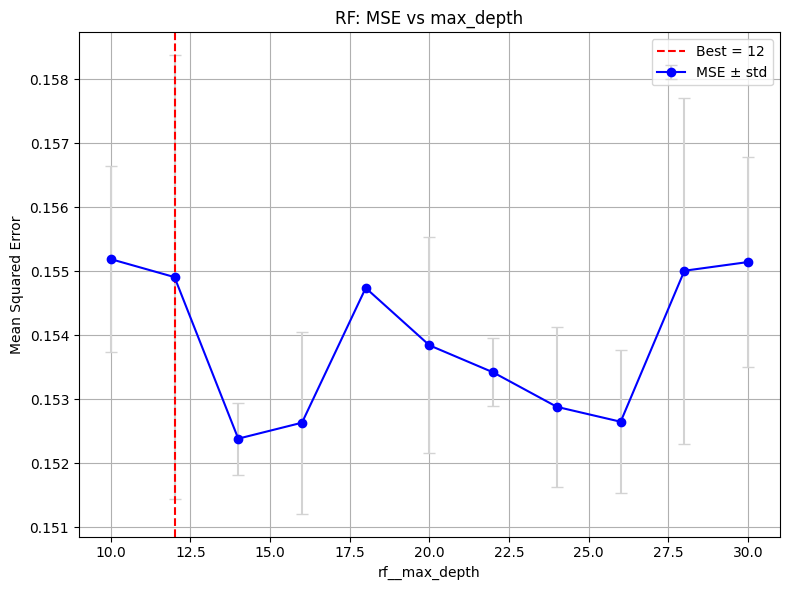

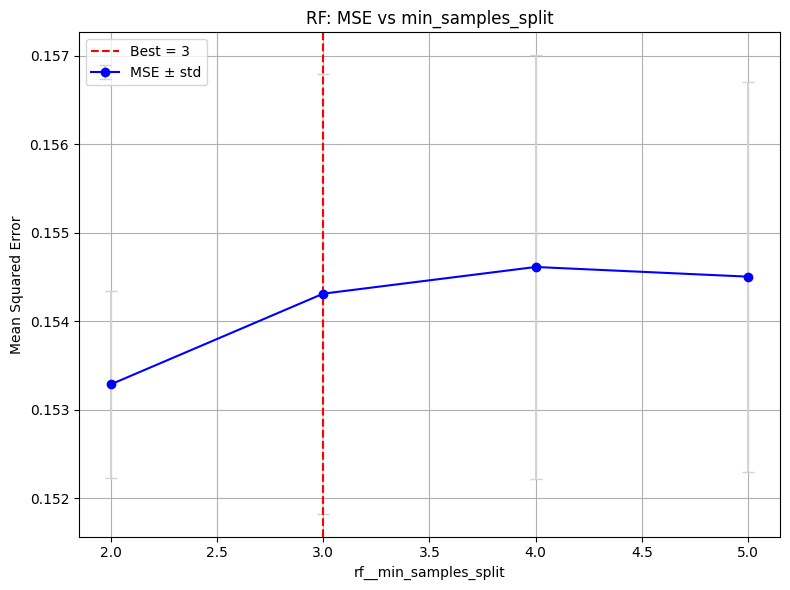

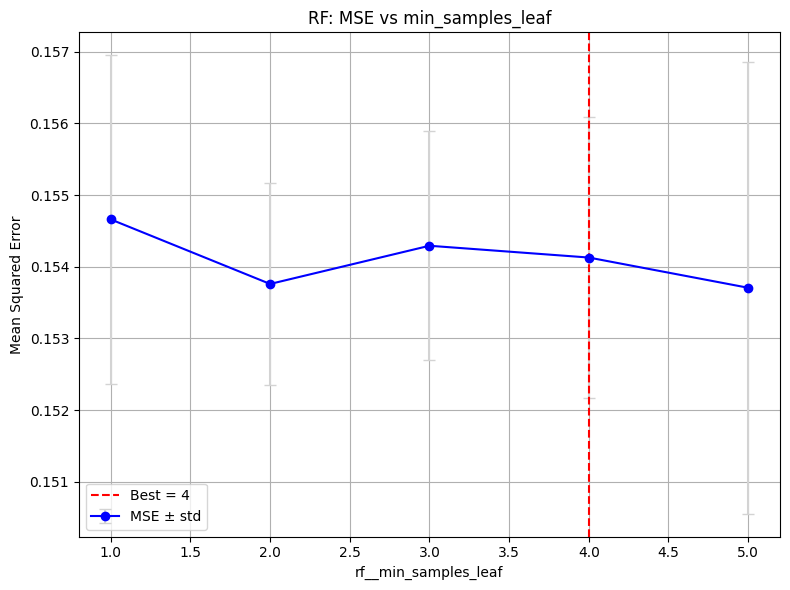

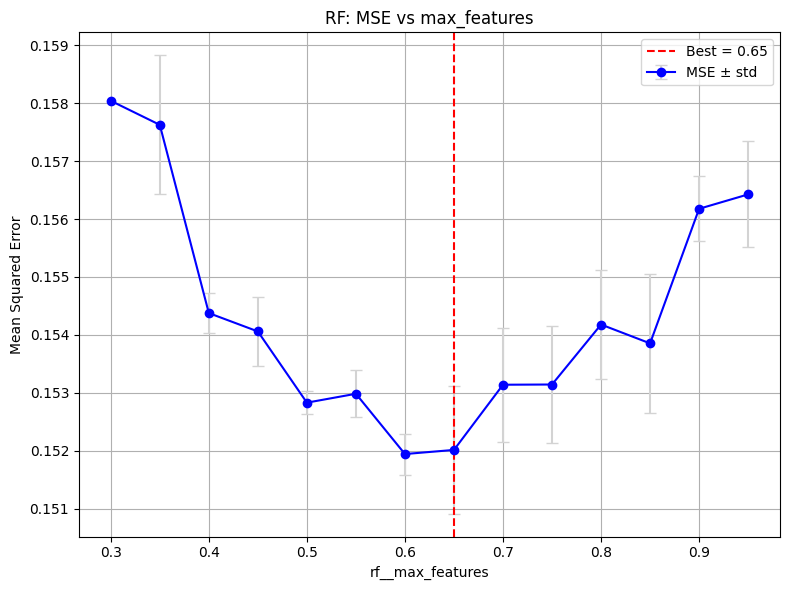

MAE: [0.26807683418266315, 0.25833829160087823, 0.2986750478647133, 0.26025329367279104, 0.267484514450639, 0.2411228773344741, 0.31284328594461575, 0.25536769575964074, 0.21966166046771038, 0.2976760835687317, 0.33218564579730686, 0.230664616528875, 0.27594724041016044, 0.27729596215104774, 0.24685925938687678]
MSE: [0.1422096728034538, 0.13305914500754193, 0.19892331934661883, 0.14634502531828153, 0.13582500834047964, 0.1040598567052102, 0.1951588817389159, 0.1493535975064336, 0.10083967949831397, 0.1972331935334852, 0.23519898689983376, 0.10348225238966025, 0.15779020916427963, 0.1401643587259409, 0.12634238278942192]
RMSE: [0.3771069779299421, 0.3647727306248946, 0.44600820547005504, 0.3825506833326553, 0.3685444455428404, 0.32258310046437677, 0.44176790483116346, 0.3864629316072029, 0.3175526405154175, 0.4441094386899306, 0.4849731816294936, 0.3216865747737388, 0.3972281575672596, 0.374385307839318, 0.3554467369233004]
R2: [0.8410835685227571, 0.8396050032279505, 0.779757862658325

/tmp/ipykernel_3300194/3994163005.py:256: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


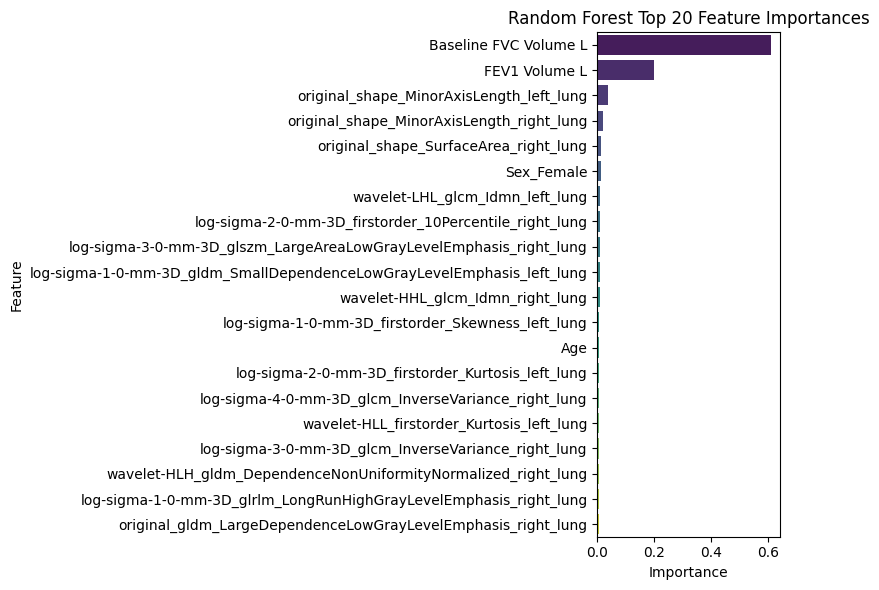

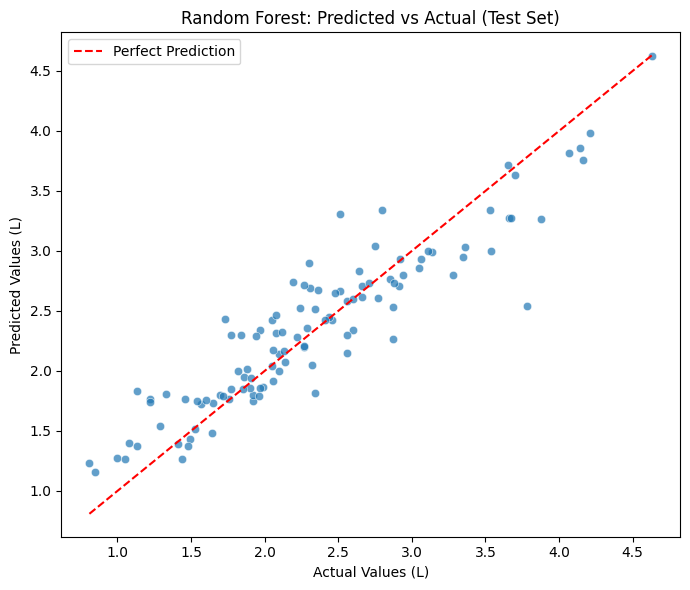

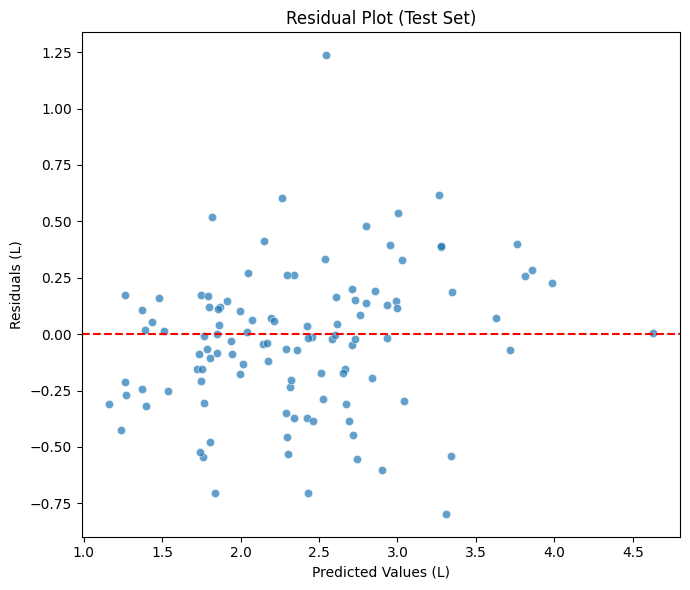


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
123          2.23        3.78       2.543426   1.236574                0.0   
152          3.63        2.51       3.306630   0.796630                0.0   
368          1.56        1.13       1.835603   0.705603                0.0   
326          2.37        1.73       2.432234   0.702234                0.0   
81           3.59        3.88       3.263289   0.616711                0.0   

     Followup_FVC_Week  
123               51.0  
152               53.0  
368               49.0  
326               56.0  
81                52.0  


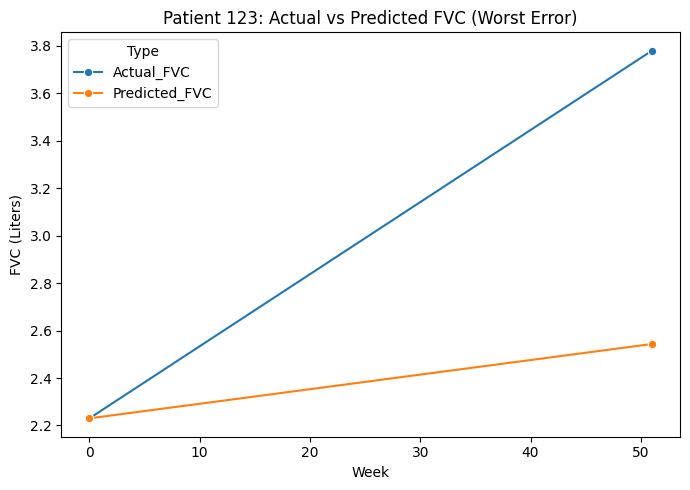

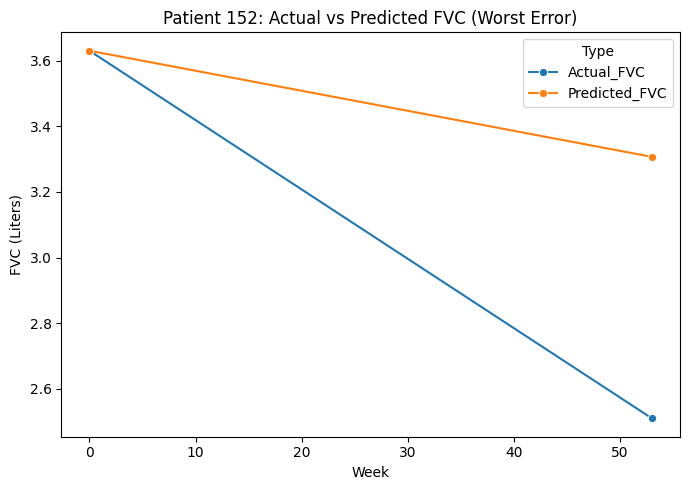

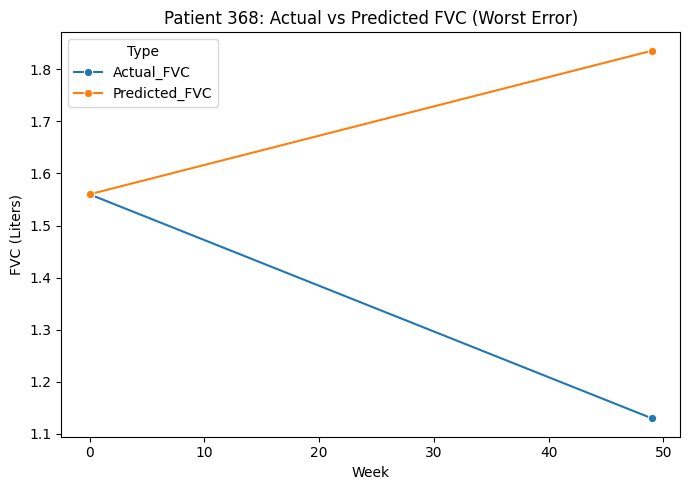

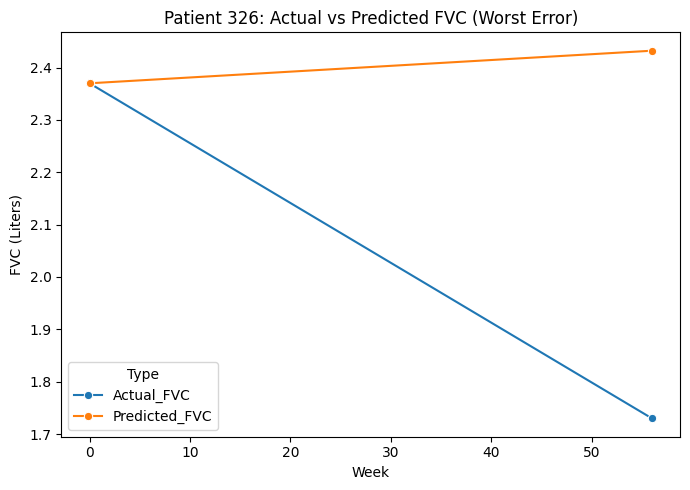

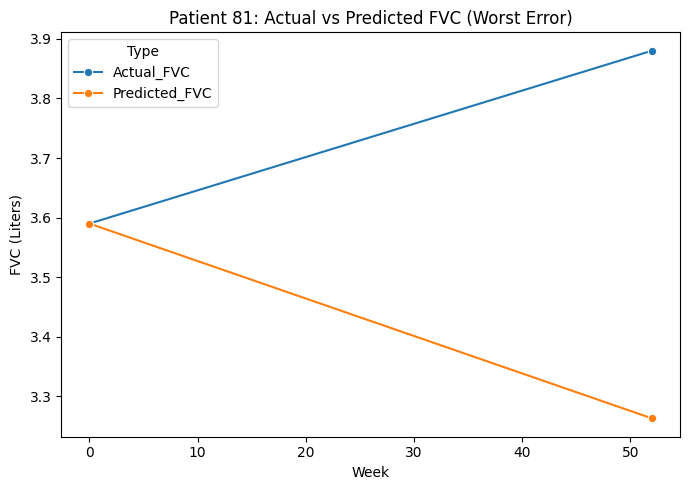


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
467          2.38        2.60       2.602280   0.002280                0.0   
4            2.35        2.44       2.453187   0.013187                0.0   
8            1.32        1.41       1.392718   0.017282                0.0   
506          2.65        2.71       2.730162   0.020162                0.0   
114          2.47        2.56       2.581120   0.021120                0.0   

     Followup_FVC_Week  
467               56.0  
4                 51.0  
8                 52.0  
506               52.0  
114               51.0  


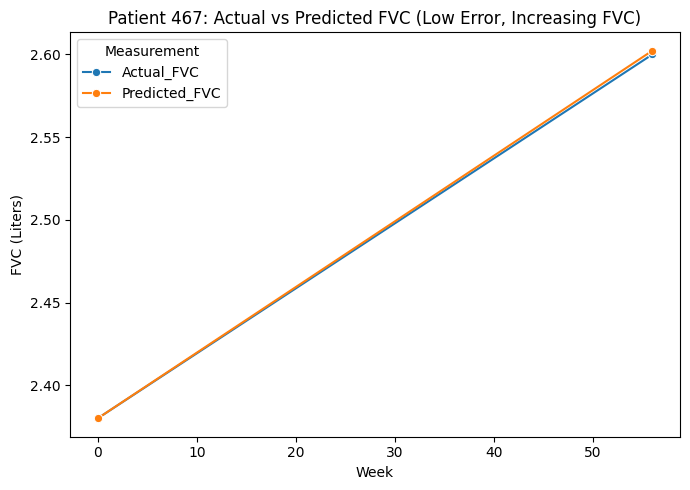

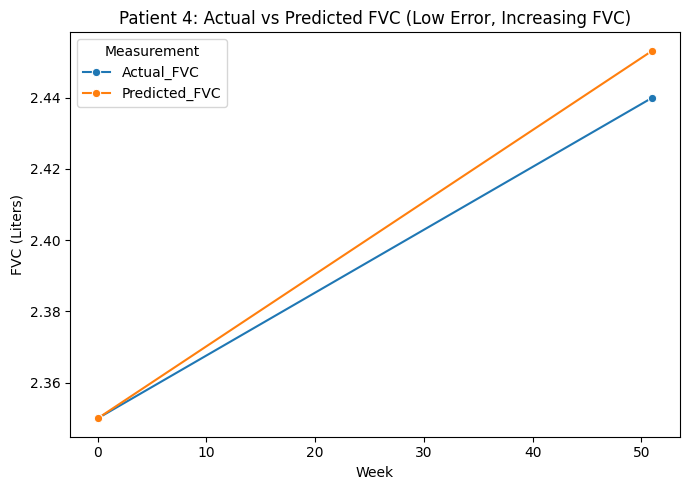

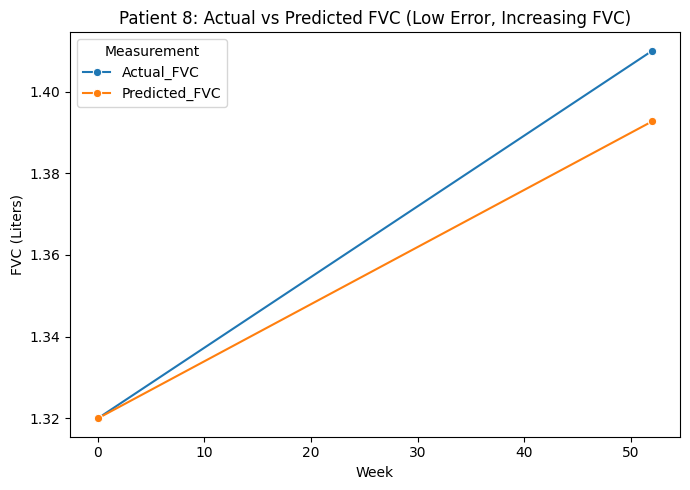

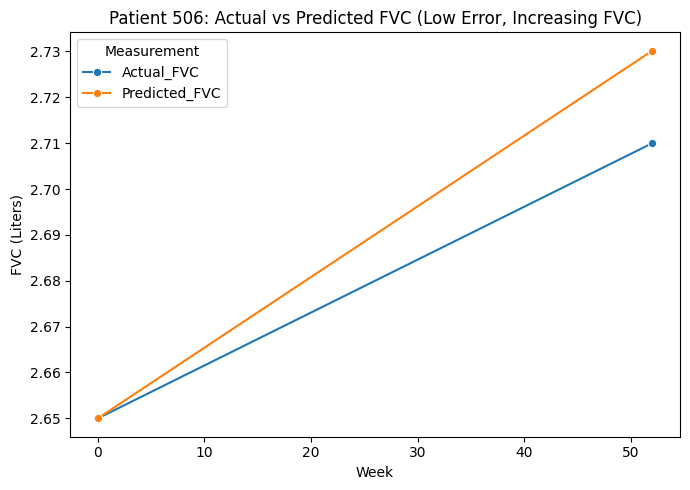

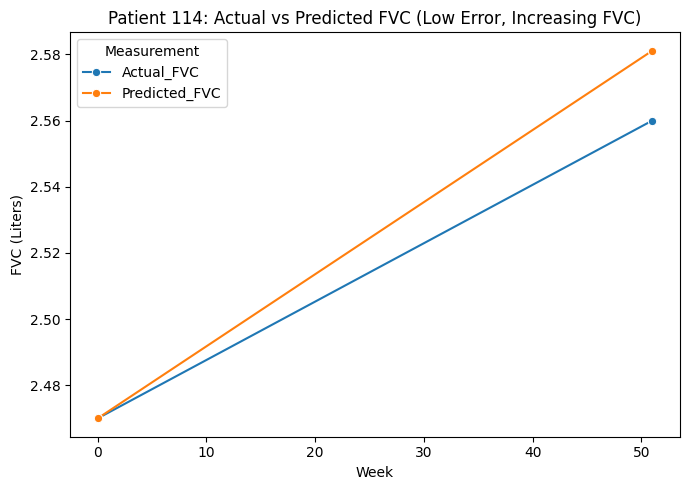

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


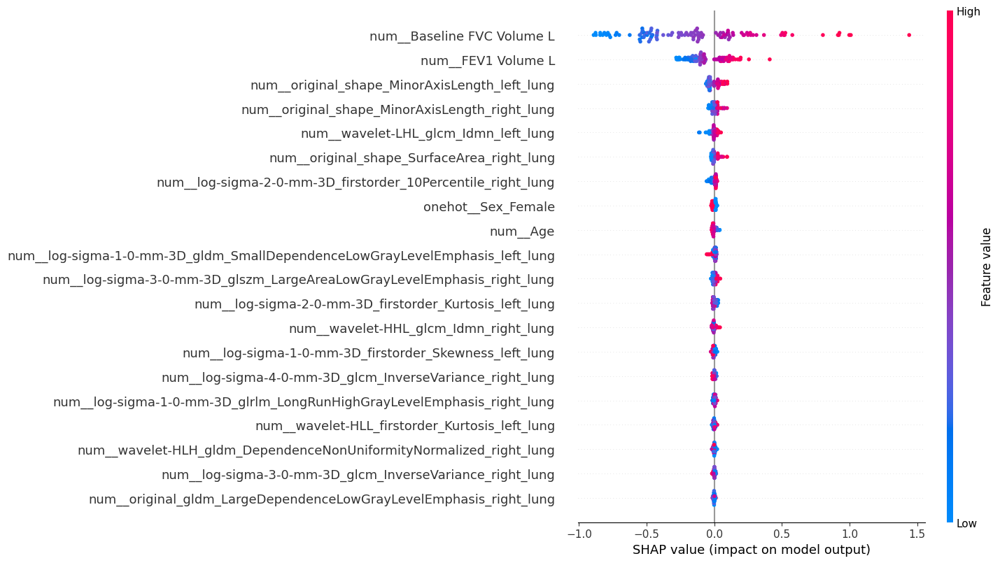

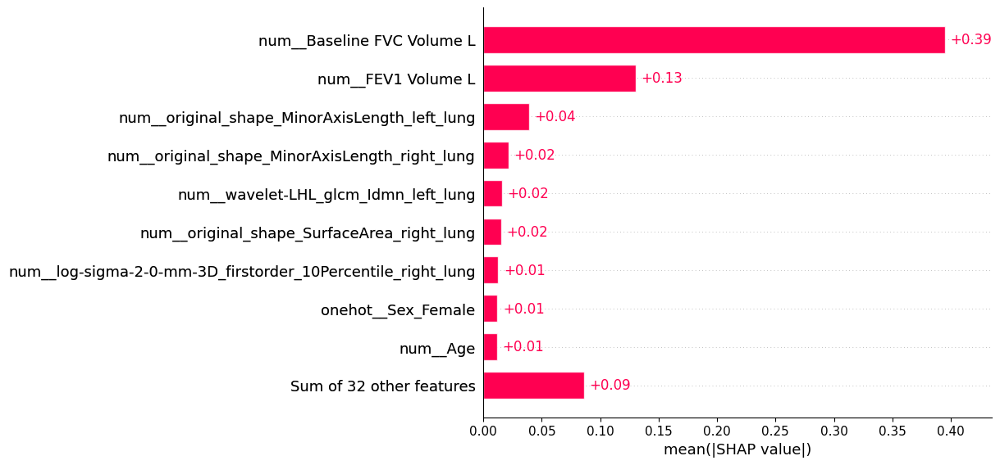

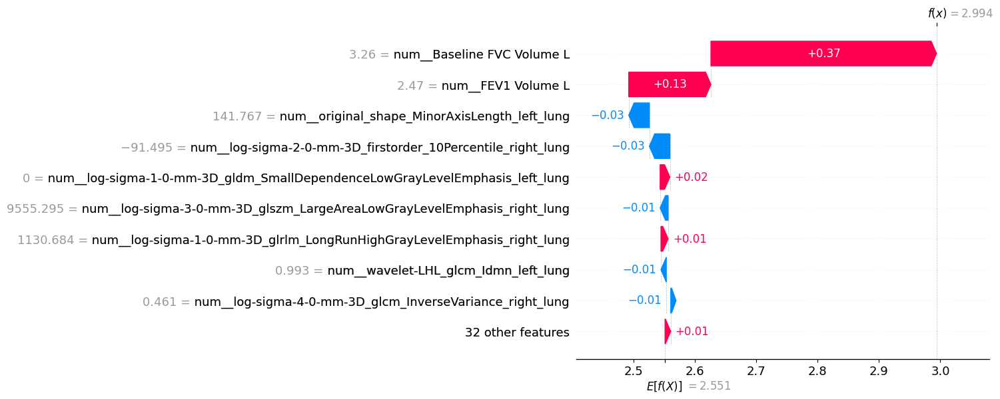

In [49]:
selected_features = ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)


# Run experiments
results1 = train_and_evaluate_rf(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, 
                                         model_name="/home/pansurya/OSIC_thesis/RF_model/Correlation_based_Using_mrmr_RF_without_harmonization.pkl")

Other things

/tmp/ipykernel_2759473/739066151.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_melted, x="Model", y="R2", palette="Set2")


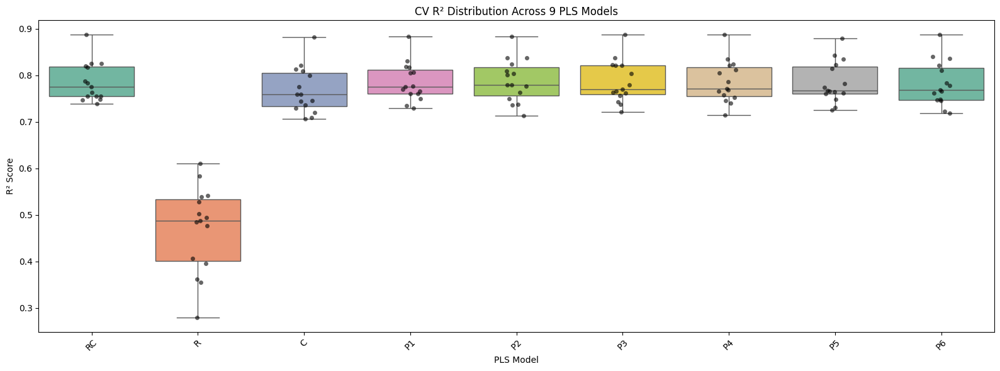

In [27]:
pls_results = {
    "RC": [0.7554874123573141, 0.7471823318763549, 0.8195041135101304, 0.7753177539735523, 0.8167971777719527, 0.8871574576974492, 0.7637618012132874, 0.7487705877362298, 0.7831677374420193, 0.7548845120237871, 0.8254894316191425, 0.7557789431977608, 0.7386092747138328, 0.8257704054273862, 0.7878815954627715],
    "R": [0.5280972681253364, 0.27891300603011493, 0.5419755513413791, 0.3553123039564786, 0.6101331406623545, 0.5391640866294705, 0.36121375474474526, 0.5019644554732017, 0.4874043448871519, 0.4768731383938559, 0.49440437472632326, 0.39505793513201026, 0.4057987708825346, 0.5829909898868927, 0.48517017512055993],
    "C": [0.7294435219512856, 0.7071124952609547, 0.8209754808245175, 0.7597521917709761, 0.8096076888843041, 0.882313535548897, 0.7589153313545647, 0.7088294985085906, 0.736377853927209, 0.7439415956161815, 0.8127534672867304, 0.7205237495045975, 0.7461932794650122, 0.7998942514343653, 0.7755079140211141],
"P1": [0.7657354703010051, 0.7300308562196229, 0.8183671231805134, 0.7755914975960979, 0.8314157007601257, 0.8835673664772226, 0.7706542154028468, 0.7491939210636269, 0.7764901353798044, 0.7611528531815074, 0.8175448190705441, 0.7604464380590759, 0.7344068222855401, 0.807088330433551, 0.8054000657864275],
"P2": [0.779757226431832, 0.7360210124844773, 0.8244155423146005, 0.7772669718360141, 0.8036269128106212, 0.8830550537648467, 0.7637340699932399, 0.738033342529305, 0.8012066389249821, 0.7791068168709929, 0.8372952774376838, 0.7503134241358274, 0.7135876162925547, 0.837143108730398, 0.8097869744259434],
"P3": [0.7631432514751589, 0.7377503650707801, 0.8372876279939402, 0.7705392057885763, 0.8210179766865072, 0.8872037306724793, 0.7666400737156962, 0.7433221332924798, 0.7799616288174909, 0.7562933667097131, 0.821963663873932, 0.7618268889142654, 0.7211256780160743, 0.8227983440611365, 0.8035554243925022],
"P4": [0.7720420951367539, 0.7408529330362701, 0.8344582568092488, 0.766587771606565, 0.811563059736901, 0.8874485952346594, 0.7517860574837588, 0.7460441922340489, 0.7864245319167698, 0.7688109330793405, 0.821872026376987, 0.7580013270325916, 0.7143918002182679, 0.8243370448843319, 0.8049458788951376],
"P5": [0.7600756132044166, 0.7259625283004653, 0.8351672797217196, 0.7650669425459362, 0.8431535830085413, 0.8798458598736136, 0.7743253658246658, 0.7486425335528177, 0.7656818915936189, 0.7675497013956744, 0.8143603736508751, 0.7619223769877019, 0.7306787683817109, 0.8226704638837242, 0.7821801632206317],
"P6": [0.7687376140510712, 0.7182606512022245, 0.8367646311287795, 0.7455083272183887, 0.8397711817898251, 0.8879036200791417, 0.7786332813279263, 0.7464493007577155, 0.7663489177043074, 0.748751367374916, 0.8101517524519002, 0.7621980814042153, 0.7227940759655977, 0.8216764674691751, 0.7831040641899755]
}

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------
# Convert dictionary → long-format DataFrame
# -----------------------------------------
df = pd.DataFrame(pls_results)
df_melted = df.melt(var_name="Model", value_name="R2")

# -----------------------------------------
# Plot: Individual boxplots for each model
# -----------------------------------------
plt.figure(figsize=(16, 6))
sns.boxplot(data=df_melted, x="Model", y="R2", palette="Set2")
sns.stripplot(data=df_melted, x="Model", y="R2",
              color="black", alpha=0.6, jitter=True)

plt.title("CV R² Distribution Across 9 PLS Models")
plt.xlabel("PLS Model")
plt.ylabel("R² Score")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/tmp/ipykernel_1056000/713141644.py:46: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=melted, x="Metric", y="Value", hue="Model",


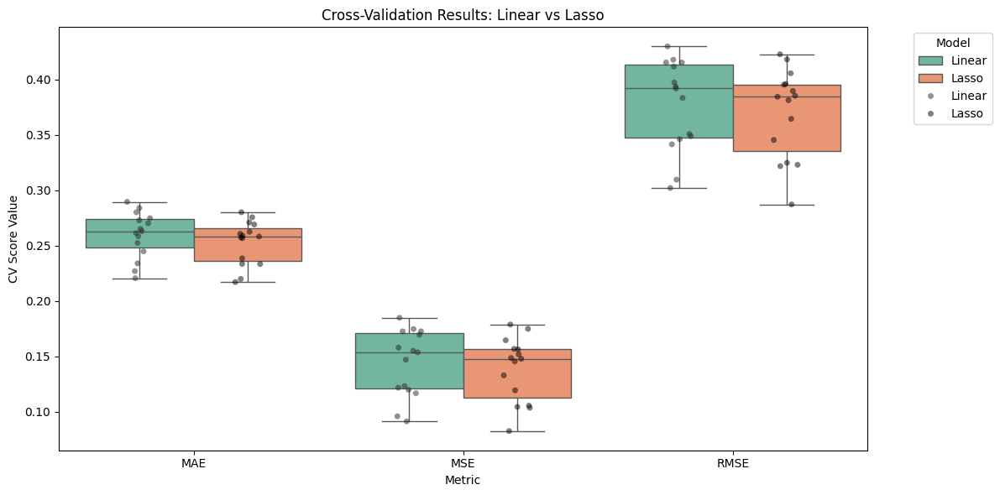

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------
# Linear model CV results (15 folds)
# ------------------------------
linear_data = {
    "RepeatFold": list(range(1, 16)),
'MAE': [0.26295306171150423, 0.25236078861666833, 0.27276023364192753, 0.23388352193766943, 0.2649739889182695, 0.2746773690750782, 0.2839014819541063, 0.22044785304343154, 0.2447320561017776, 0.2894733957827127, 0.26124071150463324, 0.28003895864310846, 0.22688404625326866, 0.2700772622503131, 0.25833511052731467],
'MSE': [0.15491894290453037, 0.11975374368877044, 0.17251037388003468, 0.12160248798585387, 0.14687756201990482, 0.17248454245086872, 0.16938886151066385, 0.09577973781411005, 0.11656507698031575, 0.1847724718829563, 0.15781188886471295, 0.17456201141766484, 0.09119094937022035, 0.15355683303650186, 0.12302798719345225],
'RMSE': [0.3935974376244469, 0.34605453860449575, 0.41534368164212476, 0.34871548285938475, 0.3832460854593362, 0.4153125840266205, 0.41156878102045574, 0.30948301700434233, 0.3414162810709468, 0.42985168591382344, 0.3972554453556464, 0.4178061888216411, 0.301978392224047, 0.3918632836034806, 0.3507534564240989],
}
linear_cv = pd.DataFrame(linear_data)
linear_cv["Model"] = "Linear"

# ------------------------------
# Lasso model CV results (15 folds)
# ------------------------------
lasso_data = {
    "RepeatFold": list(range(1, 16)),
'MAE': [0.2590482079644644, 0.2573376947830238, 0.25660512360832577, 0.2333733120352697, 0.2624007573263708, 0.2605998152576159, 0.2755178298703751, 0.23326220673578993, 0.21981740937646554, 0.28007303800502314, 0.2690068242847488, 0.2708468799744973, 0.21698949514268348, 0.25810541991940317, 0.23841767998554364],
'MSE': [0.14771481827553853, 0.13275970989693076, 0.1453665641859832, 0.11924180787572425, 0.15670132035183346, 0.15174738911310842, 0.15624367257658947, 0.1054239092976543, 0.10426422528377767, 0.17476543876704276, 0.1644637115318106, 0.1786982575616283, 0.08243528987660072, 0.1484377634625975, 0.10350205707032835],
'RMSE': [0.3843368552136765, 0.3643620588054288, 0.3812696738346537, 0.3453140713549395, 0.3958551759821178, 0.3895476724524335, 0.39527670381213903, 0.32469048230222936, 0.3228997139728954, 0.41804956496454193, 0.40554125749646064, 0.4227271668128609, 0.2871154643633824, 0.3852762170996252, 0.32171735587364314],
}
lasso_cv = pd.DataFrame(lasso_data)
lasso_cv["Model"] = "Lasso"

# ------------------------------
# Combine and reshape
# ------------------------------
combined = pd.concat([linear_cv, lasso_cv], ignore_index=True)

melted = combined.melt(
    id_vars=["RepeatFold", "Model"],
    value_vars=["MAE", "MSE", "RMSE"],
    var_name="Metric",
    value_name="Value"
)

# ------------------------------
# Plot boxplots
# ------------------------------
plt.figure(figsize=(12, 6))
sns.boxplot(data=melted, x="Metric", y="Value", hue="Model", palette="Set2")
sns.stripplot(data=melted, x="Metric", y="Value", hue="Model",
              dodge=True, color="black", alpha=0.5)

plt.title("Cross-Validation Results: Linear vs Lasso")
plt.ylabel("CV Score Value")
plt.xlabel("Metric")
plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


['original_firstorder_Kurtosis_right_lung', 'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LLL_glrlm_RunLengthNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_glrlm_GrayLevelNonUniformity_left_lung', 'original_firstorder_MeanAbsoluteDeviation_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung', 'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'original_glrlm_GrayLevelNonUniformity_right_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-5-0-mm-3D_firstorder_Energy_left_lung', 'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung

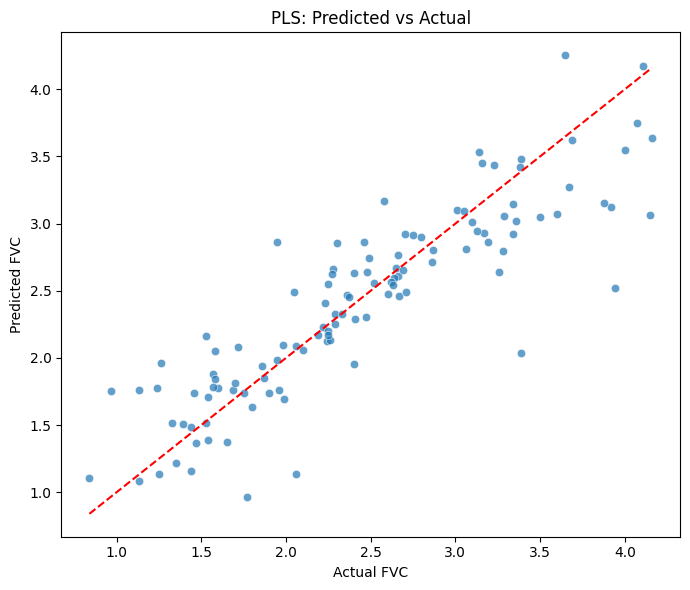

In [9]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

def train_pls_with_tuning(X_train, X_test, y_train, y_test, selected_features,
                          numeric_features, onehot_features,
                          model_name="pls_best_model.pkl"):

    # Preprocessing
    preprocessor = ColumnTransformer([
        ("num", StandardScaler(), numeric_features),
        ("cat", "passthrough", onehot_features)
    ])

    # Pipeline
    pipeline = Pipeline([
        ("pre", preprocessor),
        ("pls", PLSRegression())
    ])

    # Grid search over number of components
    param_grid = {
        "pls__n_components": list(range(2, min(len(numeric_features) + len(onehot_features), 20)))
    }

    grid = GridSearchCV(
        pipeline,
        param_grid,
        cv=5,
        scoring="neg_mean_squared_error",
        n_jobs=-1
    )

    grid.fit(X_train, y_train)

    # Best model
    best_model = grid.best_estimator_
    best_n = grid.best_params_["pls__n_components"]
    print(f"✅ Best number of components: {best_n}")

    # Evaluate on test set
    y_test_pred = best_model.predict(X_test)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r2 = r2_score(y_test, y_test_pred)

    print("\n📊 Test set performance:")
    print(f"MAE:  {test_mae:.3f}")
    print(f"RMSE: {test_rmse:.3f}")
    print(f"R²:   {test_r2:.3f}")

    # Save model
    joblib.dump(best_model, model_name)

    # Plot predicted vs actual
    plt.figure(figsize=(7, 6))
    sns.scatterplot(x=y_test, y=y_test_pred.flatten(), alpha=0.7)
    plt.plot([y_test.min(), y_test.max()],
             [y_test.min(), y_test.max()],
             color="red", linestyle="--")
    plt.xlabel("Actual FVC")
    plt.ylabel("Predicted FVC")
    plt.title("PLS: Predicted vs Actual")
    plt.tight_layout()
    plt.show()

    return {
        "best_n_components": best_n,
        "test_results": {
            "MAE": test_mae,
            "RMSE": test_rmse,
            "R2": test_r2
        }
    }


selected_features = ['original_firstorder_Kurtosis_right_lung',
       'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung',
       'wavelet-LLL_glrlm_RunLengthNonUniformity_right_lung',
       'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung',
       'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
       'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_lung',
       'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-1-0-mm-3D_glrlm_GrayLevelNonUniformity_left_lung',
       'original_firstorder_MeanAbsoluteDeviation_right_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung',
       'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung',
       'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung',
       'original_glrlm_GrayLevelNonUniformity_right_lung',
       'original_firstorder_90Percentile_right_lung',
       'log-sigma-5-0-mm-3D_firstorder_Energy_left_lung',
       'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-2-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_RunPercentage_left_lung',
       'wavelet-LLL_firstorder_90Percentile_left_lung',
       'wavelet-HLL_glrlm_RunLengthNonUniformity_right_lung',
       'log-sigma-1-0-mm-3D_glszm_ZoneVariance_left_lung',
       'original_shape_MinorAxisLength_left_lung',
       'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung',
       'original_glszm_LargeAreaLowGrayLevelEmphasis_left_lung',
       'log-sigma-4-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung',
       'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung']
Clinical_Contineous_data_ext = Clinical_Contineous_data + selected_features
print(selected_features)
X_train, X_test, y_train, y_test = joblib.load("data_splits.pkl")
# Subset features
X_train_sel = X_train[selected_features]
X_test_sel = X_test[selected_features]
print(X_train_sel.shape)
print(X_test_sel.shape)
# Run experiments
results1 = train_pls_with_tuning(X_train, X_test, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF.pkl")

In [11]:
import shap

# Load your trained pipeline
pipeline = joblib.load("/home/pansurya/OSIC_thesis/Linear_model/Hierarchical_ANOVA_VIF.pkl")
X_train, X_test, y_train, y_test = joblib.load("data_splits_without_nan.pkl")

# Select background data (subset of training set for SHAP)
X_background = X_train.sample(100, random_state=42)

# Create SHAP explainer
explainer = shap.Explainer(pipeline.predict, X_background)

# Compute SHAP values for test set
shap_values = explainer(X_test)




ValueError: max_evals=500 is too low for the Permutation explainer, it must be at least 2 * num_features + 1 = 5305!

In [3]:
import joblib
import pandas as pd

import pandas as pd

# One patient's data with all required features
new_patient_data = pd.DataFrame([{
    'wavelet-HLL_firstorder_Skewness_right_lung': 0.85,
    'DLCO_CAP': 55.2,
    'Primary Diagnosis_Exposure-related': 0,
    'Smoking History_Never Smoker': 0,
    'Primary Diagnosis_CTD-ILD': 0,
    'Smoking History_No Knowledge': 0,
    'Primary Diagnosis_Idiopathic OP': 0,
    'Primary Diagnosis_UILD': 0,
    'Primary Diagnosis_Fibrotic HP (FHP)': 0,
    'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung': 1.12,
    'original_shape_MinorAxisLength_right_lung': 92.3,
    'FEV1 Volume L': 2.1,
    'Sex_Male': 1,
    'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung': 0.76,
    'original_shape_SurfaceArea_left_lung': 1450.5,
    'original_shape_MinorAxisLength_left_lung': 88.7,
    'Primary Diagnosis_No information': 0,
    'Primary Diagnosis_Sarcoidosis': 0,
    'Primary Diagnosis_Occupational-related ILD': 0,
    'Baseline FVC Volume L': 2.95,
    'Primary Diagnosis_Miscellaneous': 0,
    'Primary Diagnosis_INSIP': 0,
    'Smoking History_Ex Smoker': 1,
    'Primary Diagnosis_IPF': 1,
    'Primary Diagnosis_Emphysema': 0,
    'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung': 0.43,
    'Primary Diagnosis_Idiopathic pleuroparenchymal fibroelastosis (IPPFE)': 0,
    'Primary Diagnosis_Smoking Related ILD (DIP / RB / RB-ILD)': 0,
    'log-sigma-5-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung': 1.34,
    'Age': 55, 'wavelet-LLL_ngtdm_Contrast_right_lung': 0.00435, 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung': 0.5645, 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung': 0.00564
}])



# Load the saved Lasso pipeline
pipeline = joblib.load("/home/pansurya/OSIC_thesis/Linear_model/Hierarchical_ANOVA_VIF.pkl")
# Predict FVC
predicted_fvc = pipeline.predict(new_patient_data)[0]
print(f"Predicted FVC: {predicted_fvc:.2f} L")


Predicted FVC: 2.45 L


/tmp/ipykernel_922510/1571230081.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_melted, x="Model", y="R2", palette="Set2")


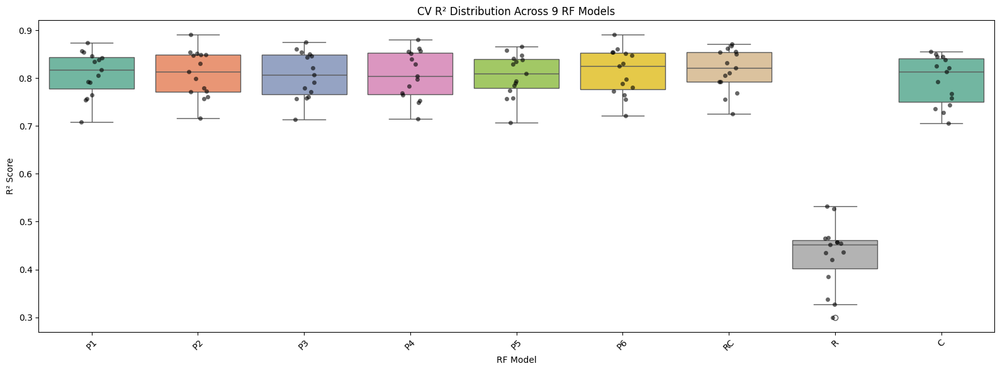

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------------
# Your CV results
# -----------------------------------------
pls_results = {

"P1": [0.8422356744338038, 0.8385648756479426, 0.7911965401095971, 0.7575477657076592, 0.7920102728053872, 0.873578773145677, 0.8050432842615316, 0.7641660669451754, 0.8543496934062592, 0.7546995521227822, 0.7087419865069637, 0.8462438677868369, 0.8348814443939925, 0.8178727708834881, 0.8564876893707044],
"P2": [0.8493424154043155, 0.8493617378020217, 0.7724750287869486, 0.7713718698087773, 0.7797775305292363, 0.8907516115569981, 0.7989879297318725, 0.7571306768019599, 0.8513461342629909, 0.7612978865636615, 0.716641693143055, 0.8477893399103447, 0.8310116291133095, 0.8129160355678368, 0.853911158068855],
"P3": [0.8439452337650869, 0.8469011864909416, 0.7796393302520902, 0.7586745083100399, 0.771034330319093, 0.8750087255020635, 0.7907938609240487, 0.7608373333203627, 0.8608103067774712, 0.7570091892247235, 0.7130875326560959, 0.8503646996669636, 0.8211780609307519, 0.8071912782027849, 0.8548066046615103],
"P4": [0.8401012495315896, 0.851383385665412, 0.7687004458819121, 0.764772493633875, 0.7827623487308307, 0.8808977987011688, 0.7978801236507219, 0.753147189770894, 0.8564816815125893, 0.7487378092325127, 0.7148999197086765, 0.8617515988330915, 0.8297351895336261, 0.8045744473793907, 0.8555055694774137],
"P5": [0.8345166813575939, 0.8412502044462428, 0.7943113211409905, 0.756729821839615, 0.7848192834474356, 0.8659051160747742, 0.7900093222718958, 0.7582510662543134, 0.8582045205765017, 0.7736569734332785, 0.7076206433234028, 0.8390262644321879, 0.8289458101357761, 0.8090729620823938, 0.8471957183407677],
"P6": [0.8300913025639022, 0.8604631601845222, 0.7800445283603714, 0.8248305839521322, 0.7645940061718595, 0.8911925254584945, 0.7974888990774871, 0.7732126402337829, 0.8519438754589648, 0.7557601030341409, 0.7220559081392677, 0.854460705534767, 0.8474403963210349, 0.7882908000240968, 0.8535544381565747],
"RC": [0.8618135363176068, 0.8111366104034156, 0.7921581331521467, 0.769011950777317, 0.8552467981431031, 0.8544237295958714, 0.8059131644224248, 0.8667744775200871, 0.8209748162618901, 0.7249176679332986, 0.8323778900275212, 0.8502842778084083, 0.7918715331698869, 0.7553173723091063, 0.8715114296523649],
"R": [0.4578908224363416, 0.4514420109043422, 0.436406258647728, 0.4548912148976503, 0.32730570923359736, 0.4658706861717744, 0.42036732405520616, 0.33816704556158117, 0.5275443585800426, 0.38492706280834155, 0.2993442864270148, 0.4656313138245002, 0.5326408226367527, 0.43448035395173623, 0.4578182082743105],
"C": [0.8503062994103829, 0.844356483655449, 0.757615450420045, 0.727559863006586, 0.7671402229079912, 0.8550016966410025, 0.7919831633497989, 0.7361593120981509, 0.8382801111176461, 0.7432981746212248, 0.7060030812174087, 0.8252132297057665, 0.8219348792484956, 0.8130459962658445, 0.8451710841621045]
}

# -----------------------------------------
# Your test R² values
# -----------------------------------------
test_r2 = {

"P1":   0.851,
"P2":   0.838,
"P3":   0.843,
"P4": 0.839,
"P5": 0.837,
"P6":  0.844,
"RC": 0.757,
"R": 0.465,
"C":0.845
}

# -----------------------------------------
# Convert dictionary → long-format DataFrame
# -----------------------------------------
df = pd.DataFrame(pls_results)
df_melted = df.melt(var_name="Model", value_name="R2")

# -----------------------------------------
# Plot: Individual boxplots for each model
# -----------------------------------------
plt.figure(figsize=(16, 6))
sns.boxplot(data=df_melted, x="Model", y="R2", palette="Set2")
sns.stripplot(data=df_melted, x="Model", y="R2", color="black", alpha=0.6, jitter=True)

# # -----------------------------------------
# # Add full-width red horizontal lines at each model's median
# # -----------------------------------------
# medians = df_melted.groupby("Model")["R2"].median()
# for model, median_value in medians.items():
#     plt.axhline(y=median_value, color="red", linestyle="--", linewidth=1.5)
#     plt.text(
#         x=-0.4,
#         y=median_value,
#         s=f"{median_value:.3f}",
#         color="red",
#         va="center",
#         ha="right",
#         fontsize=10,
#         fontweight="bold"
#     )

# -----------------------------------------
# Add full-width blue horizontal lines for test R²
# -----------------------------------------
# for model, test_value in test_r2.items():
#     plt.axhline(y=test_value, color="blue", linestyle="--", linewidth=1.5)
#     plt.text(
#         x=len(test_r2) + 0.4,
#         y=test_value,
#         s=f"Test R² {model}: {test_value:.3f}",
#         color="blue",
#         va="center",
#         ha="left",
#         fontsize=10,
#         fontweight="bold"
#     )

# -----------------------------------------
# Labels and formatting
# -----------------------------------------
plt.title("CV R² Distribution Across 9 RF Models")
plt.xlabel("RF Model")
plt.ylabel("R² Score")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [3]:
import numpy as np
pls_results = {

"P1": [0.8422356744338038, 0.8385648756479426, 0.7911965401095971, 0.7575477657076592, 0.7920102728053872, 0.873578773145677, 0.8050432842615316, 0.7641660669451754, 0.8543496934062592, 0.7546995521227822, 0.7087419865069637, 0.8462438677868369, 0.8348814443939925, 0.8178727708834881, 0.8564876893707044],
"P2": [0.8493424154043155, 0.8493617378020217, 0.7724750287869486, 0.7713718698087773, 0.7797775305292363, 0.8907516115569981, 0.7989879297318725, 0.7571306768019599, 0.8513461342629909, 0.7612978865636615, 0.716641693143055, 0.8477893399103447, 0.8310116291133095, 0.8129160355678368, 0.853911158068855],
"P3": [0.8439452337650869, 0.8469011864909416, 0.7796393302520902, 0.7586745083100399, 0.771034330319093, 0.8750087255020635, 0.7907938609240487, 0.7608373333203627, 0.8608103067774712, 0.7570091892247235, 0.7130875326560959, 0.8503646996669636, 0.8211780609307519, 0.8071912782027849, 0.8548066046615103],
"P4": [0.8401012495315896, 0.851383385665412, 0.7687004458819121, 0.764772493633875, 0.7827623487308307, 0.8808977987011688, 0.7978801236507219, 0.753147189770894, 0.8564816815125893, 0.7487378092325127, 0.7148999197086765, 0.8617515988330915, 0.8297351895336261, 0.8045744473793907, 0.8555055694774137],
"P5": [0.8345166813575939, 0.8412502044462428, 0.7943113211409905, 0.756729821839615, 0.7848192834474356, 0.8659051160747742, 0.7900093222718958, 0.7582510662543134, 0.8582045205765017, 0.7736569734332785, 0.7076206433234028, 0.8390262644321879, 0.8289458101357761, 0.8090729620823938, 0.8471957183407677],
"P6": [0.8300913025639022, 0.8604631601845222, 0.7800445283603714, 0.8248305839521322, 0.7645940061718595, 0.8911925254584945, 0.7974888990774871, 0.7732126402337829, 0.8519438754589648, 0.7557601030341409, 0.7220559081392677, 0.854460705534767, 0.8474403963210349, 0.7882908000240968, 0.8535544381565747],
"RC": [0.8618135363176068, 0.8111366104034156, 0.7921581331521467, 0.769011950777317, 0.8552467981431031, 0.8544237295958714, 0.8059131644224248, 0.8667744775200871, 0.8209748162618901, 0.7249176679332986, 0.8323778900275212, 0.8502842778084083, 0.7918715331698869, 0.7553173723091063, 0.8715114296523649],
"R": [0.4578908224363416, 0.4514420109043422, 0.436406258647728, 0.4548912148976503, 0.32730570923359736, 0.4658706861717744, 0.42036732405520616, 0.33816704556158117, 0.5275443585800426, 0.38492706280834155, 0.2993442864270148, 0.4656313138245002, 0.5326408226367527, 0.43448035395173623, 0.4578182082743105],
"C": [0.8503062994103829, 0.844356483655449, 0.757615450420045, 0.727559863006586, 0.7671402229079912, 0.8550016966410025, 0.7919831633497989, 0.7361593120981509, 0.8382801111176461, 0.7432981746212248, 0.7060030812174087, 0.8252132297057665, 0.8219348792484956, 0.8130459962658445, 0.8451710841621045]
}

results = {}

for key, values in pls_results.items():
    arr = np.array(values)
    median = np.median(arr)
    mean = np.mean(arr)
    std = np.std(arr, ddof=1)  # sample standard deviation
    results[key] = (
        # round(median, 3),
        round(mean, 3),
        round(std, 3)
    )

results


print(results)

{'P1': (0.809, 0.047), 'P2': (0.81, 0.049), 'P3': (0.806, 0.048), 'P4': (0.807, 0.05), 'P5': (0.806, 0.045), 'P6': (0.813, 0.048), 'RC': (0.818, 0.044), 'R': (0.43, 0.067), 'C': (0.795, 0.051)}


Computing ICE plot for: Baseline FVC Volume L


/tmp/ipykernel_1961256/2166719194.py:77: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=True)


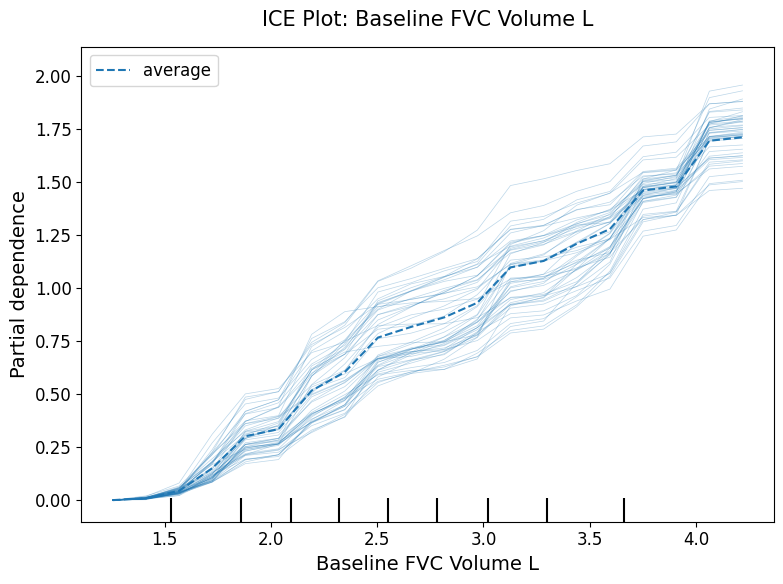

Computing ICE plot for: FEV1 Volume L


/tmp/ipykernel_1961256/2166719194.py:77: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=True)


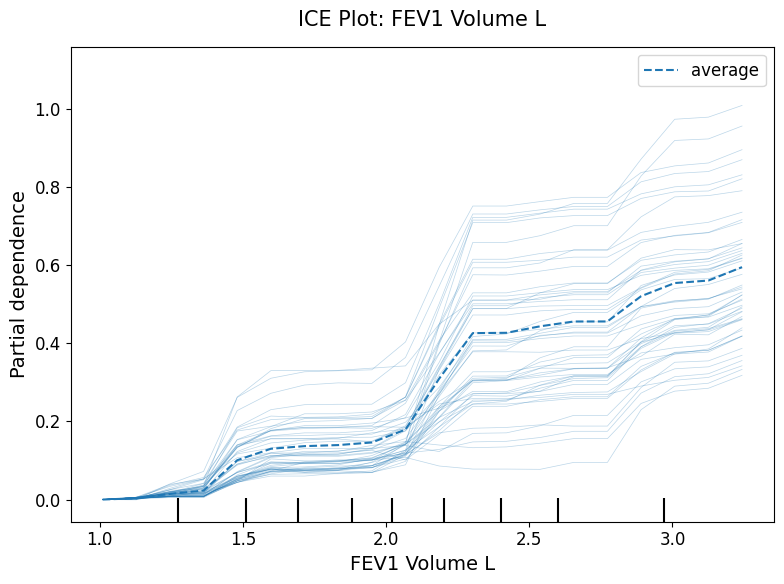

Computing ICE plot for: log-sigma-5-0-mm-3D_ngtdm_Busyness_right_lung


/tmp/ipykernel_1961256/2166719194.py:77: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=True)


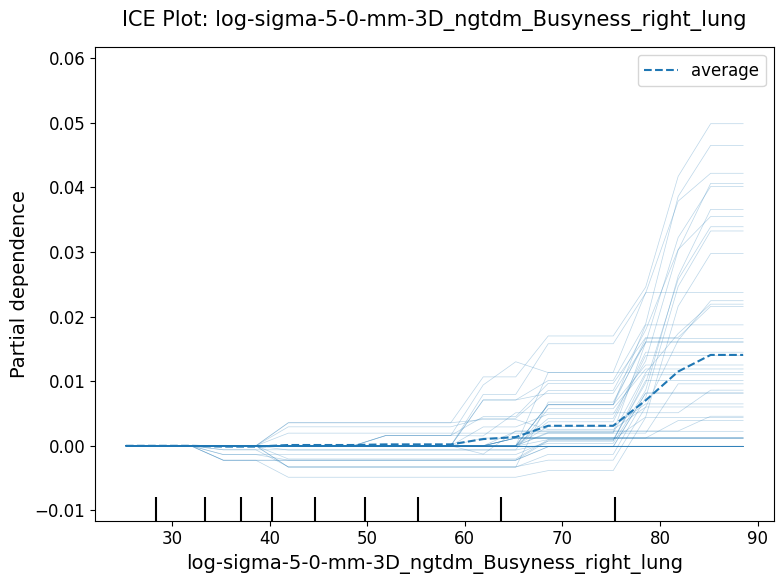

Computing ICE plot for: original_shape_MinorAxisLength_left_lung


/tmp/ipykernel_1961256/2166719194.py:77: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=True)


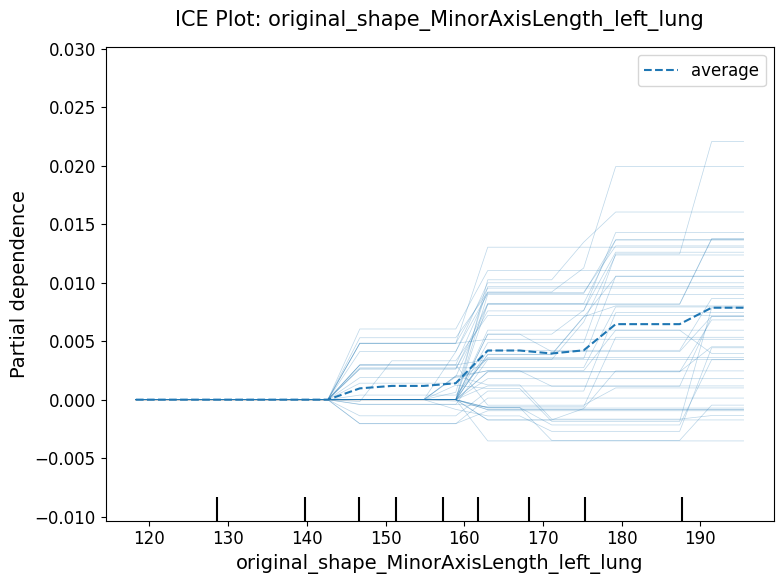

Computing ICE plot for: wavelet-LHL_glrlm_LongRunLowGrayLevelEmphasis_left_lung


/tmp/ipykernel_1961256/2166719194.py:77: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', frameon=True)


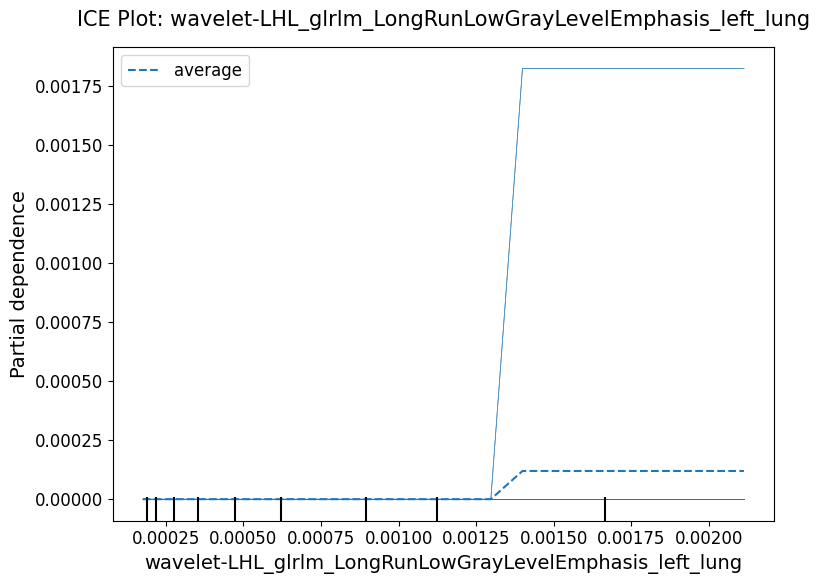

In [7]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Load Model and Data
# ---------------------------------------------------------
model = joblib.load("/home/pansurya/OSIC_thesis/RF_model/RF_With_All_Clinical_Radiomics_without_harmonization.pkl")
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")

# Prepare data (matching your training preprocessing)
X_train_log = X_train.copy()
X_test_log  = X_test.copy()

for col in ['Age']:
    X_train_log[col] = np.log1p(X_train_log[col]) # Using log1p is safer for math
    X_test_log[col] = np.log1p(X_test_log[col])

imp_median = SimpleImputer(strategy='median')
X_train_filled = pd.DataFrame(imp_median.fit_transform(X_train_log), columns=X_train_log.columns)
X_test_filled = pd.DataFrame(imp_median.transform(X_test_log), columns=X_test_log.columns)

# 1. Define the top 5 features
top_5_features = [
    "Baseline FVC Volume L", 
    "FEV1 Volume L",
    "log-sigma-5-0-mm-3D_ngtdm_Busyness_right_lung",
    "original_shape_MinorAxisLength_left_lung",
    "wavelet-LHL_glrlm_LongRunLowGrayLevelEmphasis_left_lung"
]

# 2. Set global font sizes
plt.rcParams.update({
    'font.size': 12, 
    'axes.labelsize': 14, 
    'ytick.labelsize': 12,
    'xtick.labelsize': 12
})

# 3. Loop through each feature to create individual figures
for feature in top_5_features:
    fig, ax = plt.subplots(figsize=(8, 6))
    
    print(f"Computing ICE plot for: {feature}")
    
    # Generate the plot
    display = PartialDependenceDisplay.from_estimator(
        model, 
        X_train_filled, 
        features=[feature],
        kind='both', 
        centered=True,   
        subsample=50,      
        ax=ax,
        grid_resolution=20
    )

    # 4. Universal Styling (Works across all scikit-learn versions)
    # We grab all lines currently on the axis
    all_lines = ax.get_lines()
    
    if len(all_lines) > 0:
        # ICE lines are all lines EXCEPT the last one
        for ice_line in all_lines[:-1]:
            ice_line.set_color('#3274a1')  # Steel Blue
            ice_line.set_alpha(0.3)
            ice_line.set_linewidth(1.0)
            ice_line.set_label('_nolegend_')

        # The PDP (Average) line is always the LAST line added to the plot
        pdp_line = all_lines[-1]
        pdp_line.set_color('#c03d3e')   # Red
        pdp_line.set_linestyle('--')    # Dashed
        pdp_line.set_linewidth(3)
        pdp_line.set_label('Average (PDP)')

    # 5. Final Formatting
    ax.legend(loc='upper left', frameon=True)
    ax.set_title(f"ICE Plot: {feature}", fontsize=15, pad=15)
    ax.grid(True, linestyle='--', alpha=0.6)
    
    plt.tight_layout()
    plt.show()

Generating One-way PDP for: Baseline FVC Volume L


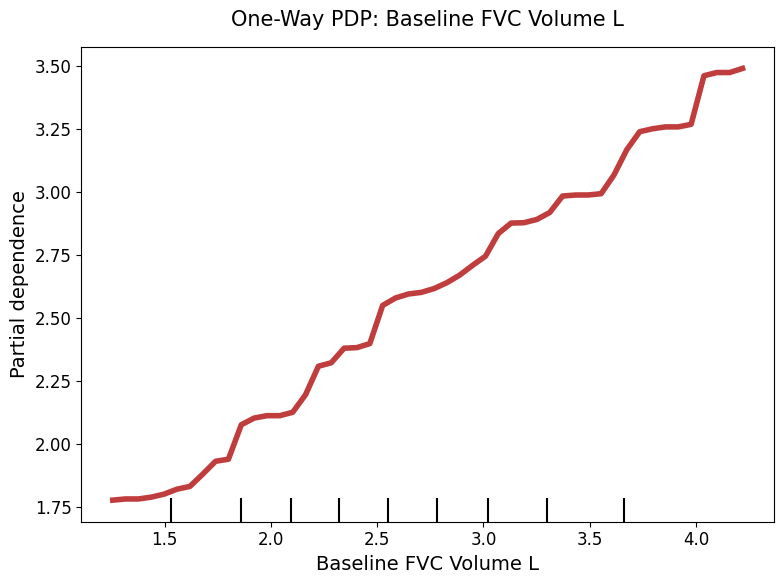

Generating One-way PDP for: FEV1 Volume L


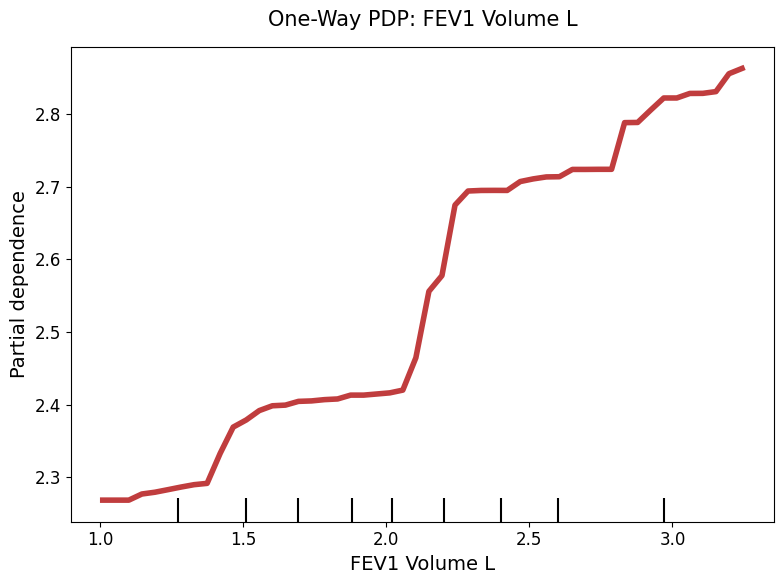

Generating One-way PDP for: log-sigma-5-0-mm-3D_ngtdm_Busyness_right_lung


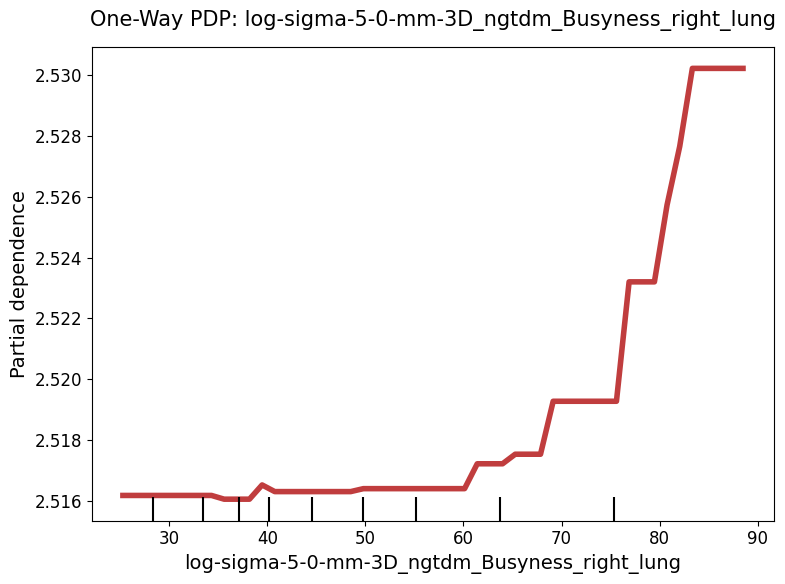

Generating One-way PDP for: original_shape_MinorAxisLength_left_lung


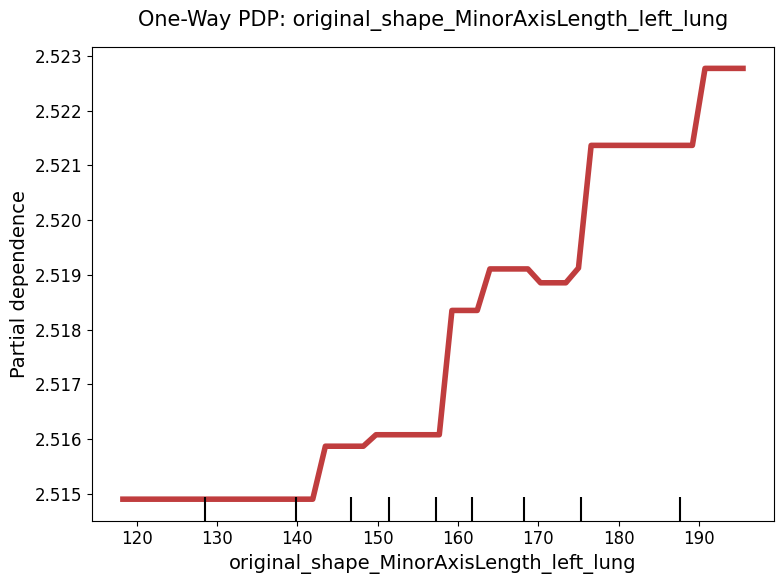

Generating One-way PDP for: wavelet-LHL_glrlm_LongRunLowGrayLevelEmphasis_left_lung


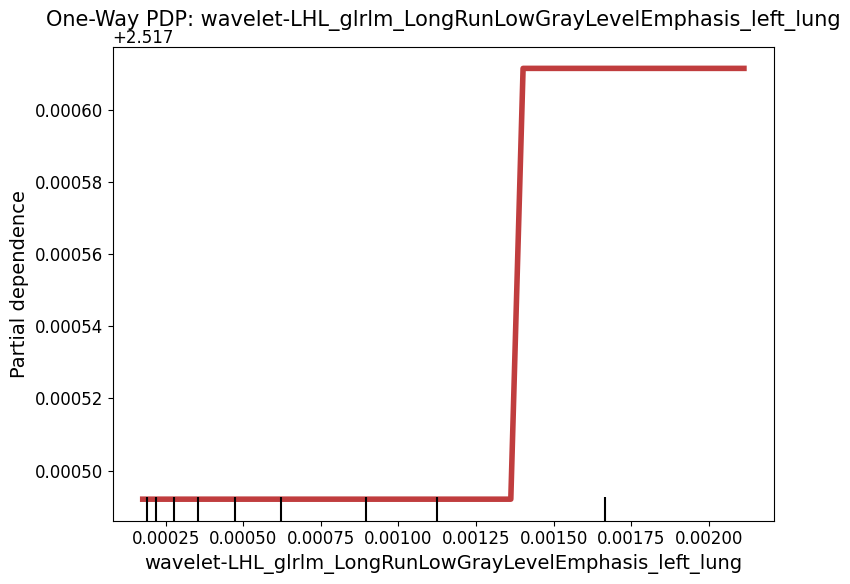

Generating Two-way Interaction PDP...


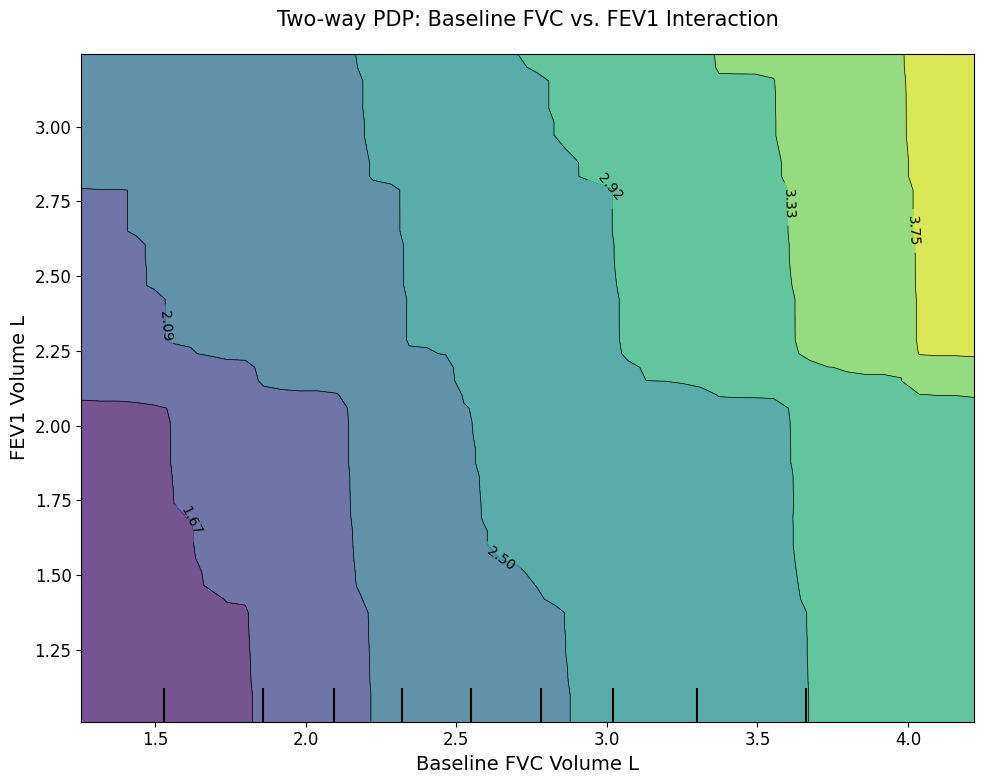

In [5]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

# 1. Define the features for analysis
top_5_features = [
    "Baseline FVC Volume L", 
    "FEV1 Volume L",
    "log-sigma-5-0-mm-3D_ngtdm_Busyness_right_lung",
    "original_shape_MinorAxisLength_left_lung",
    "wavelet-LHL_glrlm_LongRunLowGrayLevelEmphasis_left_lung" 
]

# Define the 2-way interaction pair
interaction_pair = [("Baseline FVC Volume L", "FEV1 Volume L")]

# 2. Set global font sizes for thesis quality
plt.rcParams.update({
    'font.size': 12, 
    'axes.labelsize': 14, 
    'ytick.labelsize': 12,
    'xtick.labelsize': 12
})

# ---------------------------------------------------------
# Part A: One-Way PDP (5 Individual Plots)
# ---------------------------------------------------------
for feature in top_5_features:
    fig, ax = plt.subplots(figsize=(8, 6))
    print(f"Generating One-way PDP for: {feature}")
    
    display = PartialDependenceDisplay.from_estimator(
        model, 
        X_train_filled, 
        features=[feature],
        kind='average', # PDP shows the average marginal effect
        ax=ax,
        grid_resolution=50
    )
    
    # Robust Styling for One-Way Lines
    if hasattr(display, 'lines_') and display.lines_ is not None:
        line_obj = display.lines_[0, 0]
        # Check if it's a list/array of lines or a single Line2D object
        if isinstance(line_obj, (list, np.ndarray)):
            for line in line_obj:
                line.set_color('#c03d3e')
                line.set_linewidth(4)
        else:
            # It's a single Line2D object
            line_obj.set_color('#c03d3e')
            line_obj.set_linewidth(4)
    
    ax.set_title(f"One-Way PDP: {feature}", fontsize=15, pad=15)
    ax.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
# Part B: Two-Way PDP (Interaction Plot)
# ---------------------------------------------------------
print("Generating Two-way Interaction PDP...")
# Two-way plots create a contour map to show how features interact
fig, ax = plt.subplots(figsize=(10, 8))

display_2way = PartialDependenceDisplay.from_estimator(
    model,
    X_train_filled,
    features=interaction_pair,
    ax=ax,
    grid_resolution=50
)



plt.title("Two-way PDP: Baseline FVC vs. FEV1 Interaction", fontsize=15, pad=20)
plt.tight_layout()
plt.show()